In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

from utils import mnist, plot_graphs, plot_mnist
import numpy as np
import os 

%matplotlib inline

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [4]:
gpu = True

In [5]:
root_folder = 'FC_VAE_log_results'
fixed_folder = root_folder + '/Fixed_results'
AE_folder = root_folder + '/AE_results'

if os.path.isdir(root_folder):
    !rm -r $root_folder
os.mkdir(root_folder)
os.mkdir(fixed_folder)
os.mkdir(AE_folder)

In [6]:
mnist_tanh = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
           ])

In [7]:
train_loader, valid_loader, test_loader = mnist(valid=10000, transform=mnist_tanh)
fixed_z = torch.randn((50, 10))
fixed_data, _ = next(iter(test_loader))
if gpu:
    fixed_z = fixed_z.to(device)
    fixed_data = fixed_data.to(device)

In [8]:
# мои правки
lr = 0.0001

In [9]:
# class FullyConnected(nn.Module):
#     def __init__(self, sizes, dropout=False, activation_fn=nn.Tanh, flatten=False):
#         super(FullyConnected, self).__init__()
#         layers = []
#         self.flatten = flatten
#         for i in range(len(sizes) - 2):
#             layers.append(nn.Linear(sizes[i], sizes[i+1]))
#             if dropout:
#                 layers.append(nn.Dropout())
#             layers.append(activation_fn())
#         else: # нам не нужен дропаут и фнкция активации в последнем слое
#             layers.append(nn.Linear(sizes[-2], sizes[-1]))
        
#         self.model = nn.Sequential(*layers)
        
#     def forward(self, x):
#         if self.flatten:
#             x = x.view(x.shape[0], -1)
#         return self.model(x)

In [10]:
class FullyConnected(nn.Module):
    def __init__(self, sizes, dropout=False, activation_fn=nn.Tanh(), flatten=False, last_fn=None):
        super(FullyConnected, self).__init__()
        layers = []
        self.flatten = flatten
        for i in range(len(sizes) - 2):
            layers.append(nn.Linear(sizes[i], sizes[i+1]))
            if dropout:
                layers.append(nn.Dropout(dropout))
            layers.append(activation_fn) # нам не нужен дропаут и фнкция активации в последнем слое
        else: 
            layers.append(nn.Linear(sizes[-2], sizes[-1]))
        if last_fn is not None:
            layers.append(last_fn)
        self.model = nn.Sequential(*layers)
        
    def forward(self, x):
        if self.flatten:
            x = x.view(x.shape[0], -1)
        return self.model(x)

In [11]:
class Net(nn.Module):
    def __init__(self, latent_size=32, gamma=1e-3, batchnorm=False, dropout=False, optim_type='SGD', **optim_params):
        super(Net, self).__init__()
    
        self.latent_size = latent_size
        self.gamma = gamma

        self.fce = FullyConnected([784, 512, 128, latent_size*2], dropout=0.3, activation_fn=nn.LeakyReLU(0.2), flatten=True)
        self.fcd = FullyConnected([latent_size, 128, 512, 784], activation_fn=nn.LeakyReLU(0.2), last_fn=nn.Tanh())
        
        self._loss = None
        if gpu:
            self.to(device)
        
        if optim_type == 'SGD':
            self.optim = optim.SGD(self.parameters(), **optim_params)
        elif optim_type == 'Adadelta':
            self.optim = optim.Adadelta(self.parameters(), **optim_params)
        elif optim_type == 'RMSProp':
            self.optim = optim.RMSprop(self.parameters(), **optim_params)
        elif optim_type == 'Adam':
            self.optim = optim.Adam(self.parameters(), **optim_params)
    
    def encode(self, x):
        h = self.fce(x)
        self.mu, self.logvar = h.split(self.latent_size, dim=1)
        return self.mu, self.logvar
    
    def decode(self, h):
        flatten = torch.tanh(self.fcd(h))
        x = flatten.view(-1, 1, 28, 28)
        return x
    
    def forward(self, x):
        mu, logvar = self.encode(x)
        if self.training:
            std = logvar.mul(0.5).exp()
            res = self._sample(mu.shape[0])
            if gpu:
                res = res.to(device)
            h = res * std + mu
        else:
            h = mu
        x = self.decode(h)
        return x
    
    def _sample(self, n):
        return torch.randn([n, self.latent_size])

    # мои правки
    def loss(self, output, target, disc_loss=torch.Tensor([0]), size_average=True):
#         KLD = self.mu**2 + self.logvar.exp() - 1 - self.logvar
#         KLD = 0.5*KLD.sum(1)
        if size_average:
#             self.KLD = KLD.mean()
            self.disc_loss = disc_loss.mean()
            self._loss = F.mse_loss(output, target, reduction='mean')
        else:
#             self.KLD = KLD.sum()
            self.disc_loss = disc_loss.sum()
            self._loss = F.mse_loss(output, target, reduction='sum')
        
        return self._loss + self.gamma*self.disc_loss

In [12]:
# мои правки
latent_size = 10

In [13]:
models = {'AAE10': Net(latent_size, 0.005, batchnorm=True, dropout=False, optim_type='Adam', lr=1e-4)}
train_log = {k: [] for k in models}
test_log = {k: [] for k in models}

In [14]:
# мои правки
D = FullyConnected([latent_size, 1024, 512, 256, 1], dropout=0.3, activation_fn=nn.LeakyReLU(0.2), flatten=True)
D.to(device)
D_optimizer = optim.Adam(D.parameters(), lr=lr)

In [15]:
# мои правки

batch_zeros = torch.zeros((100, 1)).to(device)
batch_ones = torch.ones((100, 1)).to(device)

In [16]:
def train(epoch, models, log=None):
    train_size = len(train_loader.sampler)
    for batch_idx, (data, _) in enumerate(train_loader):
        valid = torch.autograd.Variable(torch.Tensor(data.shape[0]*2, 1).fill_(1.0), requires_grad=False).to(device)
        fake = torch.autograd.Variable(torch.Tensor(data.shape[0]*2, 1).fill_(0.0), requires_grad=False).to(device)
        if gpu:
            data = data.to(device)
        for model in models.values():
            # мои правки
            # учим дискриминатор
            model.optim.zero_grad()
            D.zero_grad()
            ae_data = torch.cat(model.encode(data))
            z_real_gauss = torch.autograd.Variable(torch.randn(ae_data.shape[0], latent_size)).to(device)
#             print(ae_data.shape)
#             print(z_real_gauss.shape)
            fake_pred = D(ae_data)
            true_pred = D(z_real_gauss)
            
            fake_loss = F.binary_cross_entropy_with_logits(fake_pred, fake)
            true_loss = F.binary_cross_entropy_with_logits(true_pred, valid)
            D_loss = 0.5*(fake_loss + true_loss)
            D_loss.backward(retain_graph=True)
            D_optimizer.step()
            
            # train model
            model.optim.zero_grad()
            D.zero_grad()
            output = model(data)
            loss = model.loss(output, data, disc_loss=D_loss)
            
            loss.backward()
            model.optim.step()
            

            
            
        if batch_idx % 200 == 0:
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = ' '.join(['{}: {:.4f}'.format(k, m._loss.item()) for k, m in models.items()])
            print(line + losses)
            
    else:
        batch_idx += 1
        line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
            epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
        losses = ' '.join(['{}: {:.4f}'.format(k, m._loss.item()) for k, m in models.items()])
        if log is not None:
            for k in models:
                log[k].append((models[k]._loss,))
        print(line + losses)

In [17]:
def test(models, loader, epoch, log=None):
    test_size = len(loader)
    test_reconstruction_loss = {k: 0. for k in models}
#     test_KL_loss = {k: 0. for k in models}
    with torch.no_grad():
        for data, _ in loader:
            if gpu:
                data = data.to(device)
            output = {k: m(data) for k, m in models.items()}
            for k, m in models.items():
                m.loss(output[k], data)
                test_reconstruction_loss[k] += m._loss.item()
#                 test_KL_loss[k] += m.KLD.item()
    
    for k in models:
        test_reconstruction_loss[k] /= test_size
#         test_KL_loss[k] /= test_size
    report = 'Test losses: ' + ' '.join(['{}: {:.4f}'.format(k, 
                                                                    test_reconstruction_loss[k]) for k in models])
    for k in models:
        if log is not None:
            log[k].append((test_reconstruction_loss[k]))
        with torch.no_grad():
            ae_data = models[k](fixed_data).data.cpu().numpy()
            fixed_gen = models[k].decode(fixed_z).data.cpu().numpy()
            plot_mnist(ae_data, (5, 10), True, AE_folder + '/%s_%03d.png' % (k, epoch))
            plot_mnist(fixed_gen, (5, 10), True, fixed_folder + '/%s_%03d.png' % (k, epoch))
    print(report)

Train Epoch: 1 [0/50000 (0%)]	Losses AAE10: 0.9342
Train Epoch: 1 [10000/50000 (20%)]	Losses AAE10: 0.3015
Train Epoch: 1 [20000/50000 (40%)]	Losses AAE10: 0.2385
Train Epoch: 1 [30000/50000 (60%)]	Losses AAE10: 0.2436
Train Epoch: 1 [40000/50000 (80%)]	Losses AAE10: 0.1987
Train Epoch: 1 [50000/50000 (100%)]	Losses AAE10: 0.1947


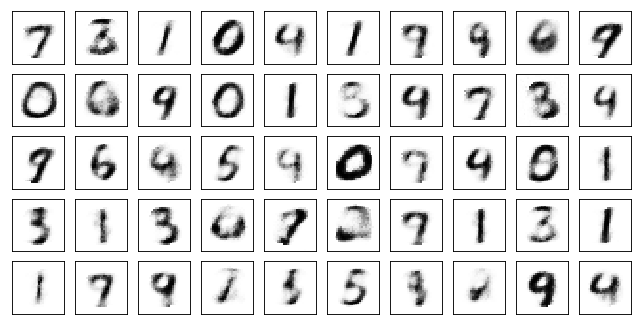

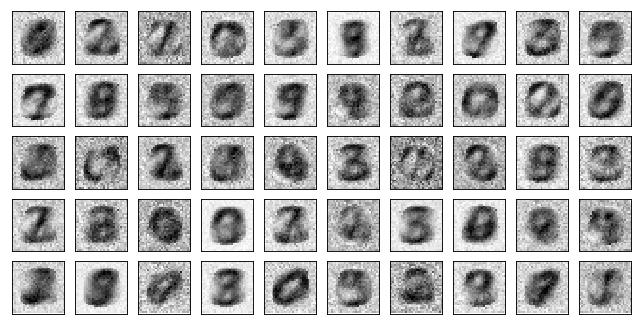

Test losses: AAE10: 0.1806
Train Epoch: 2 [0/50000 (0%)]	Losses AAE10: 0.1848
Train Epoch: 2 [10000/50000 (20%)]	Losses AAE10: 0.1944
Train Epoch: 2 [20000/50000 (40%)]	Losses AAE10: 0.1696
Train Epoch: 2 [30000/50000 (60%)]	Losses AAE10: 0.1682
Train Epoch: 2 [40000/50000 (80%)]	Losses AAE10: 0.1708
Train Epoch: 2 [50000/50000 (100%)]	Losses AAE10: 0.1551


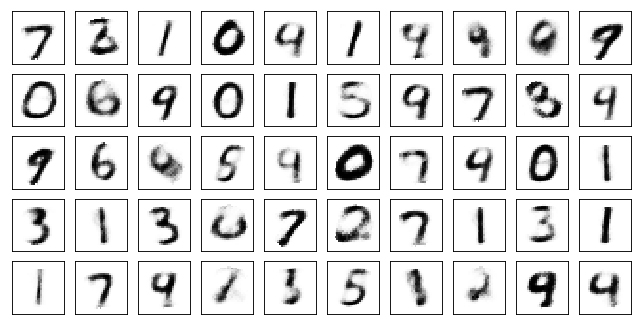

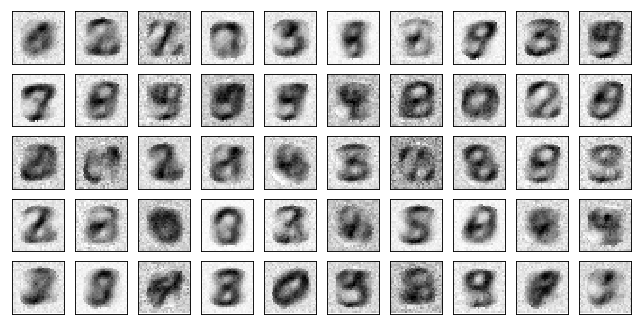

Test losses: AAE10: 0.1513
Train Epoch: 3 [0/50000 (0%)]	Losses AAE10: 0.1677
Train Epoch: 3 [10000/50000 (20%)]	Losses AAE10: 0.1599
Train Epoch: 3 [20000/50000 (40%)]	Losses AAE10: 0.1490
Train Epoch: 3 [30000/50000 (60%)]	Losses AAE10: 0.1477
Train Epoch: 3 [40000/50000 (80%)]	Losses AAE10: 0.1358
Train Epoch: 3 [50000/50000 (100%)]	Losses AAE10: 0.1565


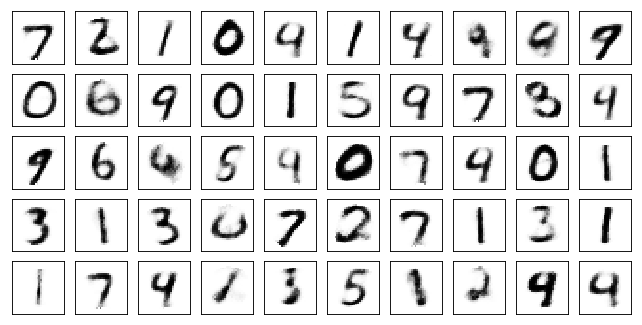

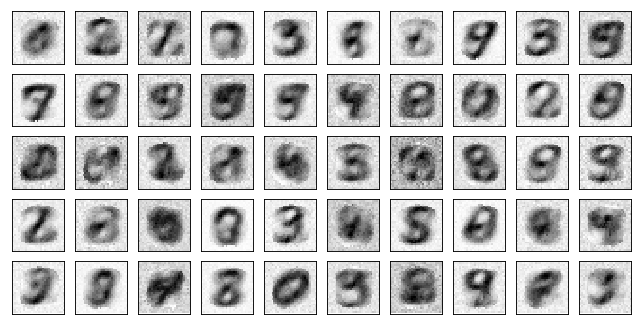

Test losses: AAE10: 0.1404
Train Epoch: 4 [0/50000 (0%)]	Losses AAE10: 0.1482
Train Epoch: 4 [10000/50000 (20%)]	Losses AAE10: 0.1477
Train Epoch: 4 [20000/50000 (40%)]	Losses AAE10: 0.1460
Train Epoch: 4 [30000/50000 (60%)]	Losses AAE10: 0.1481
Train Epoch: 4 [40000/50000 (80%)]	Losses AAE10: 0.1436
Train Epoch: 4 [50000/50000 (100%)]	Losses AAE10: 0.1403


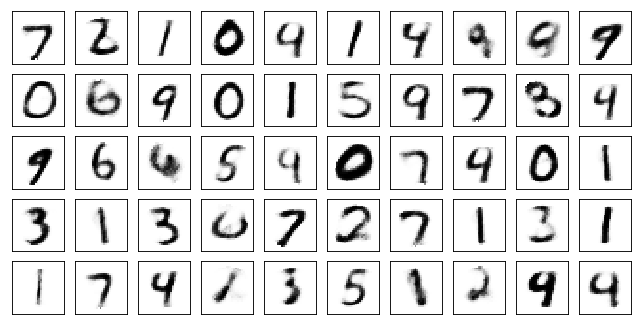

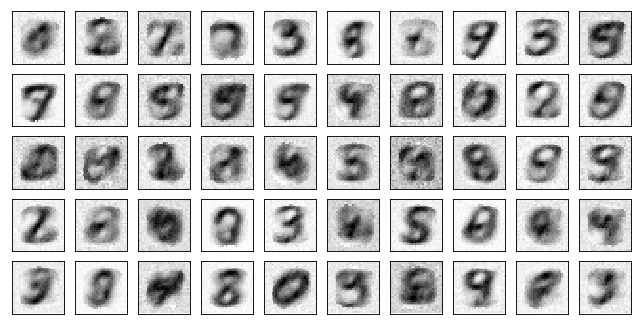

Test losses: AAE10: 0.1345
Train Epoch: 5 [0/50000 (0%)]	Losses AAE10: 0.1421
Train Epoch: 5 [10000/50000 (20%)]	Losses AAE10: 0.1506
Train Epoch: 5 [20000/50000 (40%)]	Losses AAE10: 0.1424
Train Epoch: 5 [30000/50000 (60%)]	Losses AAE10: 0.1275
Train Epoch: 5 [40000/50000 (80%)]	Losses AAE10: 0.1356
Train Epoch: 5 [50000/50000 (100%)]	Losses AAE10: 0.1341


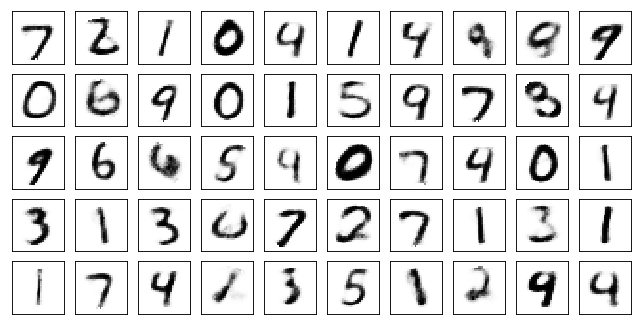

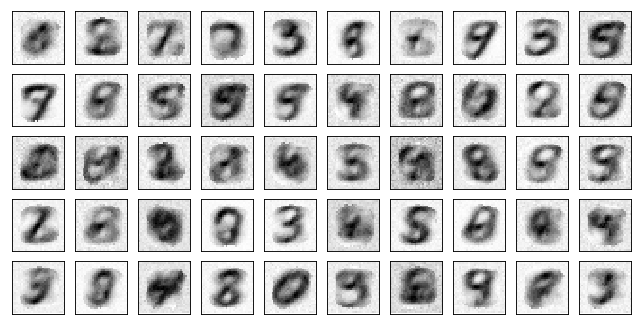

Test losses: AAE10: 0.1307
Train Epoch: 6 [0/50000 (0%)]	Losses AAE10: 0.1305
Train Epoch: 6 [10000/50000 (20%)]	Losses AAE10: 0.1275
Train Epoch: 6 [20000/50000 (40%)]	Losses AAE10: 0.1309
Train Epoch: 6 [30000/50000 (60%)]	Losses AAE10: 0.1381
Train Epoch: 6 [40000/50000 (80%)]	Losses AAE10: 0.1455
Train Epoch: 6 [50000/50000 (100%)]	Losses AAE10: 0.1376


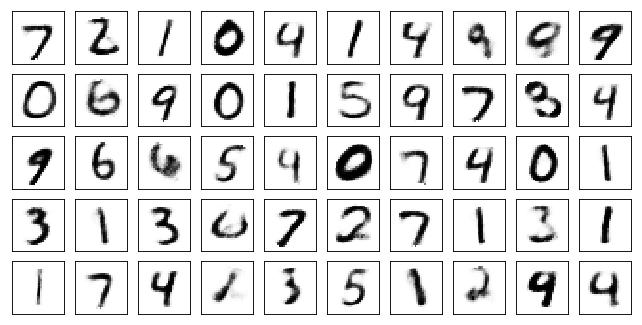

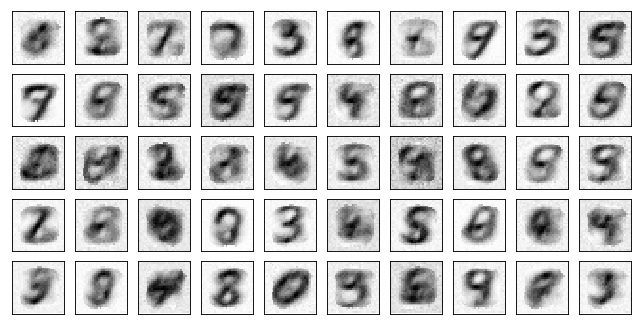

Test losses: AAE10: 0.1277
Train Epoch: 7 [0/50000 (0%)]	Losses AAE10: 0.1383
Train Epoch: 7 [10000/50000 (20%)]	Losses AAE10: 0.1291
Train Epoch: 7 [20000/50000 (40%)]	Losses AAE10: 0.1349
Train Epoch: 7 [30000/50000 (60%)]	Losses AAE10: 0.1333
Train Epoch: 7 [40000/50000 (80%)]	Losses AAE10: 0.1322
Train Epoch: 7 [50000/50000 (100%)]	Losses AAE10: 0.1390


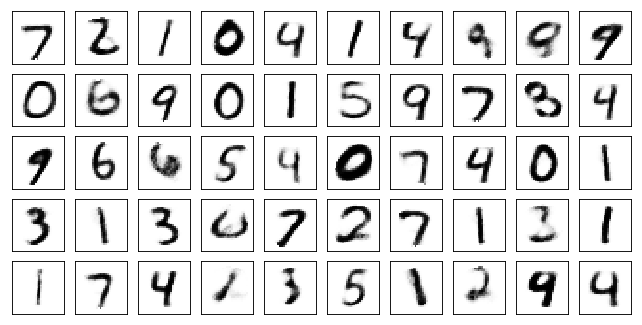

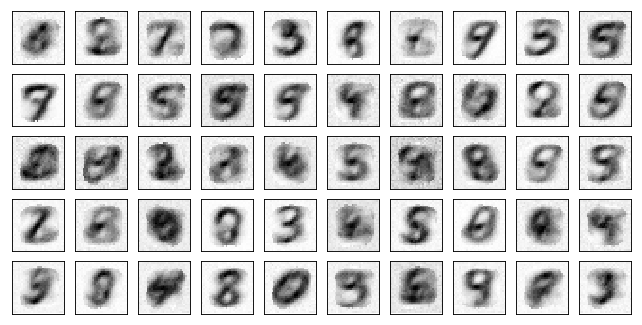

Test losses: AAE10: 0.1255
Train Epoch: 8 [0/50000 (0%)]	Losses AAE10: 0.1416
Train Epoch: 8 [10000/50000 (20%)]	Losses AAE10: 0.1337
Train Epoch: 8 [20000/50000 (40%)]	Losses AAE10: 0.1375
Train Epoch: 8 [30000/50000 (60%)]	Losses AAE10: 0.1371
Train Epoch: 8 [40000/50000 (80%)]	Losses AAE10: 0.1229
Train Epoch: 8 [50000/50000 (100%)]	Losses AAE10: 0.1290


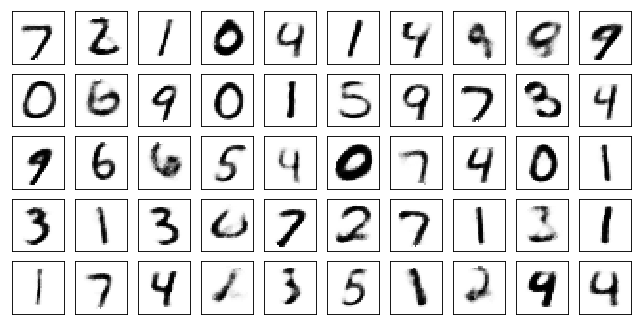

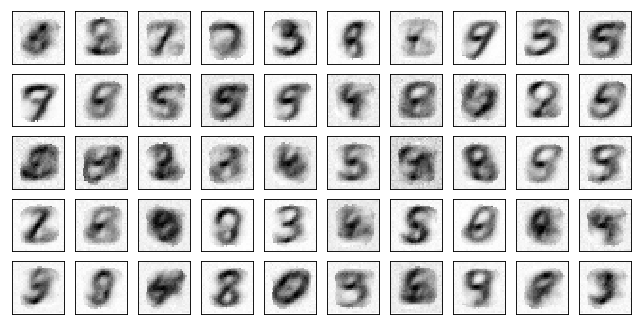

Test losses: AAE10: 0.1236
Train Epoch: 9 [0/50000 (0%)]	Losses AAE10: 0.1367
Train Epoch: 9 [10000/50000 (20%)]	Losses AAE10: 0.1348
Train Epoch: 9 [20000/50000 (40%)]	Losses AAE10: 0.1243
Train Epoch: 9 [30000/50000 (60%)]	Losses AAE10: 0.1303
Train Epoch: 9 [40000/50000 (80%)]	Losses AAE10: 0.1335
Train Epoch: 9 [50000/50000 (100%)]	Losses AAE10: 0.1333


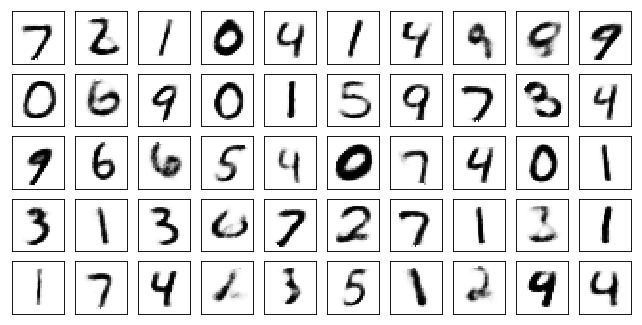

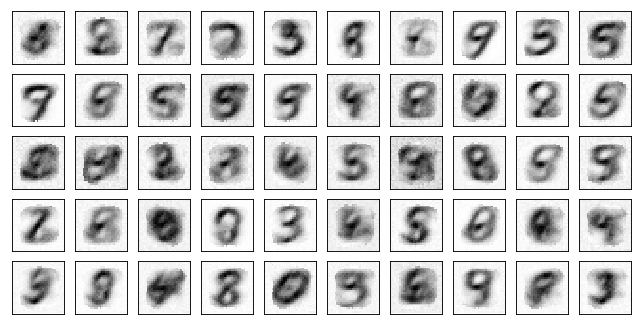

Test losses: AAE10: 0.1222
Train Epoch: 10 [0/50000 (0%)]	Losses AAE10: 0.1386
Train Epoch: 10 [10000/50000 (20%)]	Losses AAE10: 0.1226
Train Epoch: 10 [20000/50000 (40%)]	Losses AAE10: 0.1277
Train Epoch: 10 [30000/50000 (60%)]	Losses AAE10: 0.1334
Train Epoch: 10 [40000/50000 (80%)]	Losses AAE10: 0.1288
Train Epoch: 10 [50000/50000 (100%)]	Losses AAE10: 0.1294


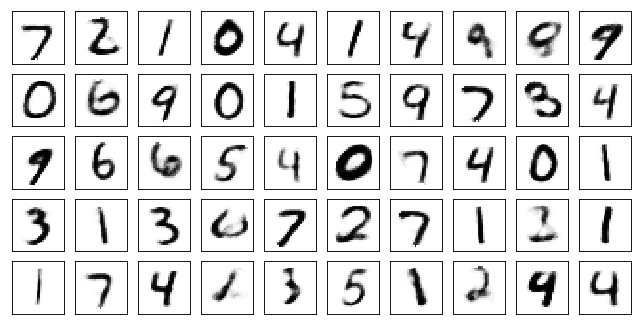

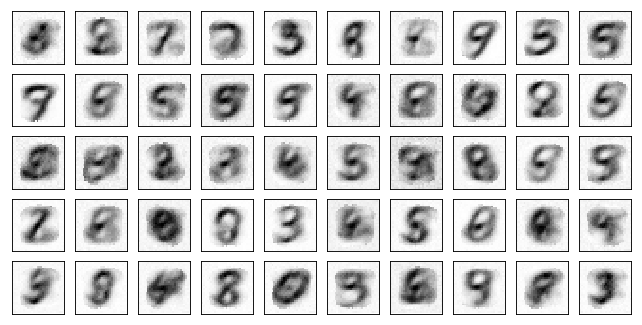

Test losses: AAE10: 0.1208
Train Epoch: 11 [0/50000 (0%)]	Losses AAE10: 0.1323
Train Epoch: 11 [10000/50000 (20%)]	Losses AAE10: 0.1442
Train Epoch: 11 [20000/50000 (40%)]	Losses AAE10: 0.1344
Train Epoch: 11 [30000/50000 (60%)]	Losses AAE10: 0.1261
Train Epoch: 11 [40000/50000 (80%)]	Losses AAE10: 0.1220
Train Epoch: 11 [50000/50000 (100%)]	Losses AAE10: 0.1216


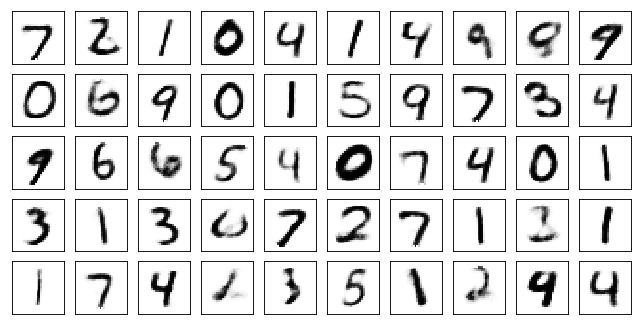

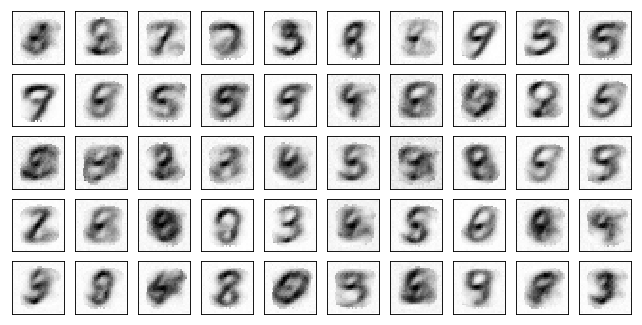

Test losses: AAE10: 0.1197
Train Epoch: 12 [0/50000 (0%)]	Losses AAE10: 0.1283
Train Epoch: 12 [10000/50000 (20%)]	Losses AAE10: 0.1303
Train Epoch: 12 [20000/50000 (40%)]	Losses AAE10: 0.1260
Train Epoch: 12 [30000/50000 (60%)]	Losses AAE10: 0.1286
Train Epoch: 12 [40000/50000 (80%)]	Losses AAE10: 0.1212
Train Epoch: 12 [50000/50000 (100%)]	Losses AAE10: 0.1374


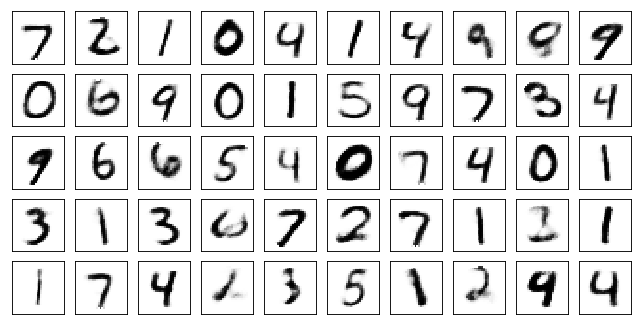

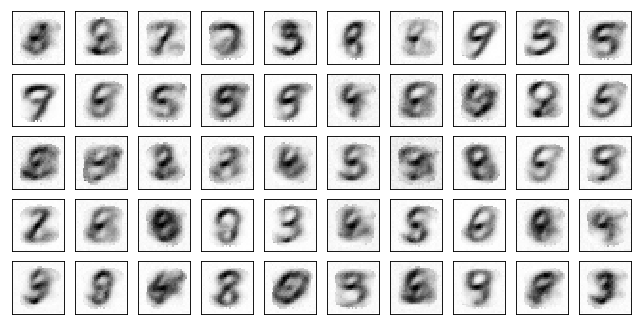

Test losses: AAE10: 0.1185
Train Epoch: 13 [0/50000 (0%)]	Losses AAE10: 0.1277
Train Epoch: 13 [10000/50000 (20%)]	Losses AAE10: 0.1336
Train Epoch: 13 [20000/50000 (40%)]	Losses AAE10: 0.1230
Train Epoch: 13 [30000/50000 (60%)]	Losses AAE10: 0.1321
Train Epoch: 13 [40000/50000 (80%)]	Losses AAE10: 0.1229
Train Epoch: 13 [50000/50000 (100%)]	Losses AAE10: 0.1323


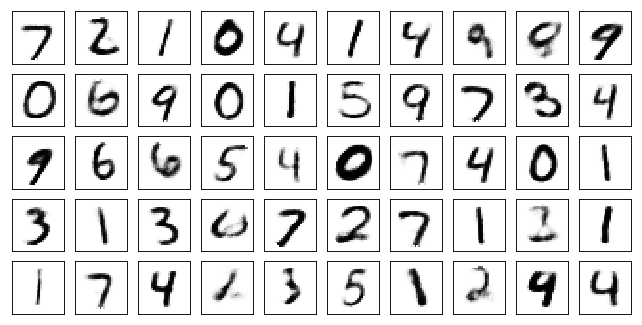

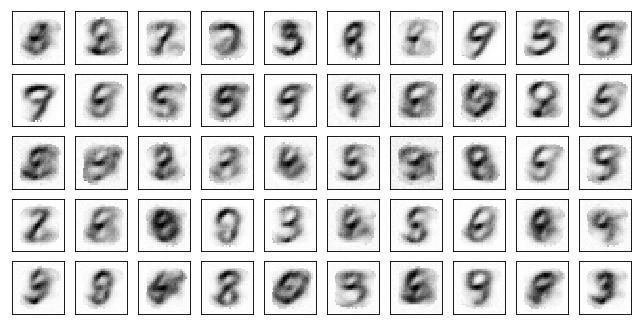

Test losses: AAE10: 0.1175
Train Epoch: 14 [0/50000 (0%)]	Losses AAE10: 0.1262
Train Epoch: 14 [10000/50000 (20%)]	Losses AAE10: 0.1326
Train Epoch: 14 [20000/50000 (40%)]	Losses AAE10: 0.1296
Train Epoch: 14 [30000/50000 (60%)]	Losses AAE10: 0.1247
Train Epoch: 14 [40000/50000 (80%)]	Losses AAE10: 0.1198
Train Epoch: 14 [50000/50000 (100%)]	Losses AAE10: 0.1347


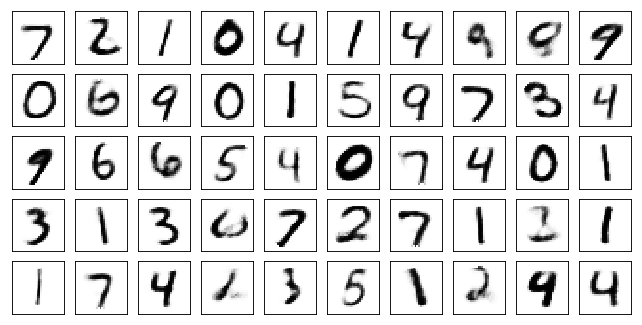

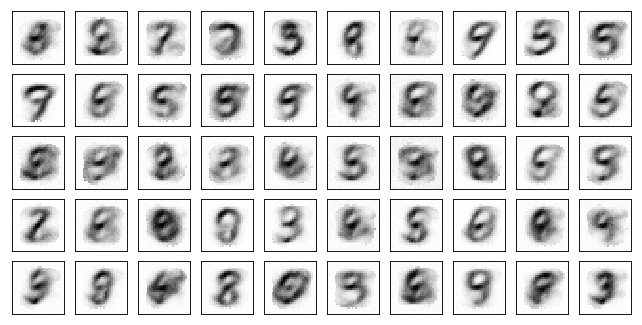

Test losses: AAE10: 0.1168
Train Epoch: 15 [0/50000 (0%)]	Losses AAE10: 0.1222
Train Epoch: 15 [10000/50000 (20%)]	Losses AAE10: 0.1177
Train Epoch: 15 [20000/50000 (40%)]	Losses AAE10: 0.1240
Train Epoch: 15 [30000/50000 (60%)]	Losses AAE10: 0.1278
Train Epoch: 15 [40000/50000 (80%)]	Losses AAE10: 0.1273
Train Epoch: 15 [50000/50000 (100%)]	Losses AAE10: 0.1206


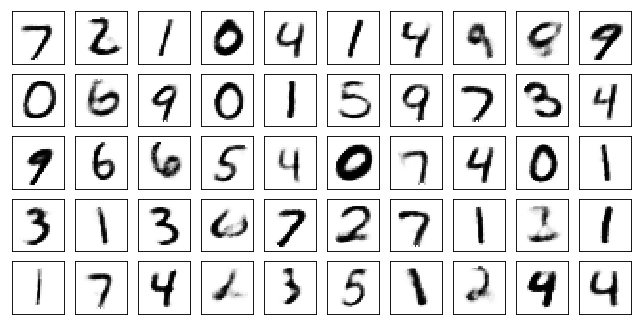

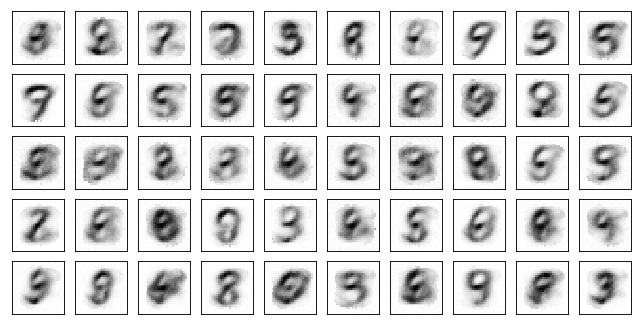

Test losses: AAE10: 0.1160
Train Epoch: 16 [0/50000 (0%)]	Losses AAE10: 0.1153
Train Epoch: 16 [10000/50000 (20%)]	Losses AAE10: 0.1213
Train Epoch: 16 [20000/50000 (40%)]	Losses AAE10: 0.1324
Train Epoch: 16 [30000/50000 (60%)]	Losses AAE10: 0.1414
Train Epoch: 16 [40000/50000 (80%)]	Losses AAE10: 0.1208
Train Epoch: 16 [50000/50000 (100%)]	Losses AAE10: 0.1267


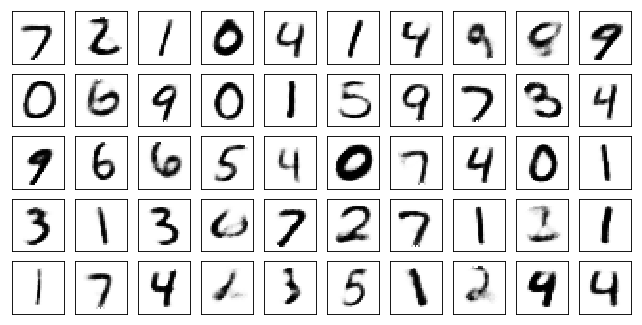

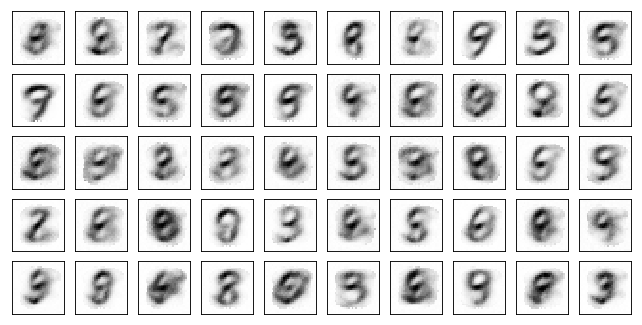

Test losses: AAE10: 0.1153
Train Epoch: 17 [0/50000 (0%)]	Losses AAE10: 0.1247
Train Epoch: 17 [10000/50000 (20%)]	Losses AAE10: 0.1236
Train Epoch: 17 [20000/50000 (40%)]	Losses AAE10: 0.1296
Train Epoch: 17 [30000/50000 (60%)]	Losses AAE10: 0.1180
Train Epoch: 17 [40000/50000 (80%)]	Losses AAE10: 0.1247
Train Epoch: 17 [50000/50000 (100%)]	Losses AAE10: 0.1265


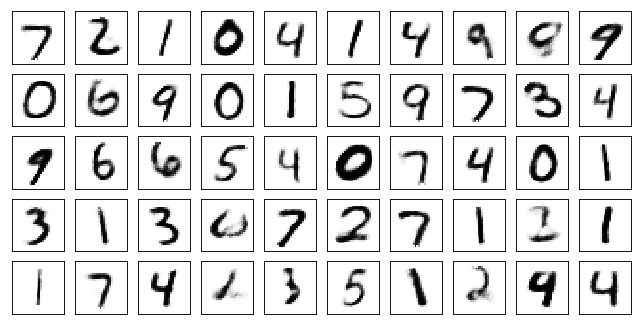

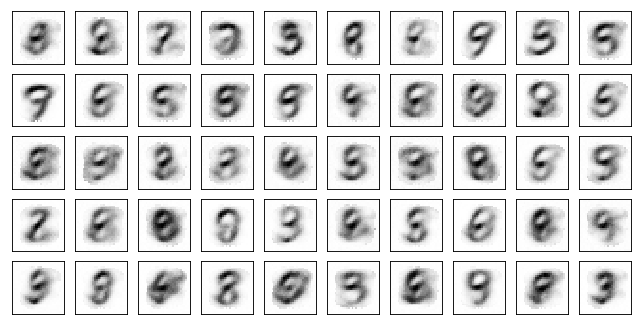

Test losses: AAE10: 0.1149
Train Epoch: 18 [0/50000 (0%)]	Losses AAE10: 0.1212
Train Epoch: 18 [10000/50000 (20%)]	Losses AAE10: 0.1296
Train Epoch: 18 [20000/50000 (40%)]	Losses AAE10: 0.1233
Train Epoch: 18 [30000/50000 (60%)]	Losses AAE10: 0.1197
Train Epoch: 18 [40000/50000 (80%)]	Losses AAE10: 0.1260
Train Epoch: 18 [50000/50000 (100%)]	Losses AAE10: 0.1191


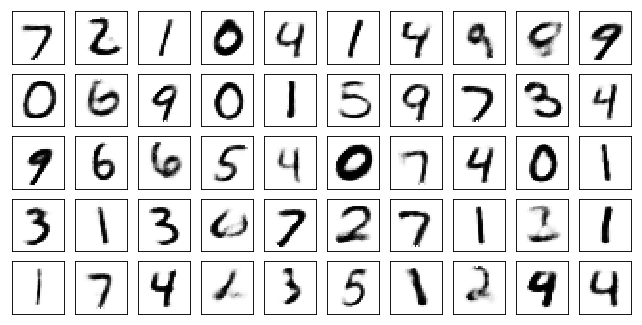

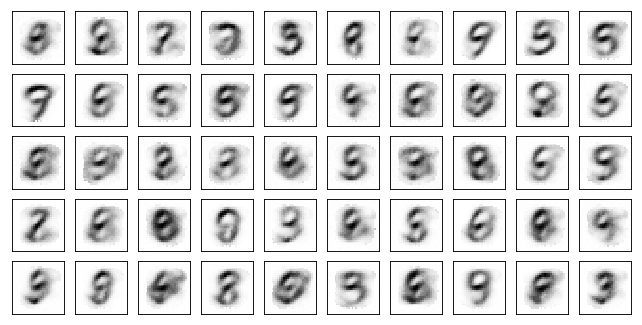

Test losses: AAE10: 0.1143
Train Epoch: 19 [0/50000 (0%)]	Losses AAE10: 0.1249
Train Epoch: 19 [10000/50000 (20%)]	Losses AAE10: 0.1289
Train Epoch: 19 [20000/50000 (40%)]	Losses AAE10: 0.1207
Train Epoch: 19 [30000/50000 (60%)]	Losses AAE10: 0.1239
Train Epoch: 19 [40000/50000 (80%)]	Losses AAE10: 0.1292
Train Epoch: 19 [50000/50000 (100%)]	Losses AAE10: 0.1216


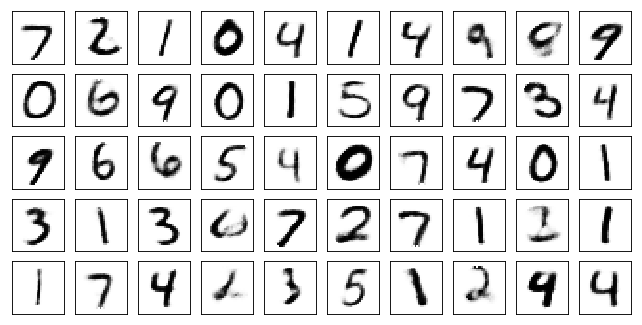

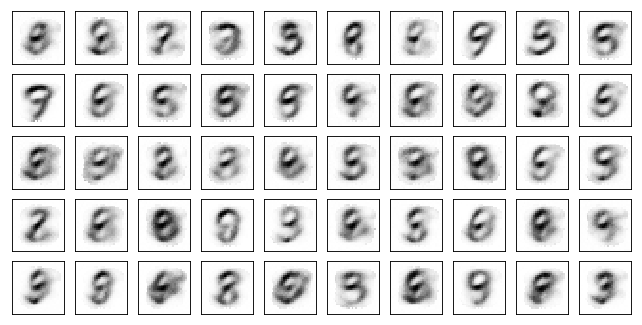

Test losses: AAE10: 0.1136
Train Epoch: 20 [0/50000 (0%)]	Losses AAE10: 0.1302
Train Epoch: 20 [10000/50000 (20%)]	Losses AAE10: 0.1163
Train Epoch: 20 [20000/50000 (40%)]	Losses AAE10: 0.1227
Train Epoch: 20 [30000/50000 (60%)]	Losses AAE10: 0.1168
Train Epoch: 20 [40000/50000 (80%)]	Losses AAE10: 0.1229
Train Epoch: 20 [50000/50000 (100%)]	Losses AAE10: 0.1300


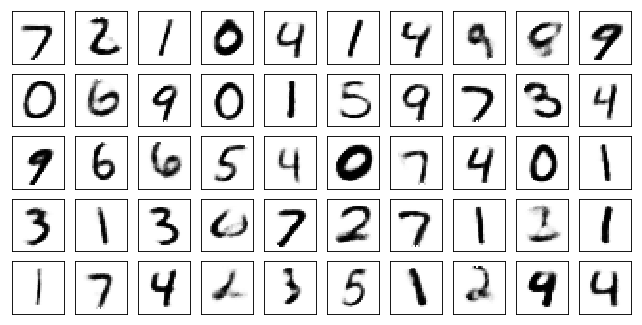

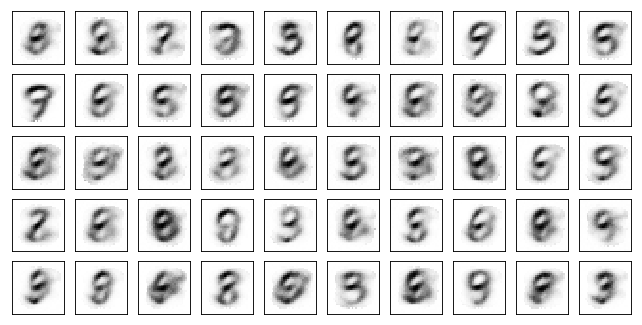

Test losses: AAE10: 0.1133
Train Epoch: 21 [0/50000 (0%)]	Losses AAE10: 0.1256
Train Epoch: 21 [10000/50000 (20%)]	Losses AAE10: 0.1153
Train Epoch: 21 [20000/50000 (40%)]	Losses AAE10: 0.1216
Train Epoch: 21 [30000/50000 (60%)]	Losses AAE10: 0.1241
Train Epoch: 21 [40000/50000 (80%)]	Losses AAE10: 0.1169
Train Epoch: 21 [50000/50000 (100%)]	Losses AAE10: 0.1157


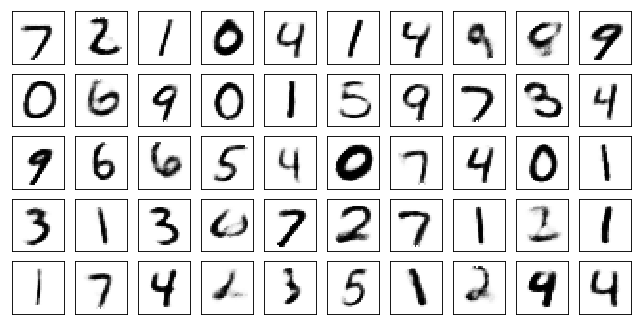

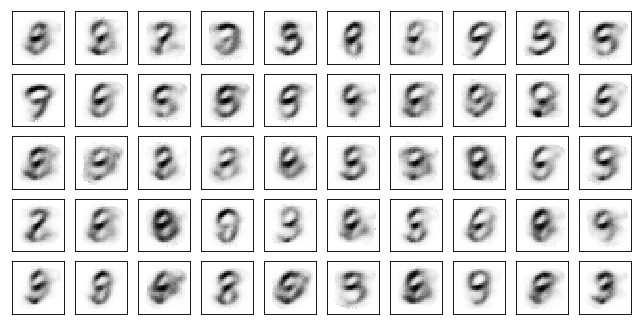

Test losses: AAE10: 0.1130
Train Epoch: 22 [0/50000 (0%)]	Losses AAE10: 0.1143
Train Epoch: 22 [10000/50000 (20%)]	Losses AAE10: 0.1248
Train Epoch: 22 [20000/50000 (40%)]	Losses AAE10: 0.1316
Train Epoch: 22 [30000/50000 (60%)]	Losses AAE10: 0.1289
Train Epoch: 22 [40000/50000 (80%)]	Losses AAE10: 0.1170
Train Epoch: 22 [50000/50000 (100%)]	Losses AAE10: 0.1299


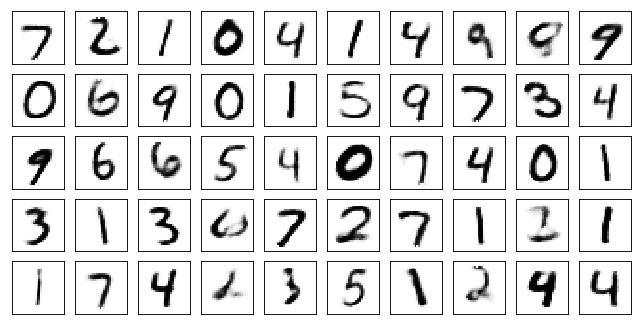

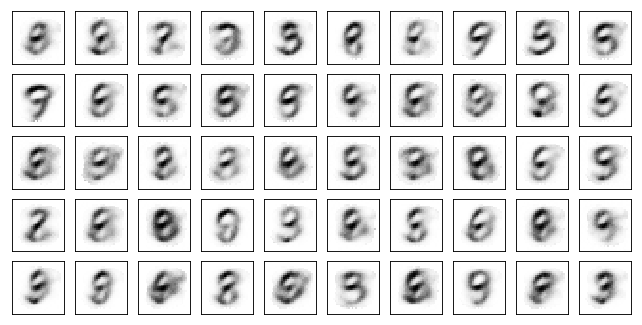

Test losses: AAE10: 0.1124
Train Epoch: 23 [0/50000 (0%)]	Losses AAE10: 0.1158
Train Epoch: 23 [10000/50000 (20%)]	Losses AAE10: 0.1203
Train Epoch: 23 [20000/50000 (40%)]	Losses AAE10: 0.1331
Train Epoch: 23 [30000/50000 (60%)]	Losses AAE10: 0.1197
Train Epoch: 23 [40000/50000 (80%)]	Losses AAE10: 0.1339
Train Epoch: 23 [50000/50000 (100%)]	Losses AAE10: 0.1186


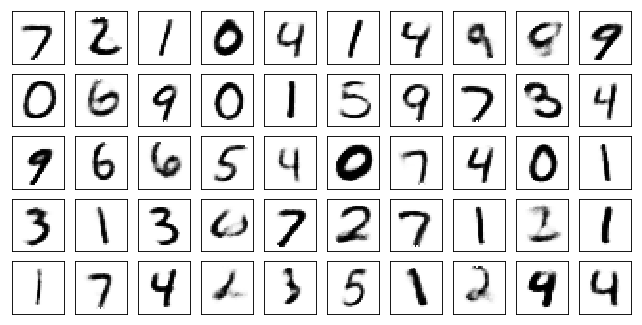

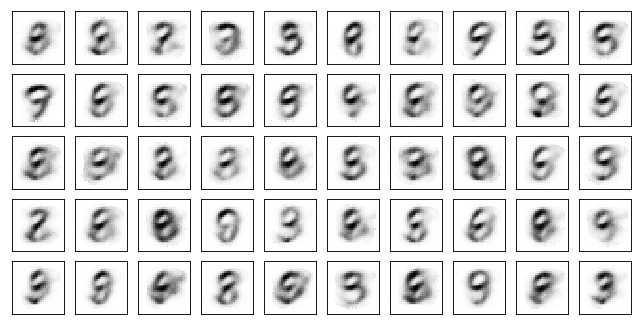

Test losses: AAE10: 0.1120
Train Epoch: 24 [0/50000 (0%)]	Losses AAE10: 0.1177
Train Epoch: 24 [10000/50000 (20%)]	Losses AAE10: 0.1213
Train Epoch: 24 [20000/50000 (40%)]	Losses AAE10: 0.1249
Train Epoch: 24 [30000/50000 (60%)]	Losses AAE10: 0.1234
Train Epoch: 24 [40000/50000 (80%)]	Losses AAE10: 0.1260
Train Epoch: 24 [50000/50000 (100%)]	Losses AAE10: 0.1237


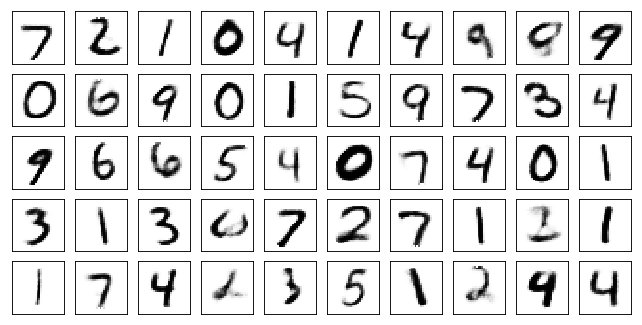

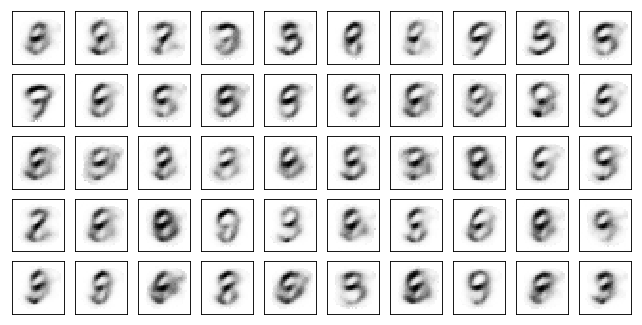

Test losses: AAE10: 0.1115
Train Epoch: 25 [0/50000 (0%)]	Losses AAE10: 0.1235
Train Epoch: 25 [10000/50000 (20%)]	Losses AAE10: 0.1174
Train Epoch: 25 [20000/50000 (40%)]	Losses AAE10: 0.1261
Train Epoch: 25 [30000/50000 (60%)]	Losses AAE10: 0.1228
Train Epoch: 25 [40000/50000 (80%)]	Losses AAE10: 0.1205
Train Epoch: 25 [50000/50000 (100%)]	Losses AAE10: 0.1245


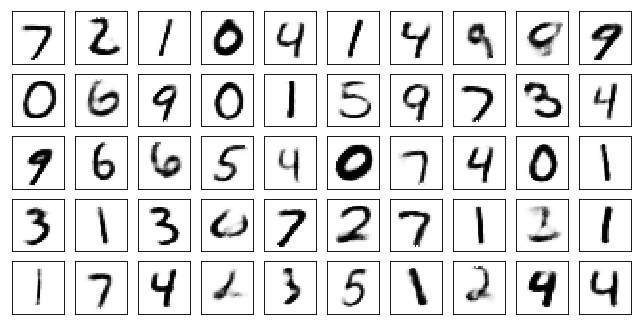

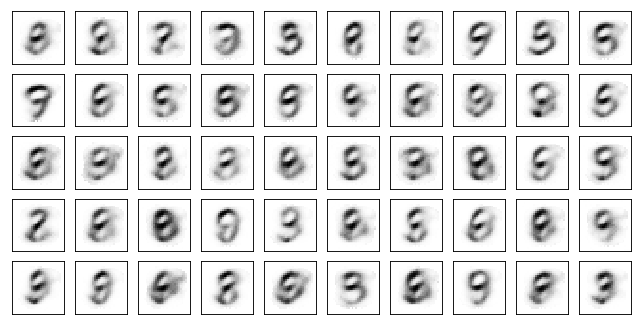

Test losses: AAE10: 0.1113
Train Epoch: 26 [0/50000 (0%)]	Losses AAE10: 0.1225
Train Epoch: 26 [10000/50000 (20%)]	Losses AAE10: 0.1149
Train Epoch: 26 [20000/50000 (40%)]	Losses AAE10: 0.1140
Train Epoch: 26 [30000/50000 (60%)]	Losses AAE10: 0.1236
Train Epoch: 26 [40000/50000 (80%)]	Losses AAE10: 0.1187
Train Epoch: 26 [50000/50000 (100%)]	Losses AAE10: 0.1145


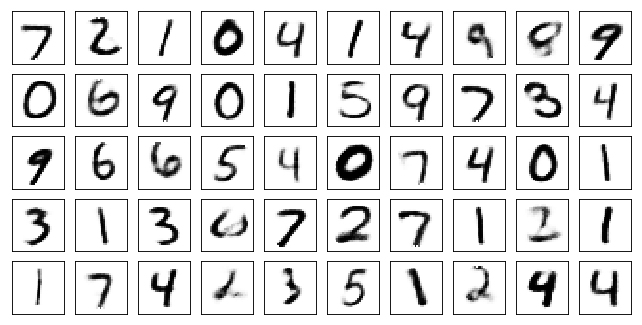

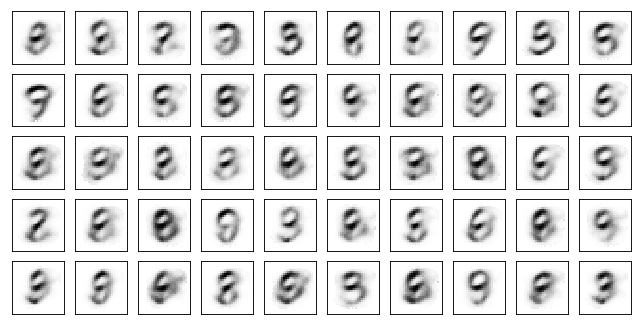

Test losses: AAE10: 0.1110
Train Epoch: 27 [0/50000 (0%)]	Losses AAE10: 0.1186
Train Epoch: 27 [10000/50000 (20%)]	Losses AAE10: 0.1197
Train Epoch: 27 [20000/50000 (40%)]	Losses AAE10: 0.1246
Train Epoch: 27 [30000/50000 (60%)]	Losses AAE10: 0.1218
Train Epoch: 27 [40000/50000 (80%)]	Losses AAE10: 0.1264
Train Epoch: 27 [50000/50000 (100%)]	Losses AAE10: 0.1213


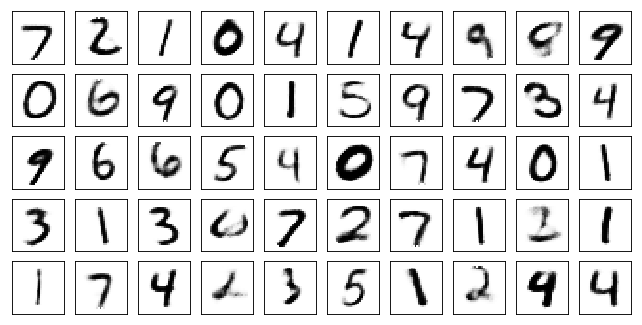

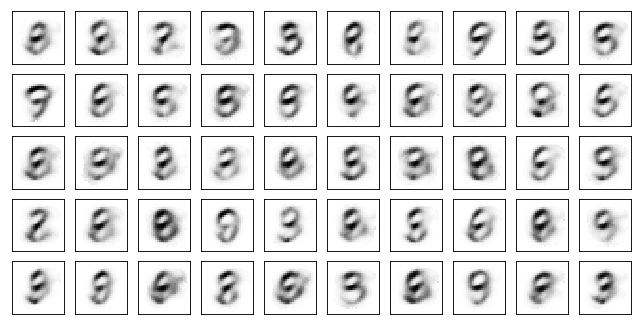

Test losses: AAE10: 0.1107
Train Epoch: 28 [0/50000 (0%)]	Losses AAE10: 0.1107
Train Epoch: 28 [10000/50000 (20%)]	Losses AAE10: 0.1150
Train Epoch: 28 [20000/50000 (40%)]	Losses AAE10: 0.1129
Train Epoch: 28 [30000/50000 (60%)]	Losses AAE10: 0.1254
Train Epoch: 28 [40000/50000 (80%)]	Losses AAE10: 0.1147
Train Epoch: 28 [50000/50000 (100%)]	Losses AAE10: 0.1131


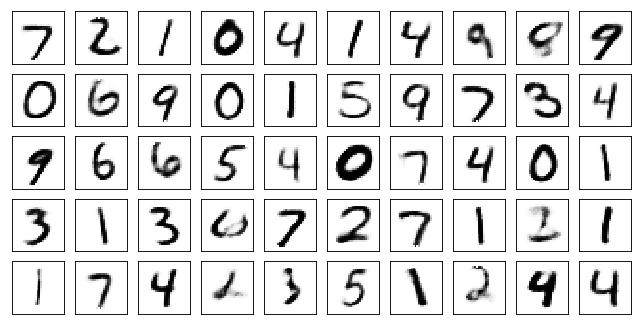

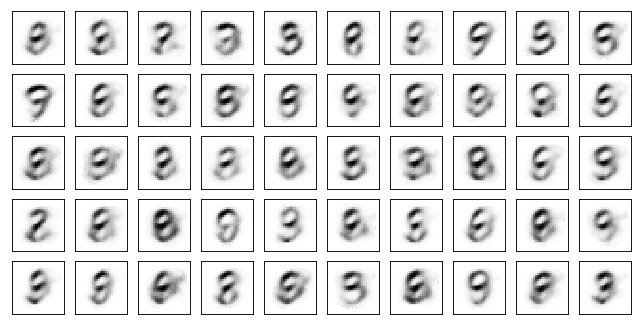

Test losses: AAE10: 0.1103
Train Epoch: 29 [0/50000 (0%)]	Losses AAE10: 0.1224
Train Epoch: 29 [10000/50000 (20%)]	Losses AAE10: 0.1217
Train Epoch: 29 [20000/50000 (40%)]	Losses AAE10: 0.1181
Train Epoch: 29 [30000/50000 (60%)]	Losses AAE10: 0.1264
Train Epoch: 29 [40000/50000 (80%)]	Losses AAE10: 0.1190
Train Epoch: 29 [50000/50000 (100%)]	Losses AAE10: 0.1265


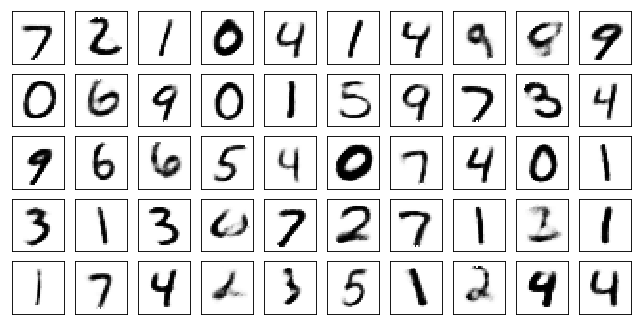

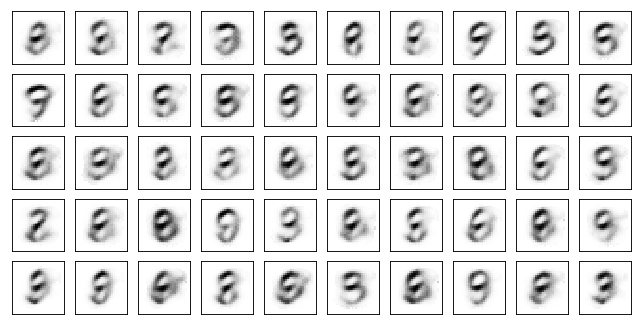

Test losses: AAE10: 0.1101
Train Epoch: 30 [0/50000 (0%)]	Losses AAE10: 0.1224
Train Epoch: 30 [10000/50000 (20%)]	Losses AAE10: 0.1186
Train Epoch: 30 [20000/50000 (40%)]	Losses AAE10: 0.1218
Train Epoch: 30 [30000/50000 (60%)]	Losses AAE10: 0.1239
Train Epoch: 30 [40000/50000 (80%)]	Losses AAE10: 0.1220
Train Epoch: 30 [50000/50000 (100%)]	Losses AAE10: 0.1148


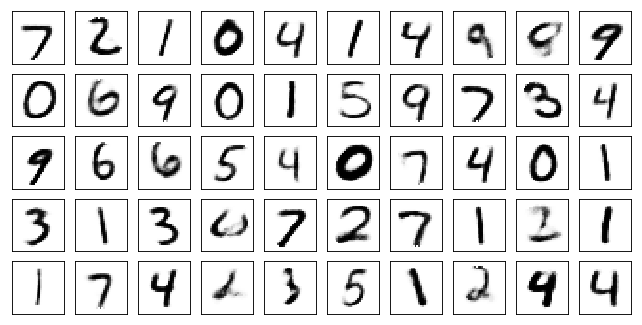

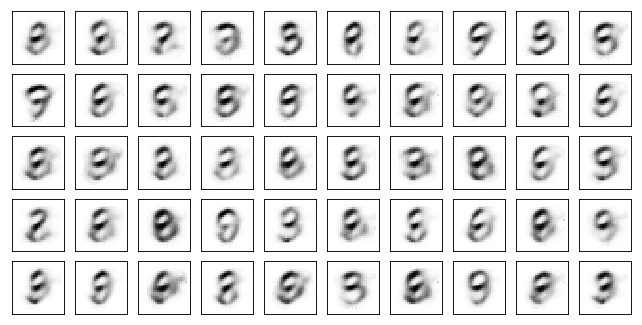

Test losses: AAE10: 0.1098
Train Epoch: 31 [0/50000 (0%)]	Losses AAE10: 0.1237
Train Epoch: 31 [10000/50000 (20%)]	Losses AAE10: 0.1248
Train Epoch: 31 [20000/50000 (40%)]	Losses AAE10: 0.1219
Train Epoch: 31 [30000/50000 (60%)]	Losses AAE10: 0.1241
Train Epoch: 31 [40000/50000 (80%)]	Losses AAE10: 0.1301
Train Epoch: 31 [50000/50000 (100%)]	Losses AAE10: 0.1213


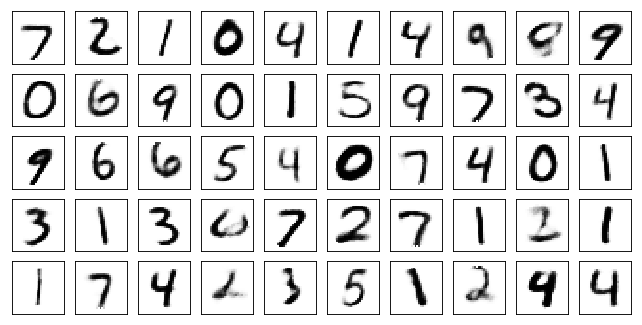

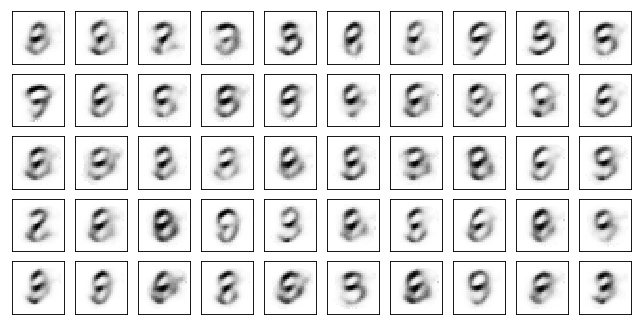

Test losses: AAE10: 0.1096
Train Epoch: 32 [0/50000 (0%)]	Losses AAE10: 0.1144
Train Epoch: 32 [10000/50000 (20%)]	Losses AAE10: 0.1109
Train Epoch: 32 [20000/50000 (40%)]	Losses AAE10: 0.1187
Train Epoch: 32 [30000/50000 (60%)]	Losses AAE10: 0.1155
Train Epoch: 32 [40000/50000 (80%)]	Losses AAE10: 0.1268
Train Epoch: 32 [50000/50000 (100%)]	Losses AAE10: 0.1249


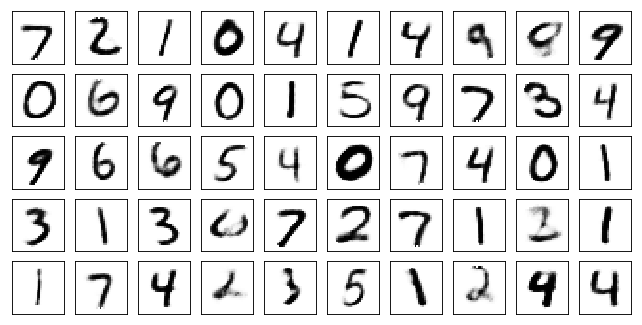

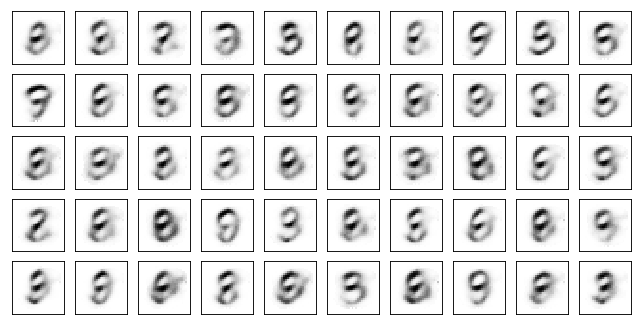

Test losses: AAE10: 0.1092
Train Epoch: 33 [0/50000 (0%)]	Losses AAE10: 0.1226
Train Epoch: 33 [10000/50000 (20%)]	Losses AAE10: 0.1181
Train Epoch: 33 [20000/50000 (40%)]	Losses AAE10: 0.1142
Train Epoch: 33 [30000/50000 (60%)]	Losses AAE10: 0.1207
Train Epoch: 33 [40000/50000 (80%)]	Losses AAE10: 0.1162
Train Epoch: 33 [50000/50000 (100%)]	Losses AAE10: 0.1236


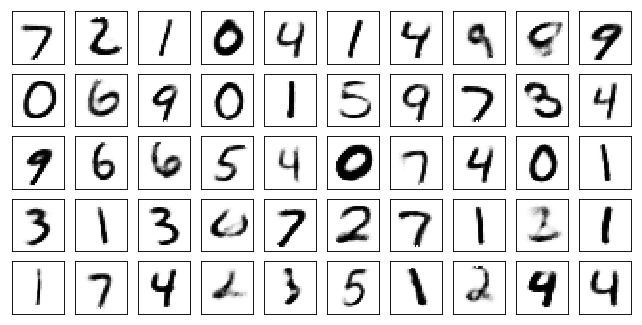

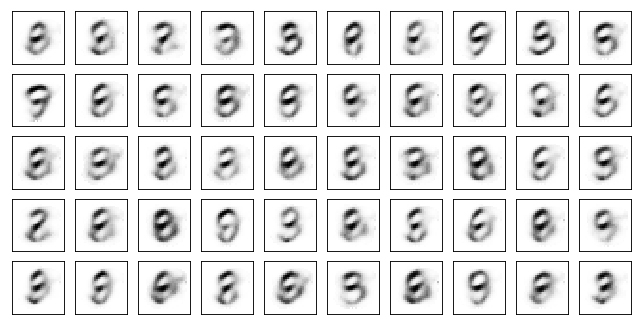

Test losses: AAE10: 0.1091
Train Epoch: 34 [0/50000 (0%)]	Losses AAE10: 0.1178
Train Epoch: 34 [10000/50000 (20%)]	Losses AAE10: 0.1219
Train Epoch: 34 [20000/50000 (40%)]	Losses AAE10: 0.1141
Train Epoch: 34 [30000/50000 (60%)]	Losses AAE10: 0.1212
Train Epoch: 34 [40000/50000 (80%)]	Losses AAE10: 0.1172
Train Epoch: 34 [50000/50000 (100%)]	Losses AAE10: 0.1162


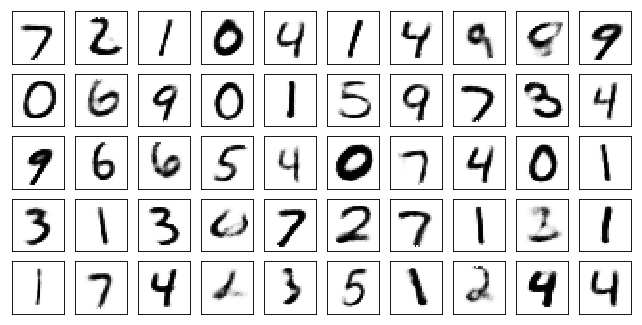

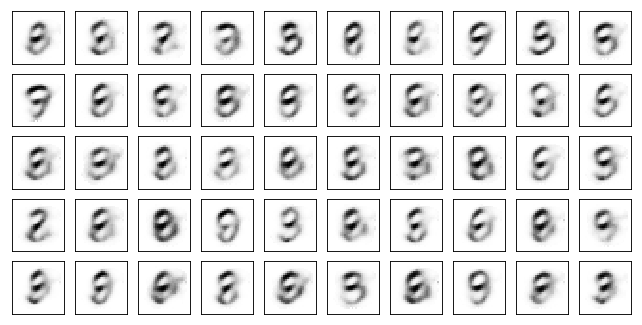

Test losses: AAE10: 0.1089
Train Epoch: 35 [0/50000 (0%)]	Losses AAE10: 0.1147
Train Epoch: 35 [10000/50000 (20%)]	Losses AAE10: 0.1176
Train Epoch: 35 [20000/50000 (40%)]	Losses AAE10: 0.1121
Train Epoch: 35 [30000/50000 (60%)]	Losses AAE10: 0.1179
Train Epoch: 35 [40000/50000 (80%)]	Losses AAE10: 0.1288
Train Epoch: 35 [50000/50000 (100%)]	Losses AAE10: 0.1172


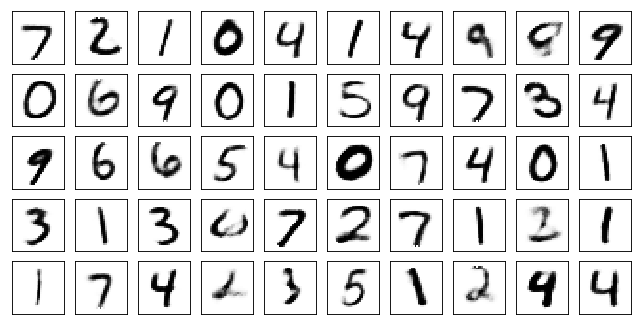

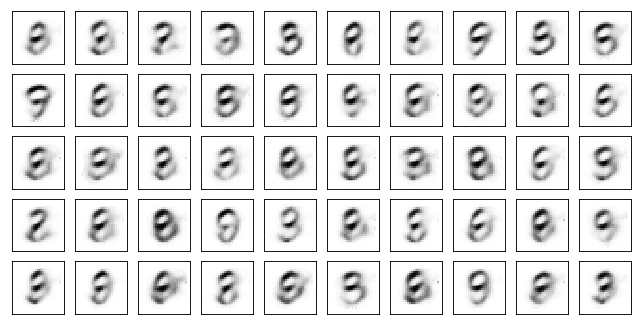

Test losses: AAE10: 0.1087
Train Epoch: 36 [0/50000 (0%)]	Losses AAE10: 0.1159
Train Epoch: 36 [10000/50000 (20%)]	Losses AAE10: 0.1243
Train Epoch: 36 [20000/50000 (40%)]	Losses AAE10: 0.1173
Train Epoch: 36 [30000/50000 (60%)]	Losses AAE10: 0.1206
Train Epoch: 36 [40000/50000 (80%)]	Losses AAE10: 0.1152
Train Epoch: 36 [50000/50000 (100%)]	Losses AAE10: 0.1203


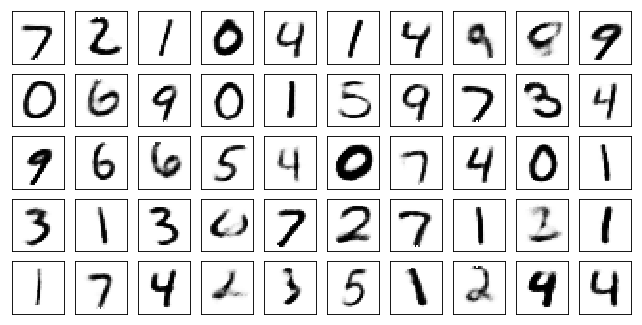

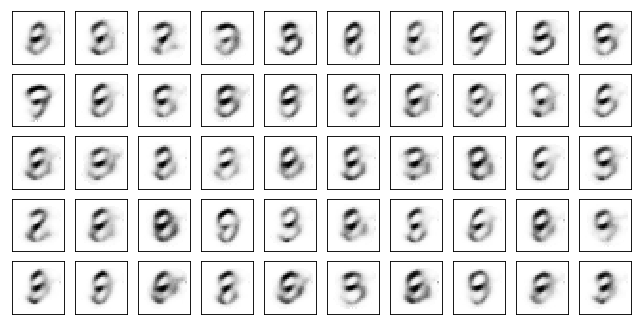

Test losses: AAE10: 0.1084
Train Epoch: 37 [0/50000 (0%)]	Losses AAE10: 0.1164
Train Epoch: 37 [10000/50000 (20%)]	Losses AAE10: 0.1147
Train Epoch: 37 [20000/50000 (40%)]	Losses AAE10: 0.1179
Train Epoch: 37 [30000/50000 (60%)]	Losses AAE10: 0.1130
Train Epoch: 37 [40000/50000 (80%)]	Losses AAE10: 0.1143
Train Epoch: 37 [50000/50000 (100%)]	Losses AAE10: 0.1162


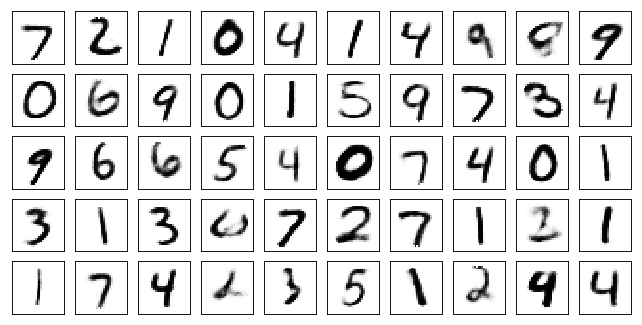

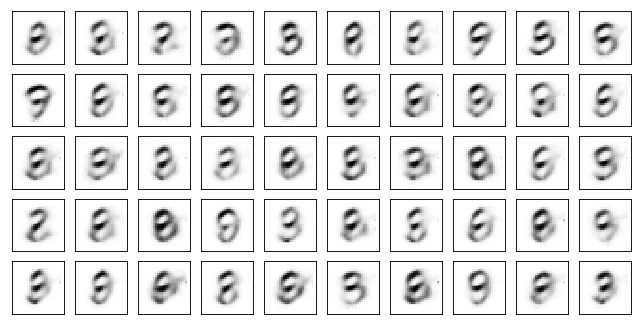

Test losses: AAE10: 0.1083
Train Epoch: 38 [0/50000 (0%)]	Losses AAE10: 0.1187
Train Epoch: 38 [10000/50000 (20%)]	Losses AAE10: 0.1187
Train Epoch: 38 [20000/50000 (40%)]	Losses AAE10: 0.1148
Train Epoch: 38 [30000/50000 (60%)]	Losses AAE10: 0.1162
Train Epoch: 38 [40000/50000 (80%)]	Losses AAE10: 0.1188
Train Epoch: 38 [50000/50000 (100%)]	Losses AAE10: 0.1197


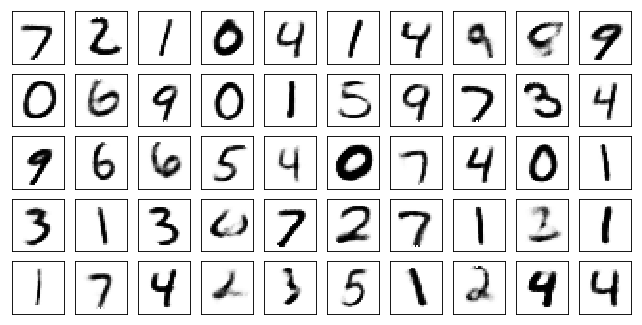

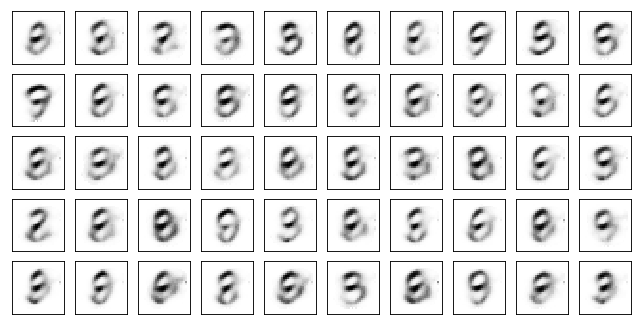

Test losses: AAE10: 0.1080
Train Epoch: 39 [0/50000 (0%)]	Losses AAE10: 0.1203
Train Epoch: 39 [10000/50000 (20%)]	Losses AAE10: 0.1158
Train Epoch: 39 [20000/50000 (40%)]	Losses AAE10: 0.1167
Train Epoch: 39 [30000/50000 (60%)]	Losses AAE10: 0.1139
Train Epoch: 39 [40000/50000 (80%)]	Losses AAE10: 0.1180
Train Epoch: 39 [50000/50000 (100%)]	Losses AAE10: 0.1139


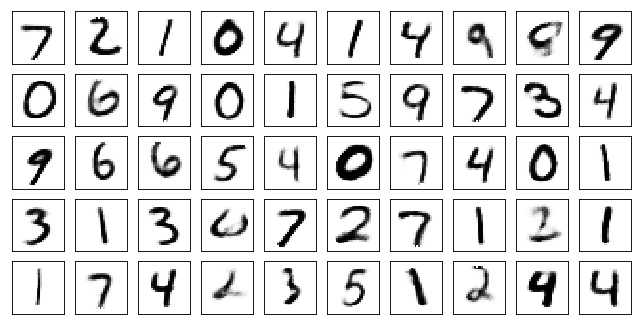

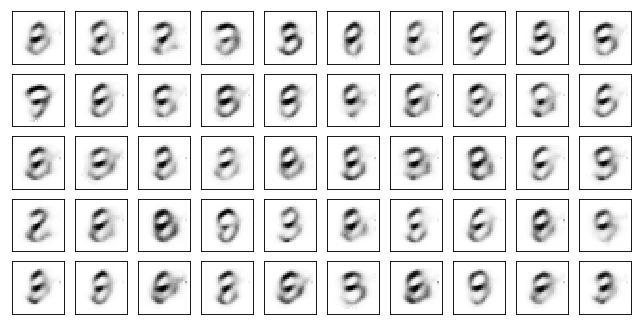

Test losses: AAE10: 0.1079
Train Epoch: 40 [0/50000 (0%)]	Losses AAE10: 0.1209
Train Epoch: 40 [10000/50000 (20%)]	Losses AAE10: 0.1231
Train Epoch: 40 [20000/50000 (40%)]	Losses AAE10: 0.1080
Train Epoch: 40 [30000/50000 (60%)]	Losses AAE10: 0.1204
Train Epoch: 40 [40000/50000 (80%)]	Losses AAE10: 0.1246
Train Epoch: 40 [50000/50000 (100%)]	Losses AAE10: 0.1110


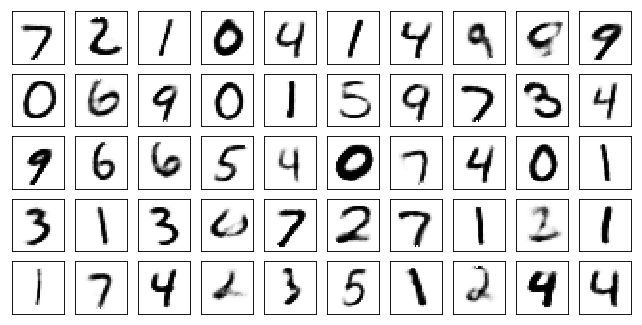

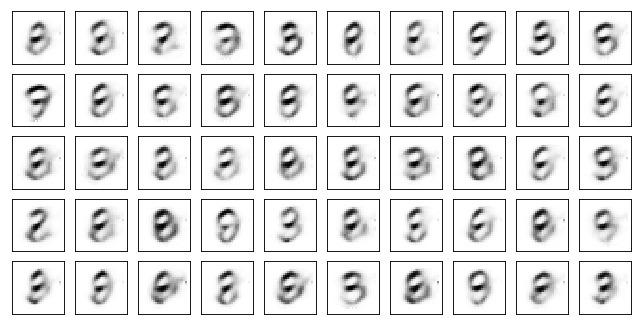

Test losses: AAE10: 0.1077
Train Epoch: 41 [0/50000 (0%)]	Losses AAE10: 0.1189
Train Epoch: 41 [10000/50000 (20%)]	Losses AAE10: 0.1204
Train Epoch: 41 [20000/50000 (40%)]	Losses AAE10: 0.1133
Train Epoch: 41 [30000/50000 (60%)]	Losses AAE10: 0.1242
Train Epoch: 41 [40000/50000 (80%)]	Losses AAE10: 0.1232
Train Epoch: 41 [50000/50000 (100%)]	Losses AAE10: 0.1107


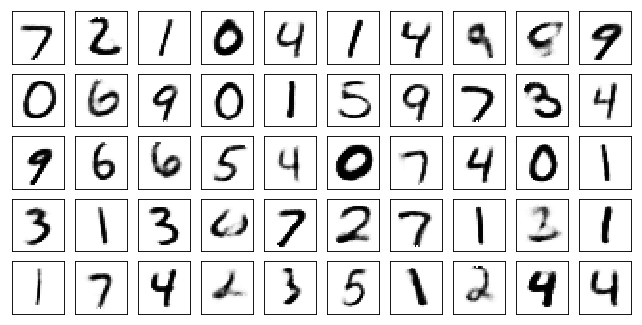

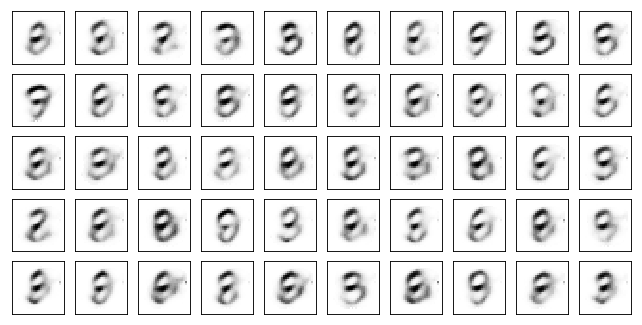

Test losses: AAE10: 0.1076
Train Epoch: 42 [0/50000 (0%)]	Losses AAE10: 0.1161
Train Epoch: 42 [10000/50000 (20%)]	Losses AAE10: 0.1206
Train Epoch: 42 [20000/50000 (40%)]	Losses AAE10: 0.1205
Train Epoch: 42 [30000/50000 (60%)]	Losses AAE10: 0.1233
Train Epoch: 42 [40000/50000 (80%)]	Losses AAE10: 0.1246
Train Epoch: 42 [50000/50000 (100%)]	Losses AAE10: 0.1314


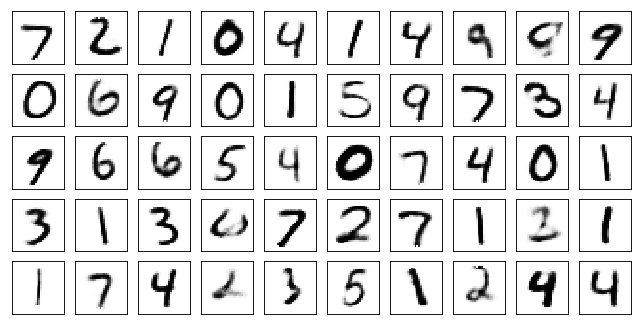

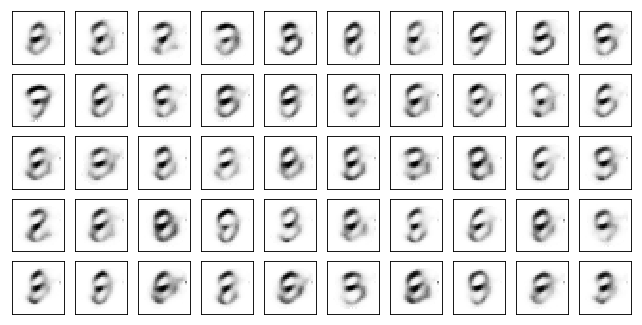

Test losses: AAE10: 0.1073
Train Epoch: 43 [0/50000 (0%)]	Losses AAE10: 0.1192
Train Epoch: 43 [10000/50000 (20%)]	Losses AAE10: 0.1172
Train Epoch: 43 [20000/50000 (40%)]	Losses AAE10: 0.1138
Train Epoch: 43 [30000/50000 (60%)]	Losses AAE10: 0.1187
Train Epoch: 43 [40000/50000 (80%)]	Losses AAE10: 0.1159
Train Epoch: 43 [50000/50000 (100%)]	Losses AAE10: 0.1180


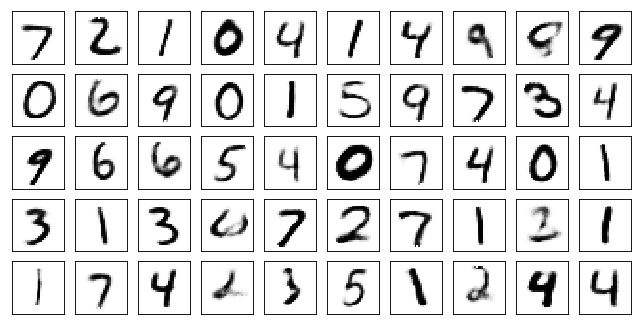

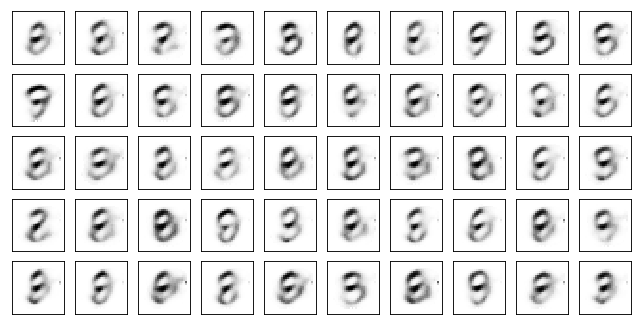

Test losses: AAE10: 0.1073
Train Epoch: 44 [0/50000 (0%)]	Losses AAE10: 0.1156
Train Epoch: 44 [10000/50000 (20%)]	Losses AAE10: 0.1183
Train Epoch: 44 [20000/50000 (40%)]	Losses AAE10: 0.1113
Train Epoch: 44 [30000/50000 (60%)]	Losses AAE10: 0.1229
Train Epoch: 44 [40000/50000 (80%)]	Losses AAE10: 0.1109
Train Epoch: 44 [50000/50000 (100%)]	Losses AAE10: 0.1161


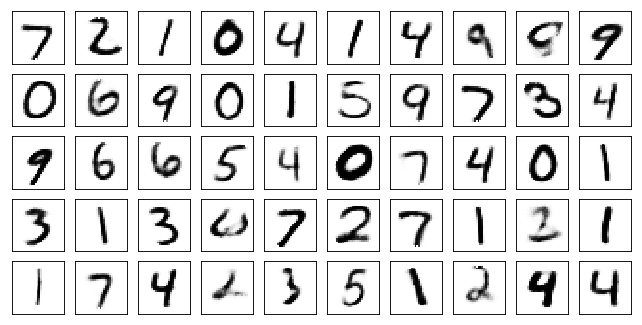

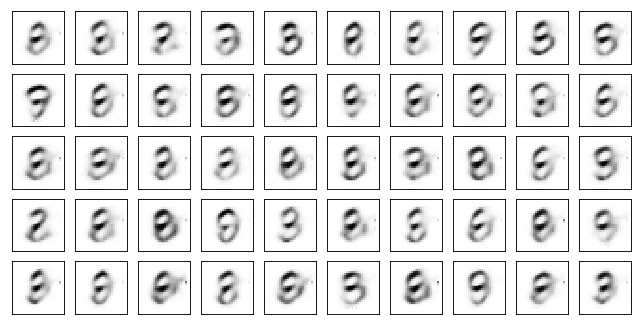

Test losses: AAE10: 0.1069
Train Epoch: 45 [0/50000 (0%)]	Losses AAE10: 0.1171
Train Epoch: 45 [10000/50000 (20%)]	Losses AAE10: 0.1186
Train Epoch: 45 [20000/50000 (40%)]	Losses AAE10: 0.1103
Train Epoch: 45 [30000/50000 (60%)]	Losses AAE10: 0.1138
Train Epoch: 45 [40000/50000 (80%)]	Losses AAE10: 0.1172
Train Epoch: 45 [50000/50000 (100%)]	Losses AAE10: 0.1272


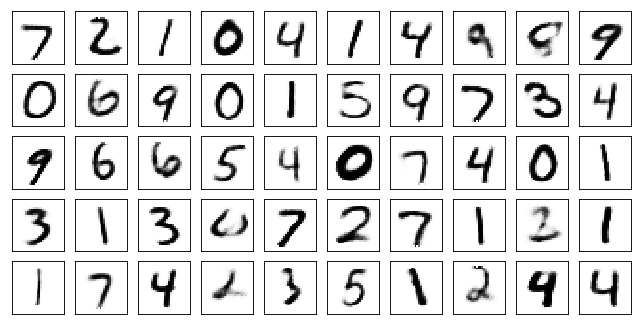

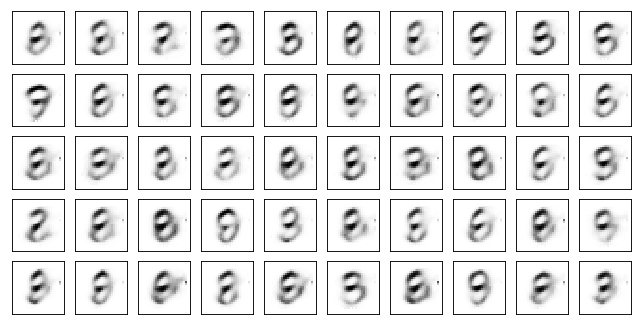

Test losses: AAE10: 0.1068
Train Epoch: 46 [0/50000 (0%)]	Losses AAE10: 0.1217
Train Epoch: 46 [10000/50000 (20%)]	Losses AAE10: 0.1231
Train Epoch: 46 [20000/50000 (40%)]	Losses AAE10: 0.1224
Train Epoch: 46 [30000/50000 (60%)]	Losses AAE10: 0.1208
Train Epoch: 46 [40000/50000 (80%)]	Losses AAE10: 0.1116
Train Epoch: 46 [50000/50000 (100%)]	Losses AAE10: 0.1206


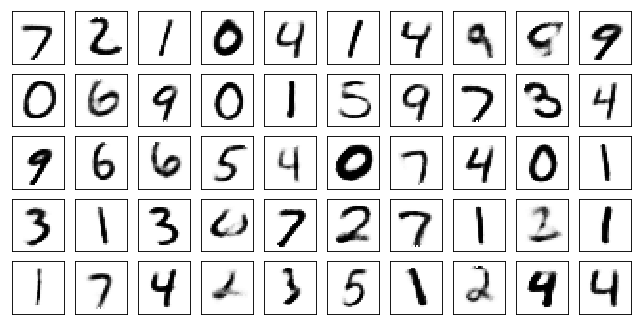

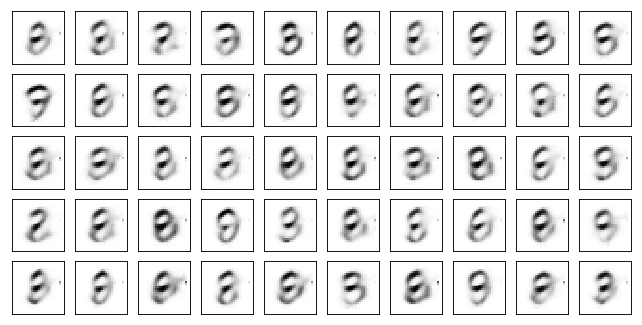

Test losses: AAE10: 0.1068
Train Epoch: 47 [0/50000 (0%)]	Losses AAE10: 0.1151
Train Epoch: 47 [10000/50000 (20%)]	Losses AAE10: 0.1167
Train Epoch: 47 [20000/50000 (40%)]	Losses AAE10: 0.1227
Train Epoch: 47 [30000/50000 (60%)]	Losses AAE10: 0.1176
Train Epoch: 47 [40000/50000 (80%)]	Losses AAE10: 0.1090
Train Epoch: 47 [50000/50000 (100%)]	Losses AAE10: 0.1159


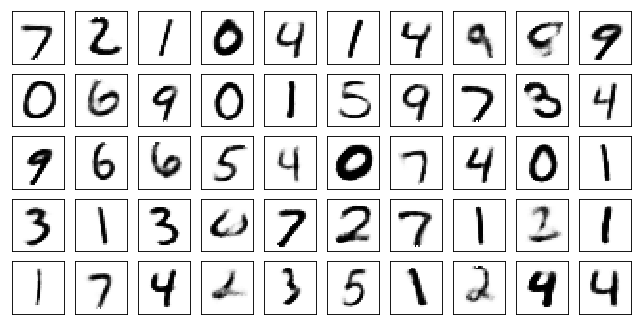

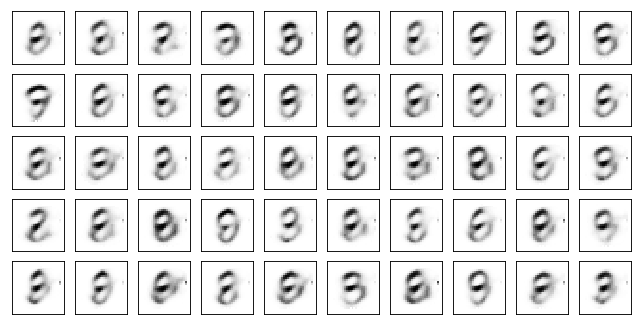

Test losses: AAE10: 0.1067
Train Epoch: 48 [0/50000 (0%)]	Losses AAE10: 0.1083
Train Epoch: 48 [10000/50000 (20%)]	Losses AAE10: 0.1221
Train Epoch: 48 [20000/50000 (40%)]	Losses AAE10: 0.1212
Train Epoch: 48 [30000/50000 (60%)]	Losses AAE10: 0.1128
Train Epoch: 48 [40000/50000 (80%)]	Losses AAE10: 0.1132
Train Epoch: 48 [50000/50000 (100%)]	Losses AAE10: 0.1106


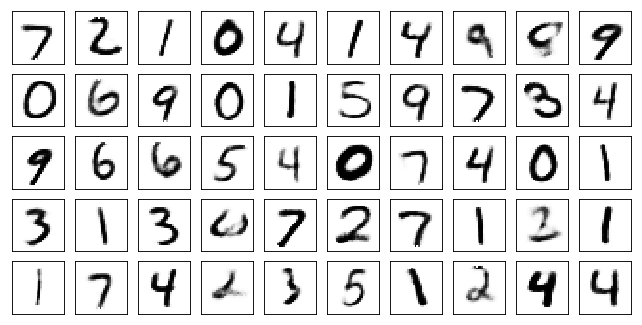

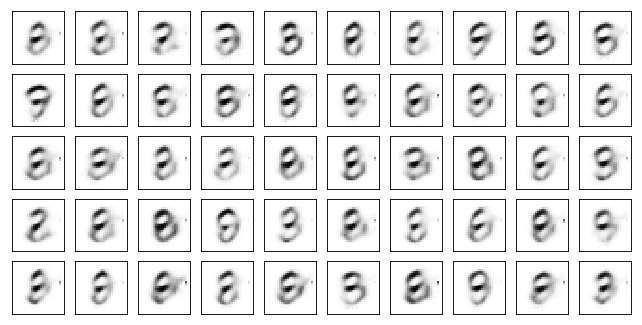

Test losses: AAE10: 0.1065
Train Epoch: 49 [0/50000 (0%)]	Losses AAE10: 0.1067
Train Epoch: 49 [10000/50000 (20%)]	Losses AAE10: 0.1182
Train Epoch: 49 [20000/50000 (40%)]	Losses AAE10: 0.1102
Train Epoch: 49 [30000/50000 (60%)]	Losses AAE10: 0.1237
Train Epoch: 49 [40000/50000 (80%)]	Losses AAE10: 0.1197
Train Epoch: 49 [50000/50000 (100%)]	Losses AAE10: 0.1178


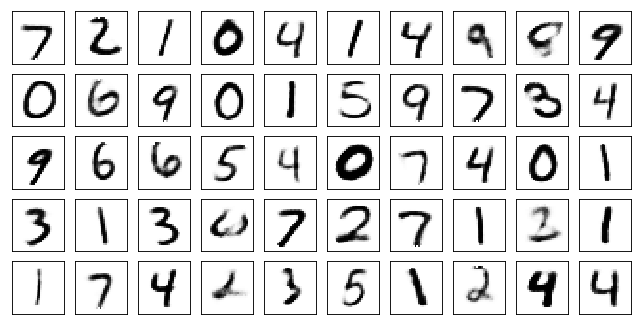

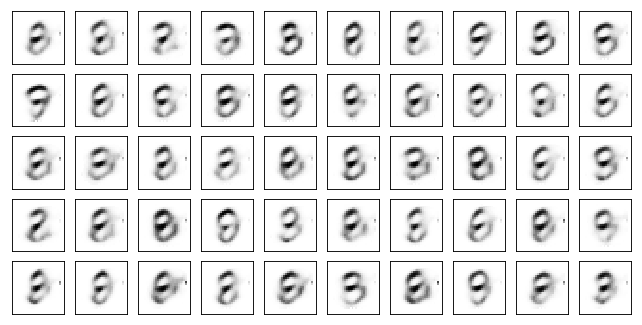

Test losses: AAE10: 0.1064
Train Epoch: 50 [0/50000 (0%)]	Losses AAE10: 0.1169
Train Epoch: 50 [10000/50000 (20%)]	Losses AAE10: 0.1127
Train Epoch: 50 [20000/50000 (40%)]	Losses AAE10: 0.1152
Train Epoch: 50 [30000/50000 (60%)]	Losses AAE10: 0.1152
Train Epoch: 50 [40000/50000 (80%)]	Losses AAE10: 0.1165
Train Epoch: 50 [50000/50000 (100%)]	Losses AAE10: 0.1192


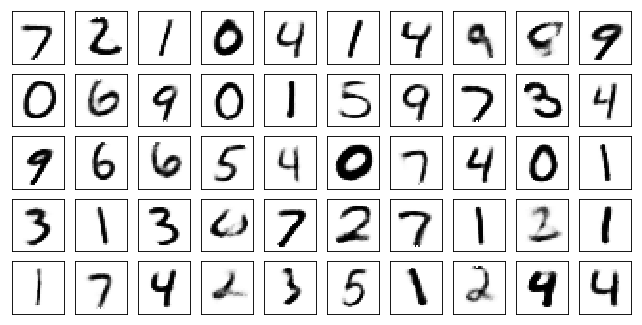

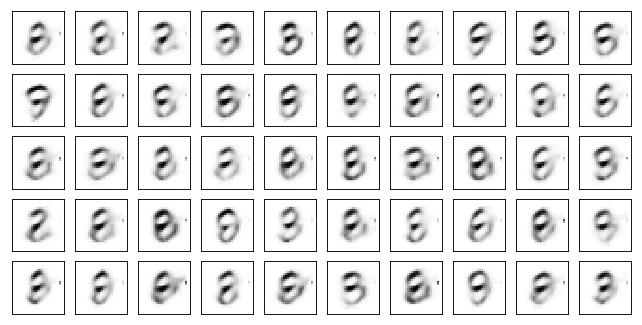

Test losses: AAE10: 0.1063
Train Epoch: 51 [0/50000 (0%)]	Losses AAE10: 0.1145
Train Epoch: 51 [10000/50000 (20%)]	Losses AAE10: 0.1151
Train Epoch: 51 [20000/50000 (40%)]	Losses AAE10: 0.1244
Train Epoch: 51 [30000/50000 (60%)]	Losses AAE10: 0.1157
Train Epoch: 51 [40000/50000 (80%)]	Losses AAE10: 0.1171
Train Epoch: 51 [50000/50000 (100%)]	Losses AAE10: 0.1149


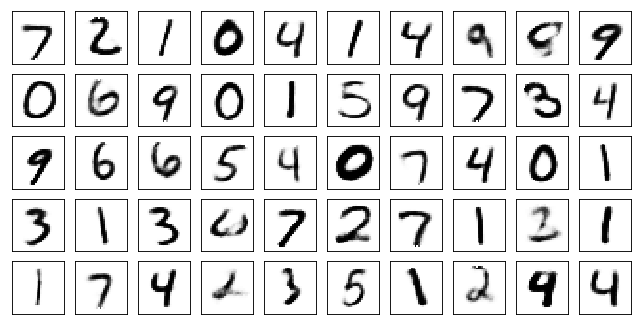

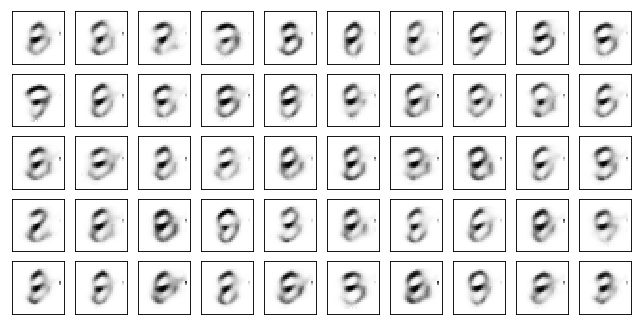

Test losses: AAE10: 0.1060
Train Epoch: 52 [0/50000 (0%)]	Losses AAE10: 0.1189
Train Epoch: 52 [10000/50000 (20%)]	Losses AAE10: 0.1111
Train Epoch: 52 [20000/50000 (40%)]	Losses AAE10: 0.1266
Train Epoch: 52 [30000/50000 (60%)]	Losses AAE10: 0.1178
Train Epoch: 52 [40000/50000 (80%)]	Losses AAE10: 0.1212
Train Epoch: 52 [50000/50000 (100%)]	Losses AAE10: 0.1132


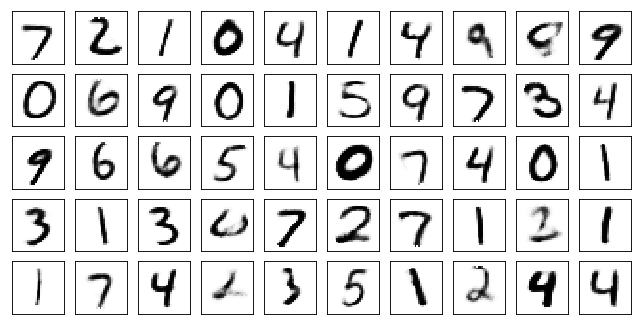

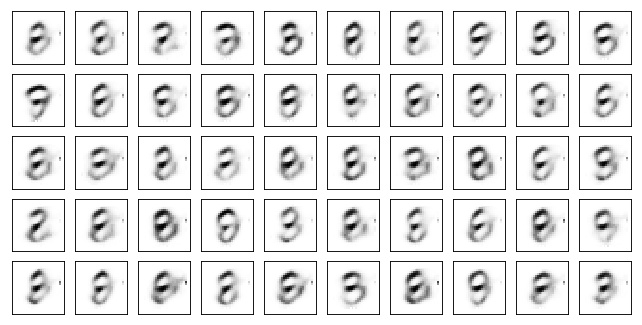

Test losses: AAE10: 0.1060
Train Epoch: 53 [0/50000 (0%)]	Losses AAE10: 0.1099
Train Epoch: 53 [10000/50000 (20%)]	Losses AAE10: 0.1161
Train Epoch: 53 [20000/50000 (40%)]	Losses AAE10: 0.1163
Train Epoch: 53 [30000/50000 (60%)]	Losses AAE10: 0.1238
Train Epoch: 53 [40000/50000 (80%)]	Losses AAE10: 0.1139
Train Epoch: 53 [50000/50000 (100%)]	Losses AAE10: 0.1273


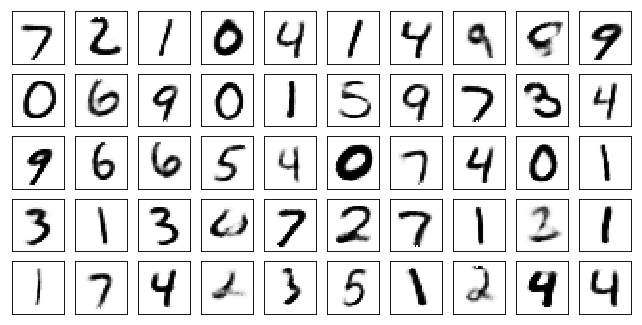

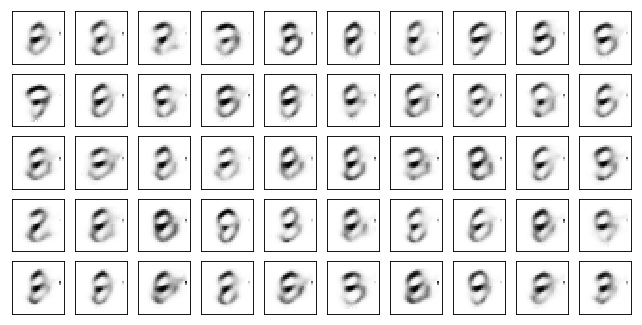

Test losses: AAE10: 0.1059
Train Epoch: 54 [0/50000 (0%)]	Losses AAE10: 0.1161
Train Epoch: 54 [10000/50000 (20%)]	Losses AAE10: 0.1169
Train Epoch: 54 [20000/50000 (40%)]	Losses AAE10: 0.1145
Train Epoch: 54 [30000/50000 (60%)]	Losses AAE10: 0.1189
Train Epoch: 54 [40000/50000 (80%)]	Losses AAE10: 0.1170
Train Epoch: 54 [50000/50000 (100%)]	Losses AAE10: 0.1199


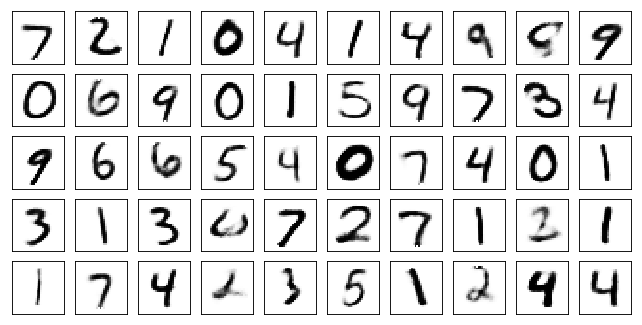

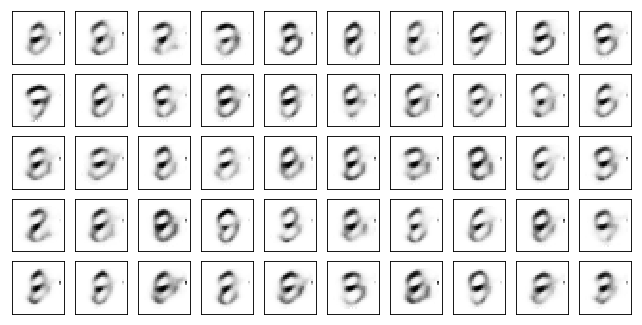

Test losses: AAE10: 0.1059
Train Epoch: 55 [0/50000 (0%)]	Losses AAE10: 0.1150
Train Epoch: 55 [10000/50000 (20%)]	Losses AAE10: 0.1170
Train Epoch: 55 [20000/50000 (40%)]	Losses AAE10: 0.1141
Train Epoch: 55 [30000/50000 (60%)]	Losses AAE10: 0.1185
Train Epoch: 55 [40000/50000 (80%)]	Losses AAE10: 0.1172
Train Epoch: 55 [50000/50000 (100%)]	Losses AAE10: 0.1179


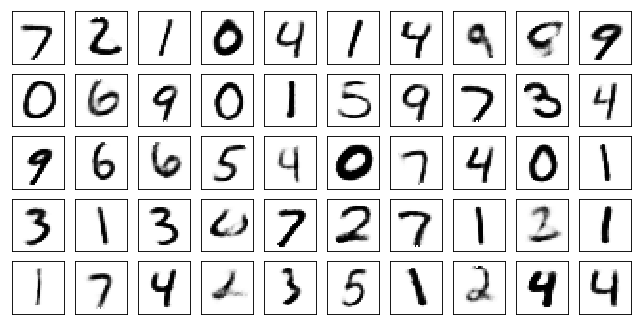

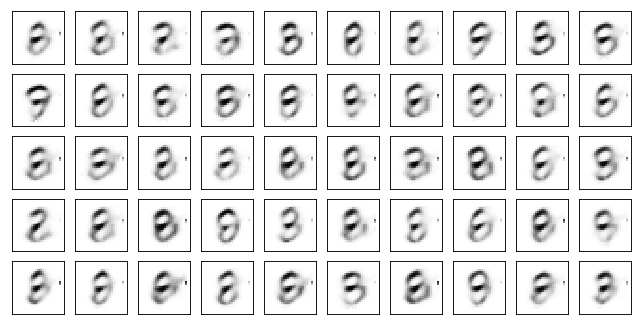

Test losses: AAE10: 0.1057
Train Epoch: 56 [0/50000 (0%)]	Losses AAE10: 0.1111
Train Epoch: 56 [10000/50000 (20%)]	Losses AAE10: 0.1112
Train Epoch: 56 [20000/50000 (40%)]	Losses AAE10: 0.1174
Train Epoch: 56 [30000/50000 (60%)]	Losses AAE10: 0.1216
Train Epoch: 56 [40000/50000 (80%)]	Losses AAE10: 0.1153
Train Epoch: 56 [50000/50000 (100%)]	Losses AAE10: 0.1178


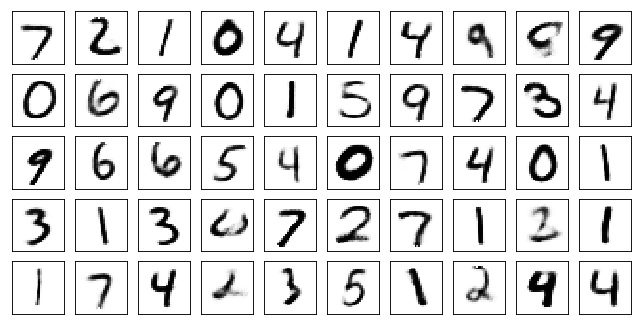

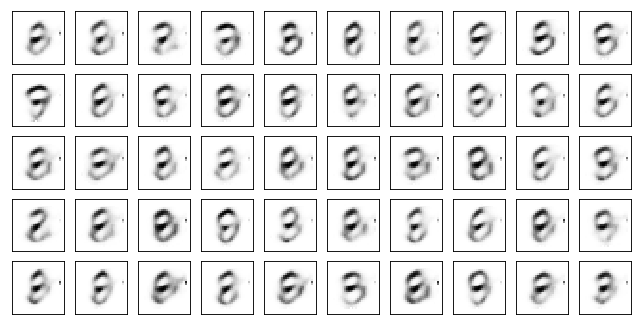

Test losses: AAE10: 0.1056
Train Epoch: 57 [0/50000 (0%)]	Losses AAE10: 0.1102
Train Epoch: 57 [10000/50000 (20%)]	Losses AAE10: 0.1201
Train Epoch: 57 [20000/50000 (40%)]	Losses AAE10: 0.1151
Train Epoch: 57 [30000/50000 (60%)]	Losses AAE10: 0.1172
Train Epoch: 57 [40000/50000 (80%)]	Losses AAE10: 0.1152
Train Epoch: 57 [50000/50000 (100%)]	Losses AAE10: 0.1210


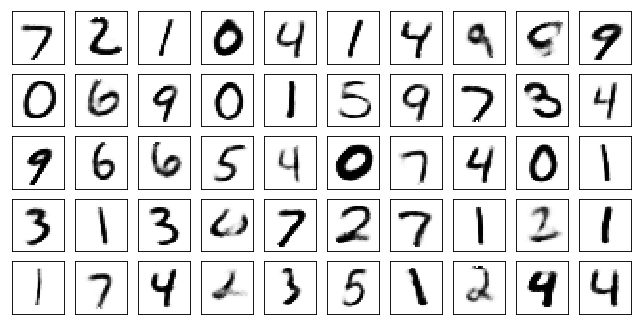

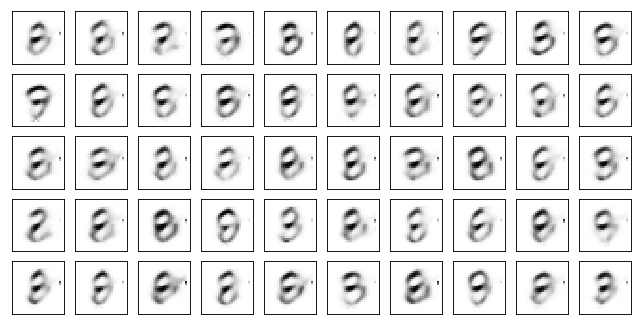

Test losses: AAE10: 0.1053
Train Epoch: 58 [0/50000 (0%)]	Losses AAE10: 0.1171
Train Epoch: 58 [10000/50000 (20%)]	Losses AAE10: 0.1159
Train Epoch: 58 [20000/50000 (40%)]	Losses AAE10: 0.1198
Train Epoch: 58 [30000/50000 (60%)]	Losses AAE10: 0.1056
Train Epoch: 58 [40000/50000 (80%)]	Losses AAE10: 0.1141
Train Epoch: 58 [50000/50000 (100%)]	Losses AAE10: 0.1140


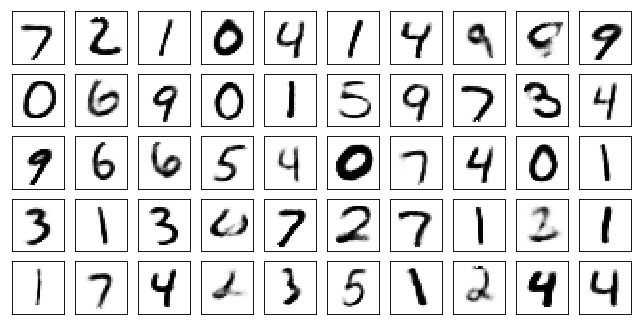

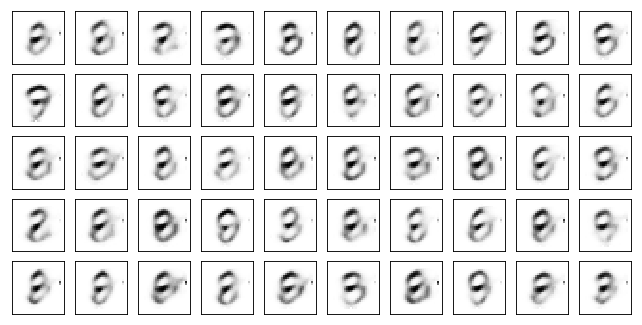

Test losses: AAE10: 0.1054
Train Epoch: 59 [0/50000 (0%)]	Losses AAE10: 0.1152
Train Epoch: 59 [10000/50000 (20%)]	Losses AAE10: 0.1200
Train Epoch: 59 [20000/50000 (40%)]	Losses AAE10: 0.1156
Train Epoch: 59 [30000/50000 (60%)]	Losses AAE10: 0.1157
Train Epoch: 59 [40000/50000 (80%)]	Losses AAE10: 0.1224
Train Epoch: 59 [50000/50000 (100%)]	Losses AAE10: 0.1101


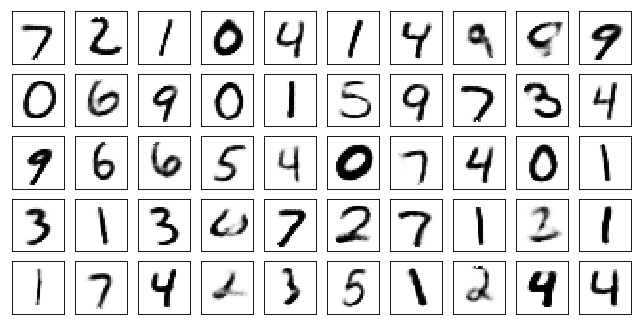

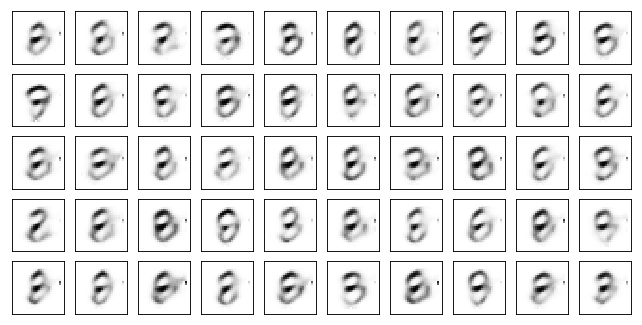

Test losses: AAE10: 0.1054
Train Epoch: 60 [0/50000 (0%)]	Losses AAE10: 0.1110
Train Epoch: 60 [10000/50000 (20%)]	Losses AAE10: 0.1193
Train Epoch: 60 [20000/50000 (40%)]	Losses AAE10: 0.1182
Train Epoch: 60 [30000/50000 (60%)]	Losses AAE10: 0.1201
Train Epoch: 60 [40000/50000 (80%)]	Losses AAE10: 0.1224
Train Epoch: 60 [50000/50000 (100%)]	Losses AAE10: 0.1114


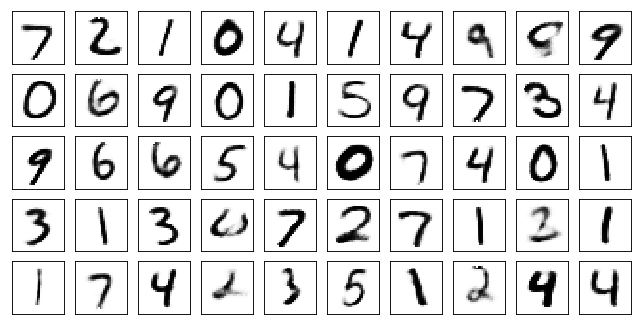

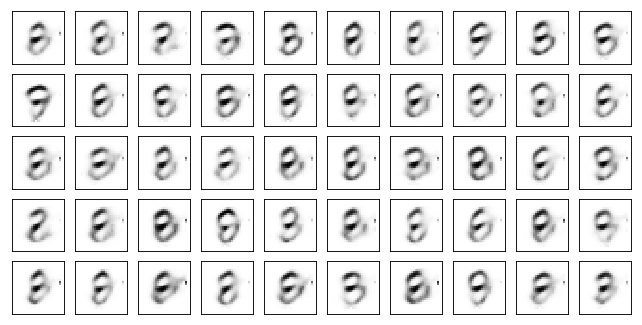

Test losses: AAE10: 0.1051
Train Epoch: 61 [0/50000 (0%)]	Losses AAE10: 0.1148
Train Epoch: 61 [10000/50000 (20%)]	Losses AAE10: 0.1100
Train Epoch: 61 [20000/50000 (40%)]	Losses AAE10: 0.1209
Train Epoch: 61 [30000/50000 (60%)]	Losses AAE10: 0.1199
Train Epoch: 61 [40000/50000 (80%)]	Losses AAE10: 0.1133
Train Epoch: 61 [50000/50000 (100%)]	Losses AAE10: 0.1213


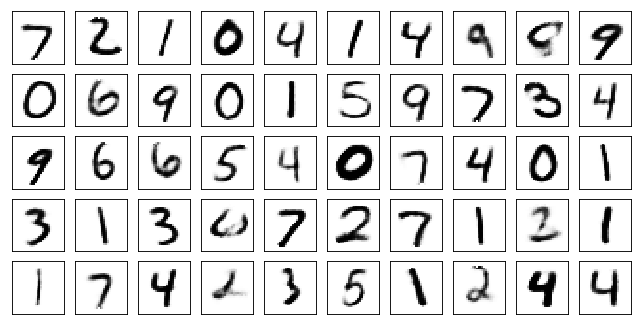

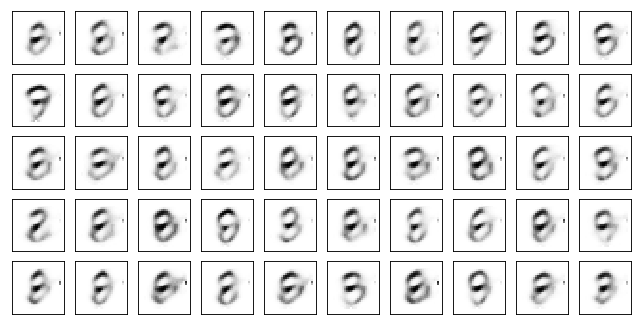

Test losses: AAE10: 0.1051
Train Epoch: 62 [0/50000 (0%)]	Losses AAE10: 0.1187
Train Epoch: 62 [10000/50000 (20%)]	Losses AAE10: 0.1185
Train Epoch: 62 [20000/50000 (40%)]	Losses AAE10: 0.1158
Train Epoch: 62 [30000/50000 (60%)]	Losses AAE10: 0.1181
Train Epoch: 62 [40000/50000 (80%)]	Losses AAE10: 0.1152
Train Epoch: 62 [50000/50000 (100%)]	Losses AAE10: 0.1225


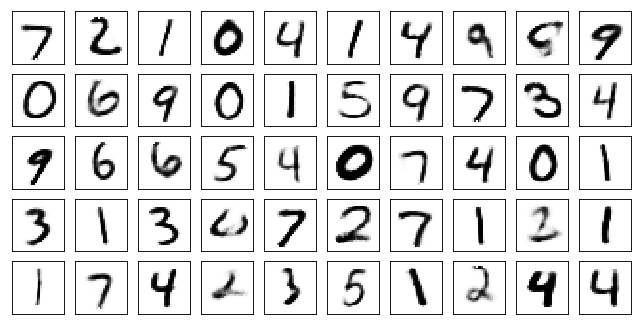

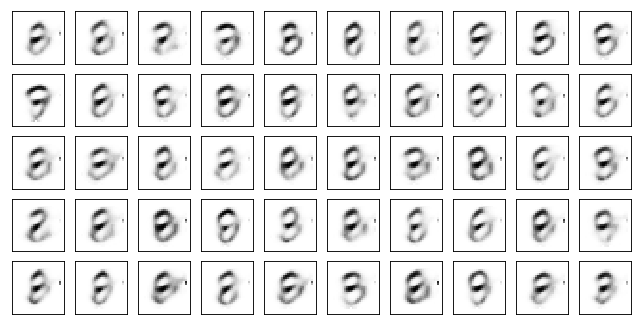

Test losses: AAE10: 0.1049
Train Epoch: 63 [0/50000 (0%)]	Losses AAE10: 0.1081
Train Epoch: 63 [10000/50000 (20%)]	Losses AAE10: 0.1179
Train Epoch: 63 [20000/50000 (40%)]	Losses AAE10: 0.1153
Train Epoch: 63 [30000/50000 (60%)]	Losses AAE10: 0.1085
Train Epoch: 63 [40000/50000 (80%)]	Losses AAE10: 0.1195
Train Epoch: 63 [50000/50000 (100%)]	Losses AAE10: 0.1131


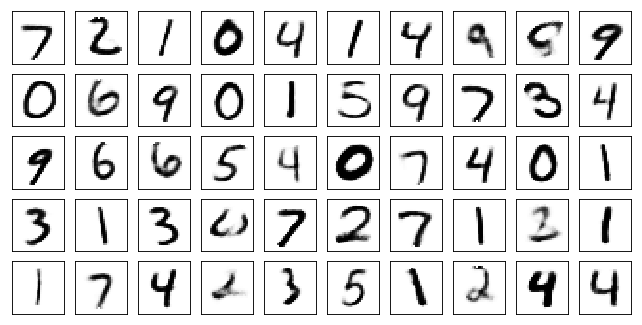

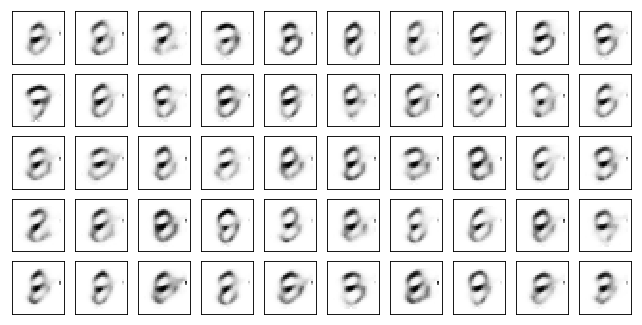

Test losses: AAE10: 0.1049
Train Epoch: 64 [0/50000 (0%)]	Losses AAE10: 0.1168
Train Epoch: 64 [10000/50000 (20%)]	Losses AAE10: 0.1116
Train Epoch: 64 [20000/50000 (40%)]	Losses AAE10: 0.1096
Train Epoch: 64 [30000/50000 (60%)]	Losses AAE10: 0.1136
Train Epoch: 64 [40000/50000 (80%)]	Losses AAE10: 0.1122
Train Epoch: 64 [50000/50000 (100%)]	Losses AAE10: 0.1159


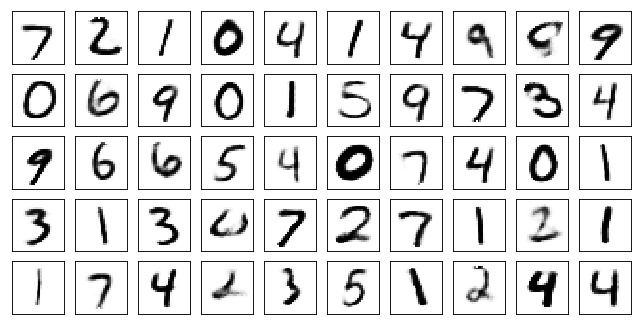

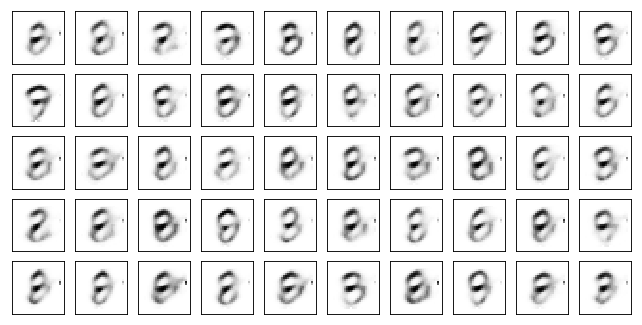

Test losses: AAE10: 0.1047
Train Epoch: 65 [0/50000 (0%)]	Losses AAE10: 0.1175
Train Epoch: 65 [10000/50000 (20%)]	Losses AAE10: 0.1131
Train Epoch: 65 [20000/50000 (40%)]	Losses AAE10: 0.1252
Train Epoch: 65 [30000/50000 (60%)]	Losses AAE10: 0.1188
Train Epoch: 65 [40000/50000 (80%)]	Losses AAE10: 0.1121
Train Epoch: 65 [50000/50000 (100%)]	Losses AAE10: 0.1156


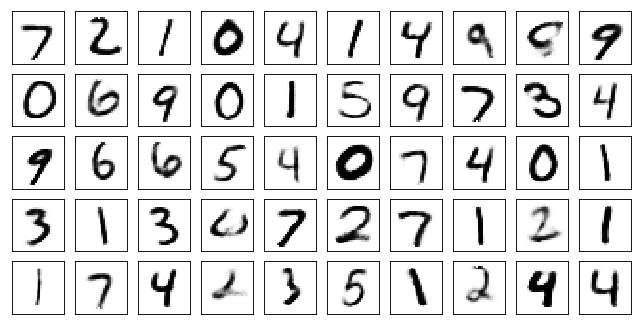

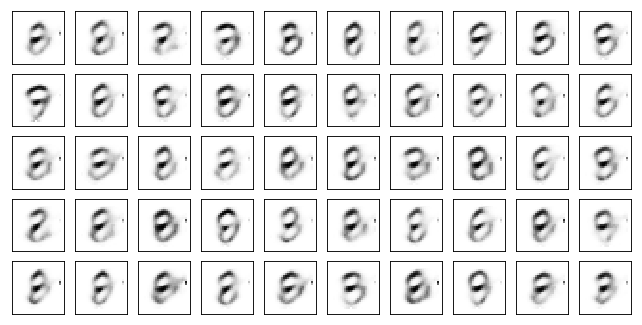

Test losses: AAE10: 0.1046
Train Epoch: 66 [0/50000 (0%)]	Losses AAE10: 0.1171
Train Epoch: 66 [10000/50000 (20%)]	Losses AAE10: 0.1091
Train Epoch: 66 [20000/50000 (40%)]	Losses AAE10: 0.1226
Train Epoch: 66 [30000/50000 (60%)]	Losses AAE10: 0.1194
Train Epoch: 66 [40000/50000 (80%)]	Losses AAE10: 0.1098
Train Epoch: 66 [50000/50000 (100%)]	Losses AAE10: 0.1235


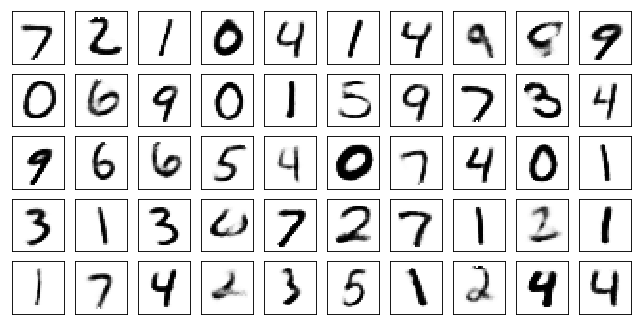

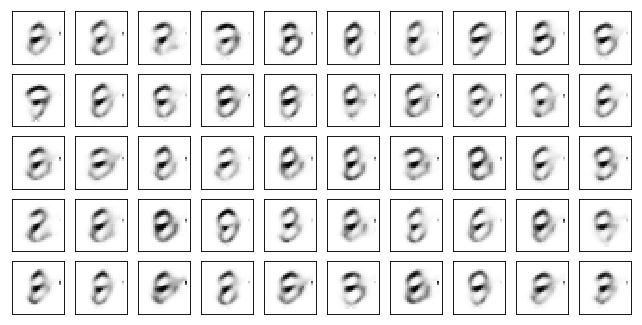

Test losses: AAE10: 0.1045
Train Epoch: 67 [0/50000 (0%)]	Losses AAE10: 0.1189
Train Epoch: 67 [10000/50000 (20%)]	Losses AAE10: 0.1116
Train Epoch: 67 [20000/50000 (40%)]	Losses AAE10: 0.1110
Train Epoch: 67 [30000/50000 (60%)]	Losses AAE10: 0.1172
Train Epoch: 67 [40000/50000 (80%)]	Losses AAE10: 0.1161
Train Epoch: 67 [50000/50000 (100%)]	Losses AAE10: 0.1215


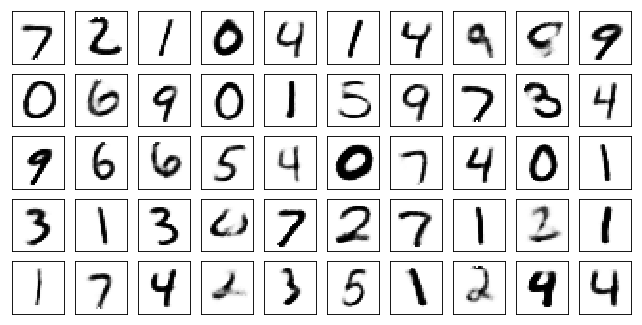

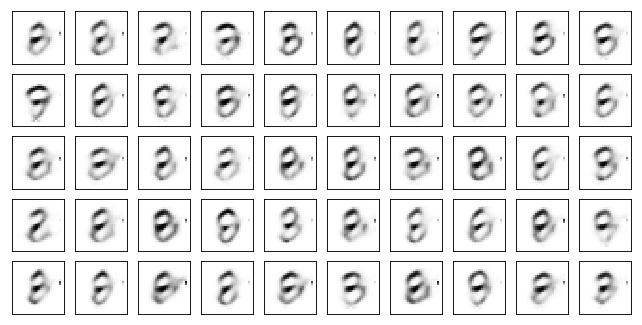

Test losses: AAE10: 0.1046
Train Epoch: 68 [0/50000 (0%)]	Losses AAE10: 0.1226
Train Epoch: 68 [10000/50000 (20%)]	Losses AAE10: 0.1193
Train Epoch: 68 [20000/50000 (40%)]	Losses AAE10: 0.1166
Train Epoch: 68 [30000/50000 (60%)]	Losses AAE10: 0.1190
Train Epoch: 68 [40000/50000 (80%)]	Losses AAE10: 0.1189
Train Epoch: 68 [50000/50000 (100%)]	Losses AAE10: 0.1130


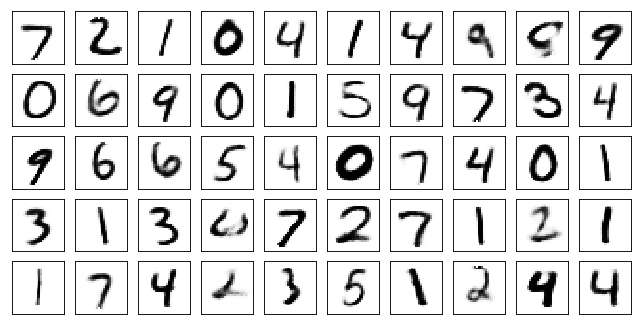

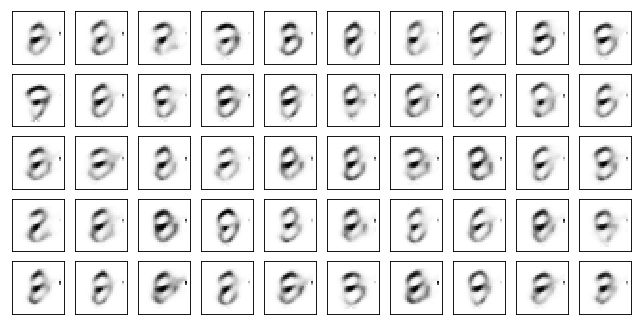

Test losses: AAE10: 0.1048
Train Epoch: 69 [0/50000 (0%)]	Losses AAE10: 0.1162
Train Epoch: 69 [10000/50000 (20%)]	Losses AAE10: 0.1105
Train Epoch: 69 [20000/50000 (40%)]	Losses AAE10: 0.1148
Train Epoch: 69 [30000/50000 (60%)]	Losses AAE10: 0.1140
Train Epoch: 69 [40000/50000 (80%)]	Losses AAE10: 0.1153
Train Epoch: 69 [50000/50000 (100%)]	Losses AAE10: 0.1090


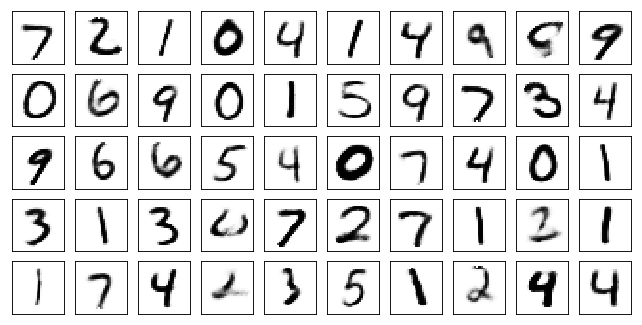

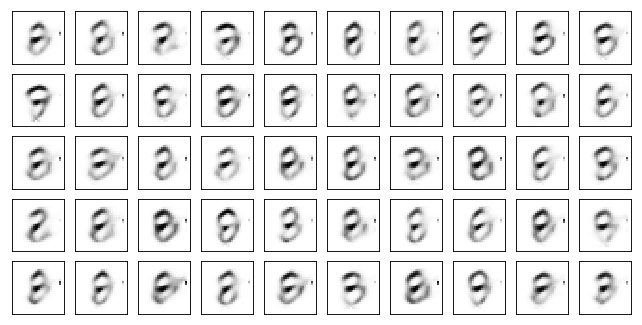

Test losses: AAE10: 0.1044
Train Epoch: 70 [0/50000 (0%)]	Losses AAE10: 0.1120
Train Epoch: 70 [10000/50000 (20%)]	Losses AAE10: 0.1154
Train Epoch: 70 [20000/50000 (40%)]	Losses AAE10: 0.1093
Train Epoch: 70 [30000/50000 (60%)]	Losses AAE10: 0.1129
Train Epoch: 70 [40000/50000 (80%)]	Losses AAE10: 0.1239
Train Epoch: 70 [50000/50000 (100%)]	Losses AAE10: 0.1193


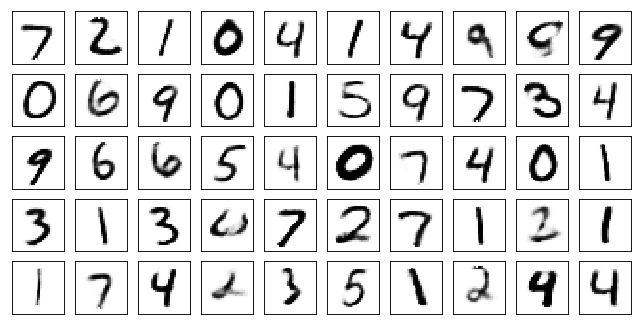

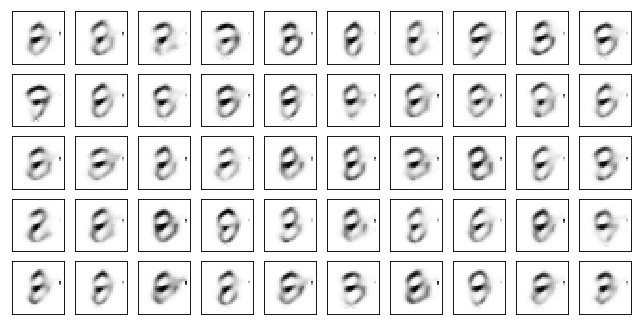

Test losses: AAE10: 0.1044
Train Epoch: 71 [0/50000 (0%)]	Losses AAE10: 0.1126
Train Epoch: 71 [10000/50000 (20%)]	Losses AAE10: 0.1127
Train Epoch: 71 [20000/50000 (40%)]	Losses AAE10: 0.1124
Train Epoch: 71 [30000/50000 (60%)]	Losses AAE10: 0.1096
Train Epoch: 71 [40000/50000 (80%)]	Losses AAE10: 0.1156
Train Epoch: 71 [50000/50000 (100%)]	Losses AAE10: 0.1122


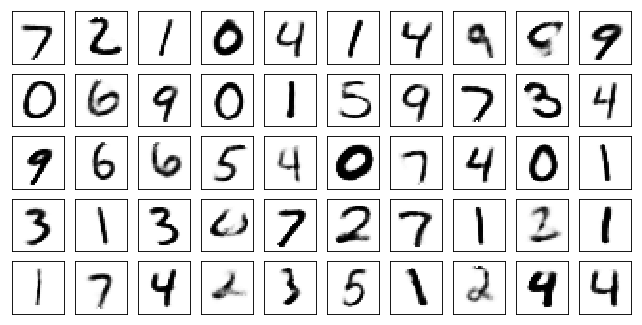

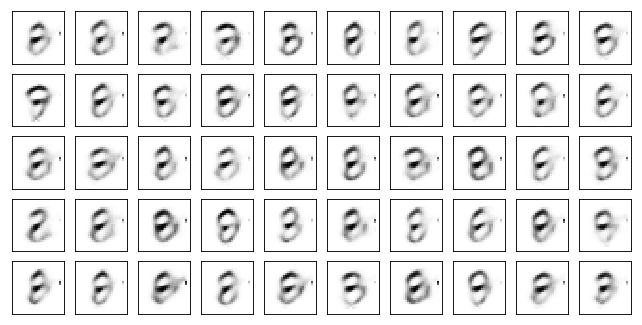

Test losses: AAE10: 0.1044
Train Epoch: 72 [0/50000 (0%)]	Losses AAE10: 0.1182
Train Epoch: 72 [10000/50000 (20%)]	Losses AAE10: 0.1174
Train Epoch: 72 [20000/50000 (40%)]	Losses AAE10: 0.1138
Train Epoch: 72 [30000/50000 (60%)]	Losses AAE10: 0.1154
Train Epoch: 72 [40000/50000 (80%)]	Losses AAE10: 0.1109
Train Epoch: 72 [50000/50000 (100%)]	Losses AAE10: 0.1082


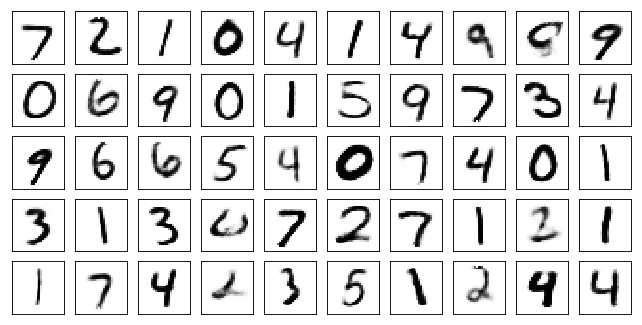

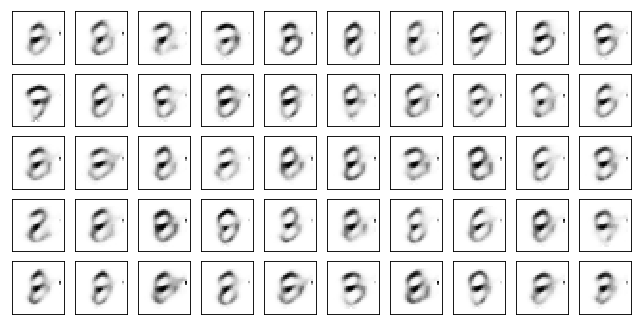

Test losses: AAE10: 0.1043
Train Epoch: 73 [0/50000 (0%)]	Losses AAE10: 0.1141
Train Epoch: 73 [10000/50000 (20%)]	Losses AAE10: 0.1063
Train Epoch: 73 [20000/50000 (40%)]	Losses AAE10: 0.1089
Train Epoch: 73 [30000/50000 (60%)]	Losses AAE10: 0.1140
Train Epoch: 73 [40000/50000 (80%)]	Losses AAE10: 0.1108
Train Epoch: 73 [50000/50000 (100%)]	Losses AAE10: 0.1093


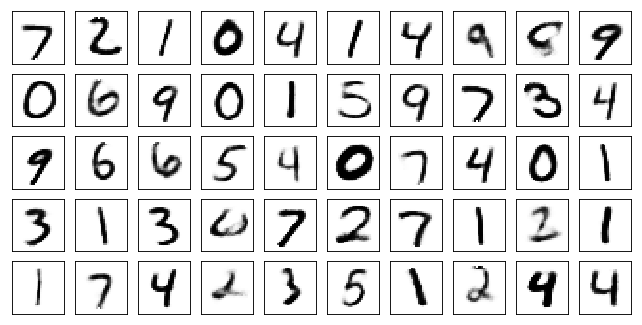

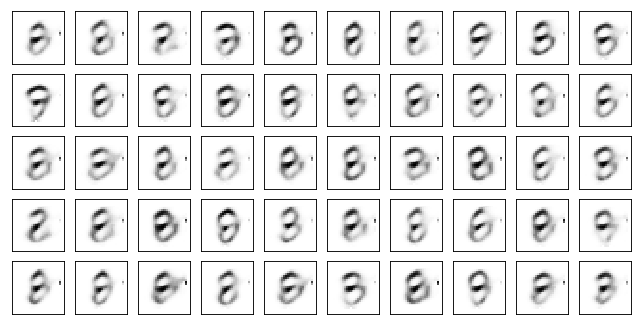

Test losses: AAE10: 0.1042
Train Epoch: 74 [0/50000 (0%)]	Losses AAE10: 0.1102
Train Epoch: 74 [10000/50000 (20%)]	Losses AAE10: 0.1172
Train Epoch: 74 [20000/50000 (40%)]	Losses AAE10: 0.1163
Train Epoch: 74 [30000/50000 (60%)]	Losses AAE10: 0.1150
Train Epoch: 74 [40000/50000 (80%)]	Losses AAE10: 0.1131
Train Epoch: 74 [50000/50000 (100%)]	Losses AAE10: 0.1077


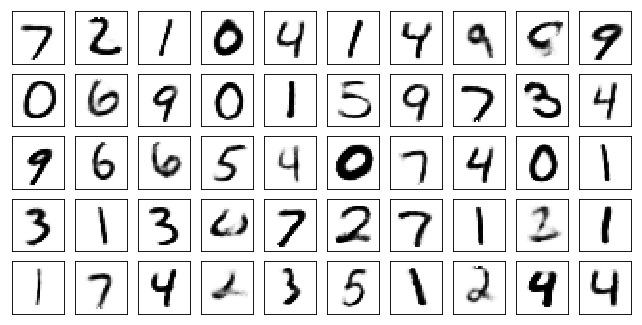

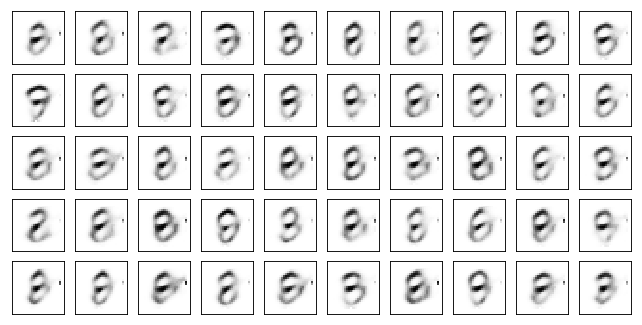

Test losses: AAE10: 0.1039
Train Epoch: 75 [0/50000 (0%)]	Losses AAE10: 0.1139
Train Epoch: 75 [10000/50000 (20%)]	Losses AAE10: 0.1087
Train Epoch: 75 [20000/50000 (40%)]	Losses AAE10: 0.1122
Train Epoch: 75 [30000/50000 (60%)]	Losses AAE10: 0.1149
Train Epoch: 75 [40000/50000 (80%)]	Losses AAE10: 0.1101
Train Epoch: 75 [50000/50000 (100%)]	Losses AAE10: 0.1155


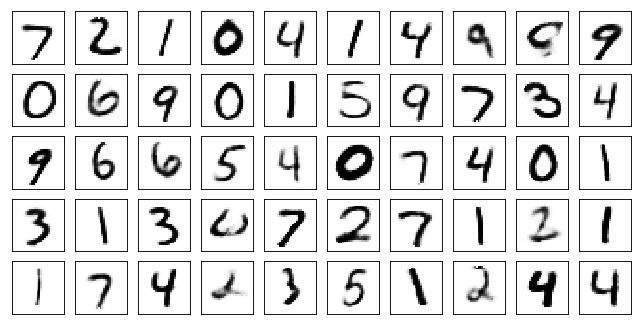

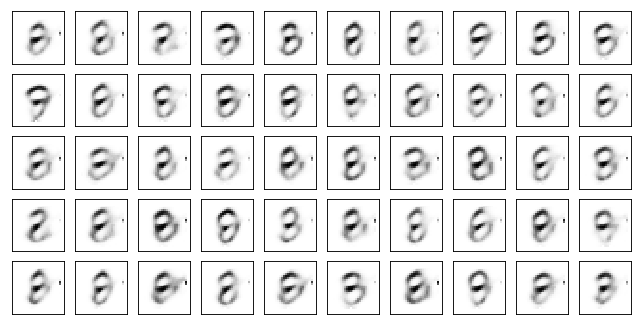

Test losses: AAE10: 0.1041
Train Epoch: 76 [0/50000 (0%)]	Losses AAE10: 0.1102
Train Epoch: 76 [10000/50000 (20%)]	Losses AAE10: 0.1275
Train Epoch: 76 [20000/50000 (40%)]	Losses AAE10: 0.1115
Train Epoch: 76 [30000/50000 (60%)]	Losses AAE10: 0.1163
Train Epoch: 76 [40000/50000 (80%)]	Losses AAE10: 0.1115
Train Epoch: 76 [50000/50000 (100%)]	Losses AAE10: 0.1110


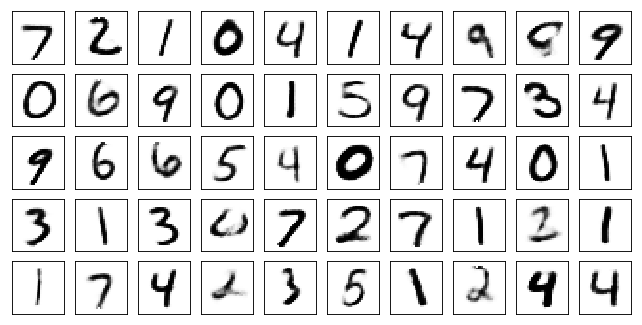

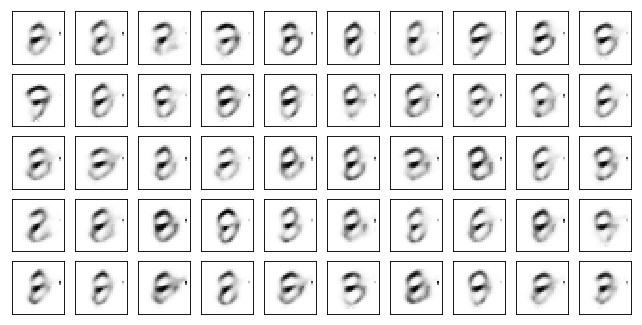

Test losses: AAE10: 0.1038
Train Epoch: 77 [0/50000 (0%)]	Losses AAE10: 0.1146
Train Epoch: 77 [10000/50000 (20%)]	Losses AAE10: 0.1095
Train Epoch: 77 [20000/50000 (40%)]	Losses AAE10: 0.1195
Train Epoch: 77 [30000/50000 (60%)]	Losses AAE10: 0.1109
Train Epoch: 77 [40000/50000 (80%)]	Losses AAE10: 0.1177
Train Epoch: 77 [50000/50000 (100%)]	Losses AAE10: 0.1199


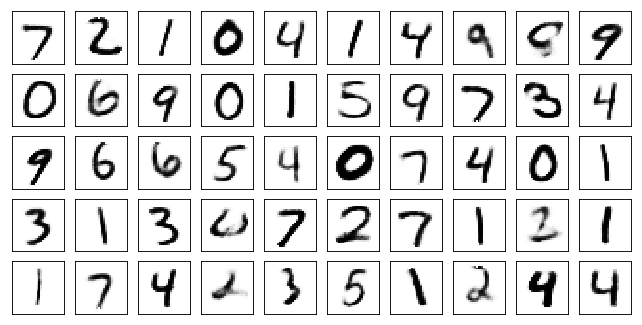

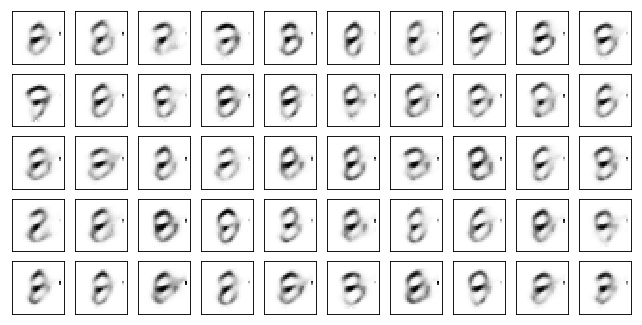

Test losses: AAE10: 0.1038
Train Epoch: 78 [0/50000 (0%)]	Losses AAE10: 0.1176
Train Epoch: 78 [10000/50000 (20%)]	Losses AAE10: 0.1149
Train Epoch: 78 [20000/50000 (40%)]	Losses AAE10: 0.1199
Train Epoch: 78 [30000/50000 (60%)]	Losses AAE10: 0.1133
Train Epoch: 78 [40000/50000 (80%)]	Losses AAE10: 0.1119
Train Epoch: 78 [50000/50000 (100%)]	Losses AAE10: 0.1227


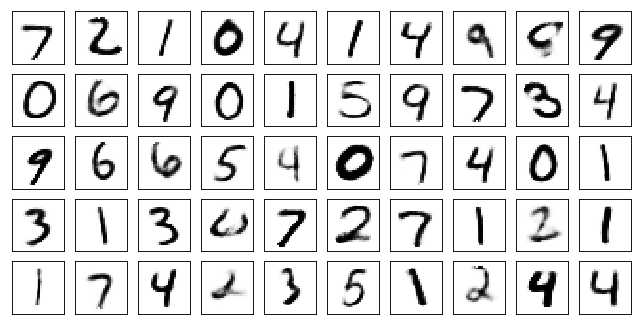

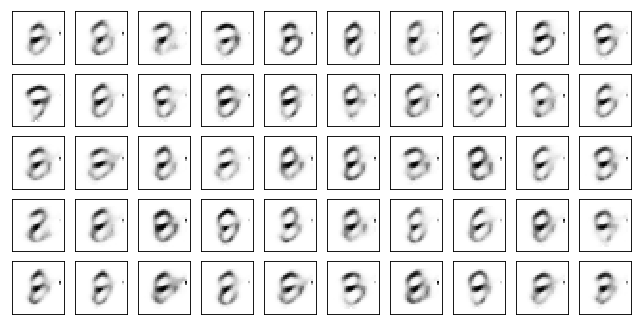

Test losses: AAE10: 0.1038
Train Epoch: 79 [0/50000 (0%)]	Losses AAE10: 0.1133
Train Epoch: 79 [10000/50000 (20%)]	Losses AAE10: 0.1191
Train Epoch: 79 [20000/50000 (40%)]	Losses AAE10: 0.1215
Train Epoch: 79 [30000/50000 (60%)]	Losses AAE10: 0.1122
Train Epoch: 79 [40000/50000 (80%)]	Losses AAE10: 0.1112
Train Epoch: 79 [50000/50000 (100%)]	Losses AAE10: 0.1152


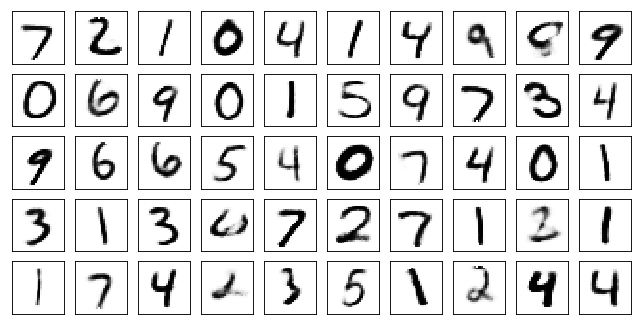

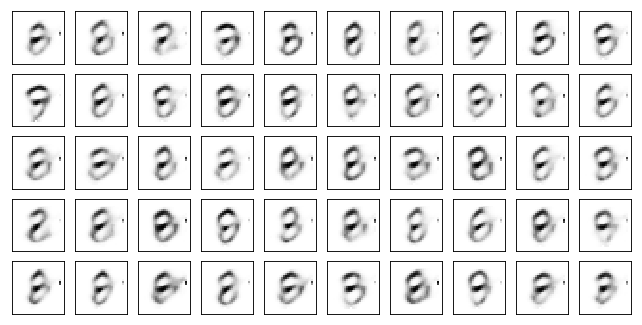

Test losses: AAE10: 0.1037
Train Epoch: 80 [0/50000 (0%)]	Losses AAE10: 0.1078
Train Epoch: 80 [10000/50000 (20%)]	Losses AAE10: 0.1133
Train Epoch: 80 [20000/50000 (40%)]	Losses AAE10: 0.1201
Train Epoch: 80 [30000/50000 (60%)]	Losses AAE10: 0.1129
Train Epoch: 80 [40000/50000 (80%)]	Losses AAE10: 0.1142
Train Epoch: 80 [50000/50000 (100%)]	Losses AAE10: 0.1120


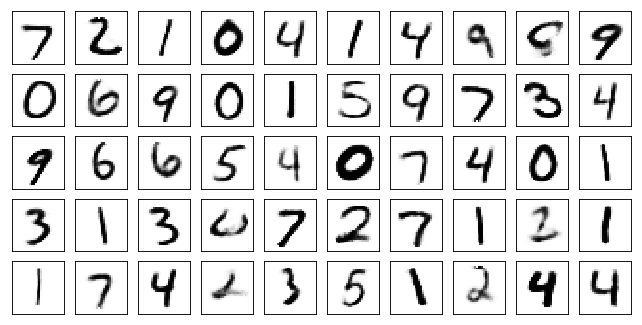

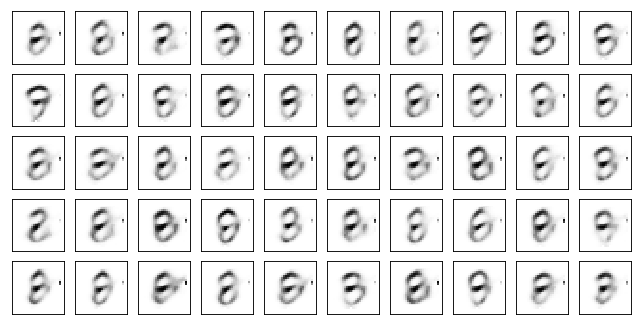

Test losses: AAE10: 0.1038
Train Epoch: 81 [0/50000 (0%)]	Losses AAE10: 0.1174
Train Epoch: 81 [10000/50000 (20%)]	Losses AAE10: 0.1195
Train Epoch: 81 [20000/50000 (40%)]	Losses AAE10: 0.1170
Train Epoch: 81 [30000/50000 (60%)]	Losses AAE10: 0.1170
Train Epoch: 81 [40000/50000 (80%)]	Losses AAE10: 0.1065
Train Epoch: 81 [50000/50000 (100%)]	Losses AAE10: 0.1148


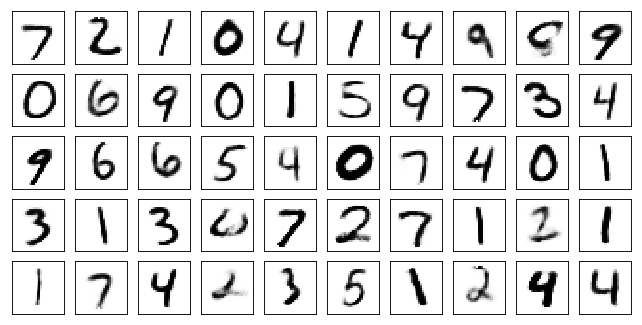

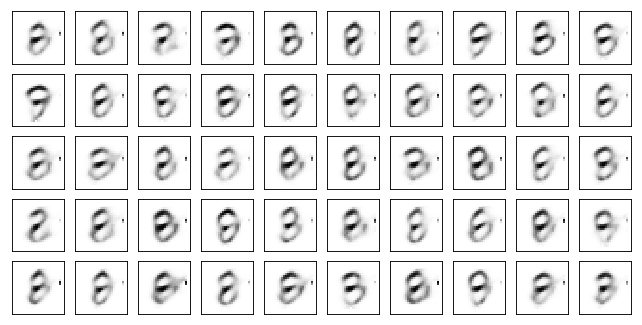

Test losses: AAE10: 0.1036
Train Epoch: 82 [0/50000 (0%)]	Losses AAE10: 0.1083
Train Epoch: 82 [10000/50000 (20%)]	Losses AAE10: 0.1227
Train Epoch: 82 [20000/50000 (40%)]	Losses AAE10: 0.1195
Train Epoch: 82 [30000/50000 (60%)]	Losses AAE10: 0.0990
Train Epoch: 82 [40000/50000 (80%)]	Losses AAE10: 0.1230
Train Epoch: 82 [50000/50000 (100%)]	Losses AAE10: 0.1106


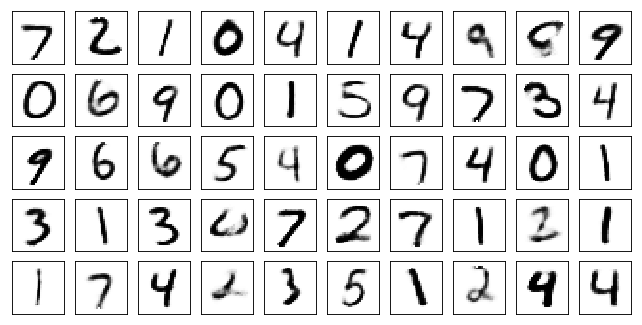

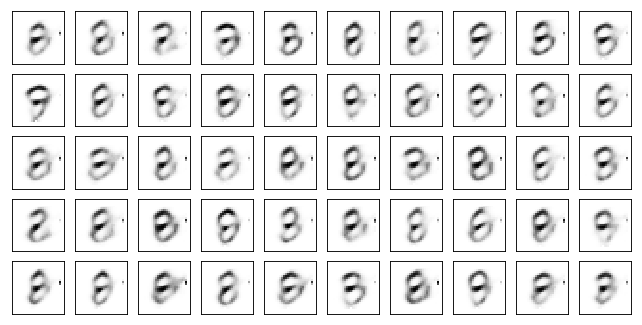

Test losses: AAE10: 0.1035
Train Epoch: 83 [0/50000 (0%)]	Losses AAE10: 0.1136
Train Epoch: 83 [10000/50000 (20%)]	Losses AAE10: 0.1130
Train Epoch: 83 [20000/50000 (40%)]	Losses AAE10: 0.1171
Train Epoch: 83 [30000/50000 (60%)]	Losses AAE10: 0.1194
Train Epoch: 83 [40000/50000 (80%)]	Losses AAE10: 0.1152
Train Epoch: 83 [50000/50000 (100%)]	Losses AAE10: 0.1214


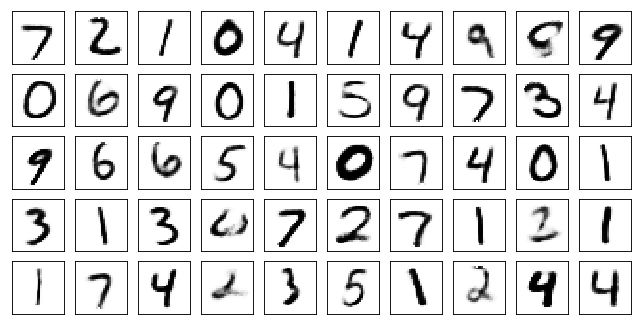

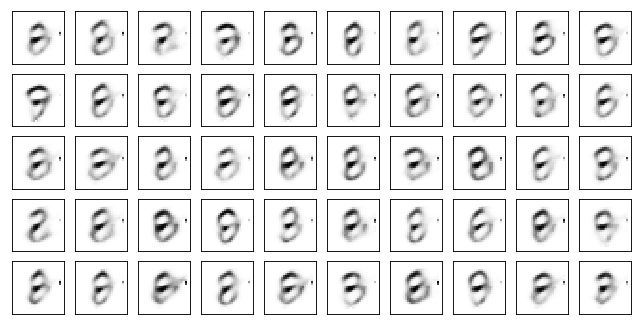

Test losses: AAE10: 0.1036
Train Epoch: 84 [0/50000 (0%)]	Losses AAE10: 0.1140
Train Epoch: 84 [10000/50000 (20%)]	Losses AAE10: 0.1068
Train Epoch: 84 [20000/50000 (40%)]	Losses AAE10: 0.1095
Train Epoch: 84 [30000/50000 (60%)]	Losses AAE10: 0.1246
Train Epoch: 84 [40000/50000 (80%)]	Losses AAE10: 0.1238
Train Epoch: 84 [50000/50000 (100%)]	Losses AAE10: 0.1140


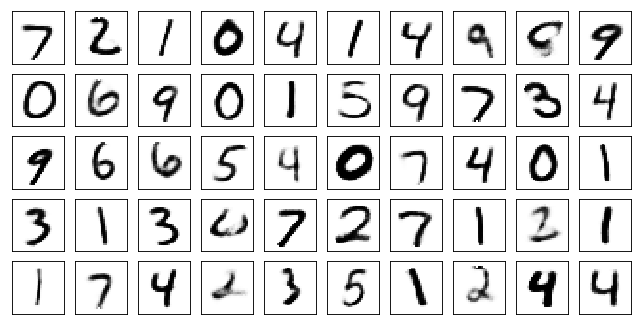

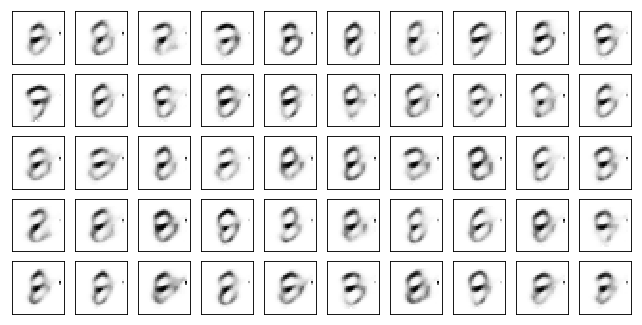

Test losses: AAE10: 0.1033
Train Epoch: 85 [0/50000 (0%)]	Losses AAE10: 0.1125
Train Epoch: 85 [10000/50000 (20%)]	Losses AAE10: 0.1177
Train Epoch: 85 [20000/50000 (40%)]	Losses AAE10: 0.1082
Train Epoch: 85 [30000/50000 (60%)]	Losses AAE10: 0.1185
Train Epoch: 85 [40000/50000 (80%)]	Losses AAE10: 0.1147
Train Epoch: 85 [50000/50000 (100%)]	Losses AAE10: 0.1151


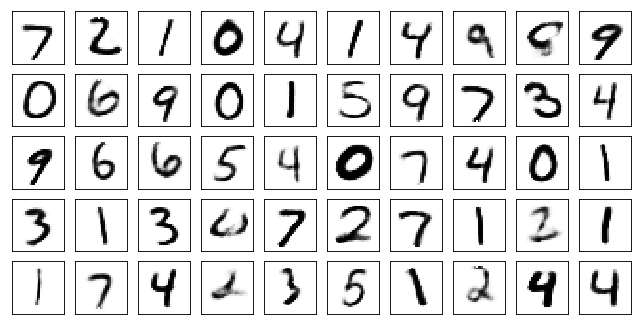

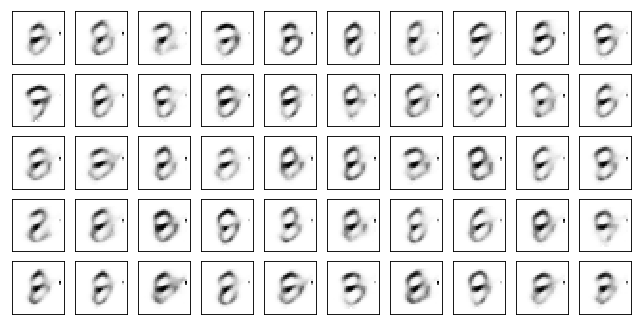

Test losses: AAE10: 0.1034
Train Epoch: 86 [0/50000 (0%)]	Losses AAE10: 0.1136
Train Epoch: 86 [10000/50000 (20%)]	Losses AAE10: 0.1093
Train Epoch: 86 [20000/50000 (40%)]	Losses AAE10: 0.1158
Train Epoch: 86 [30000/50000 (60%)]	Losses AAE10: 0.1180
Train Epoch: 86 [40000/50000 (80%)]	Losses AAE10: 0.1158
Train Epoch: 86 [50000/50000 (100%)]	Losses AAE10: 0.1111


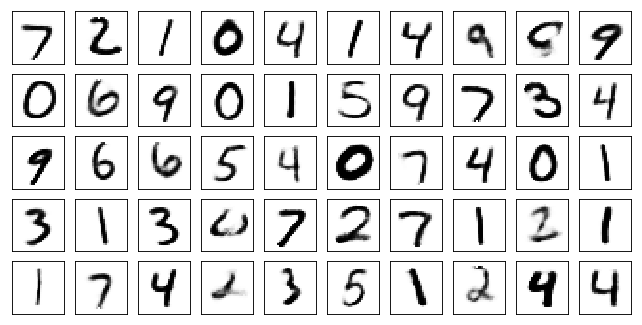

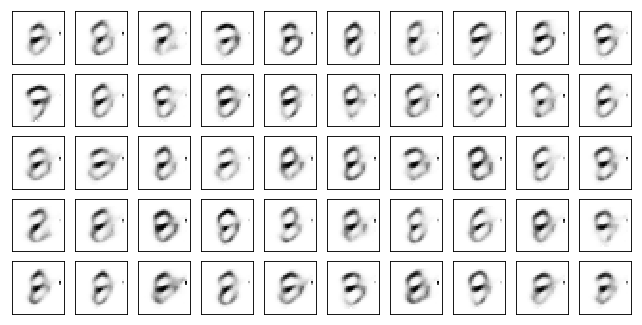

Test losses: AAE10: 0.1033
Train Epoch: 87 [0/50000 (0%)]	Losses AAE10: 0.1104
Train Epoch: 87 [10000/50000 (20%)]	Losses AAE10: 0.1139
Train Epoch: 87 [20000/50000 (40%)]	Losses AAE10: 0.1115
Train Epoch: 87 [30000/50000 (60%)]	Losses AAE10: 0.1142
Train Epoch: 87 [40000/50000 (80%)]	Losses AAE10: 0.1193
Train Epoch: 87 [50000/50000 (100%)]	Losses AAE10: 0.1118


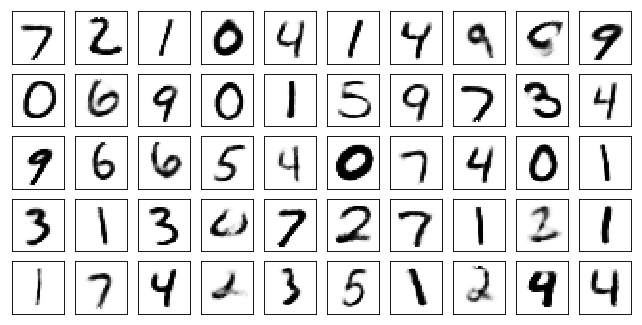

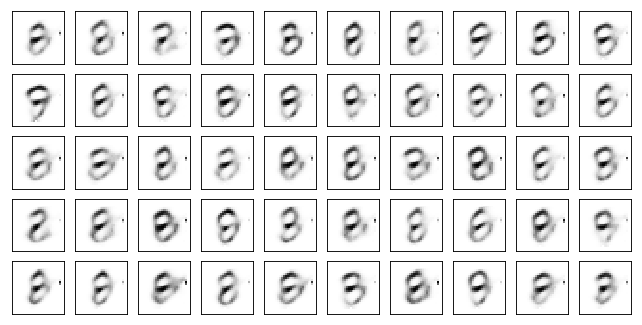

Test losses: AAE10: 0.1033
Train Epoch: 88 [0/50000 (0%)]	Losses AAE10: 0.1088
Train Epoch: 88 [10000/50000 (20%)]	Losses AAE10: 0.1182
Train Epoch: 88 [20000/50000 (40%)]	Losses AAE10: 0.1094
Train Epoch: 88 [30000/50000 (60%)]	Losses AAE10: 0.1057
Train Epoch: 88 [40000/50000 (80%)]	Losses AAE10: 0.1094
Train Epoch: 88 [50000/50000 (100%)]	Losses AAE10: 0.1190


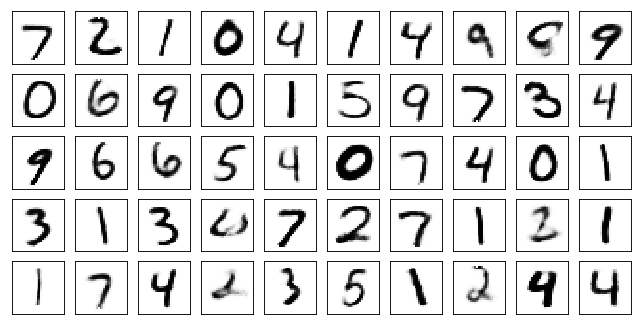

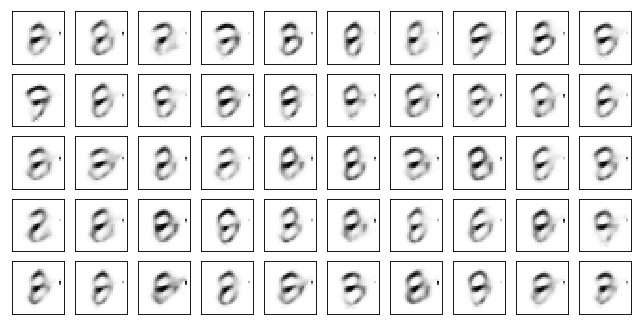

Test losses: AAE10: 0.1033
Train Epoch: 89 [0/50000 (0%)]	Losses AAE10: 0.1185
Train Epoch: 89 [10000/50000 (20%)]	Losses AAE10: 0.1147
Train Epoch: 89 [20000/50000 (40%)]	Losses AAE10: 0.1061
Train Epoch: 89 [30000/50000 (60%)]	Losses AAE10: 0.1161
Train Epoch: 89 [40000/50000 (80%)]	Losses AAE10: 0.1120
Train Epoch: 89 [50000/50000 (100%)]	Losses AAE10: 0.1298


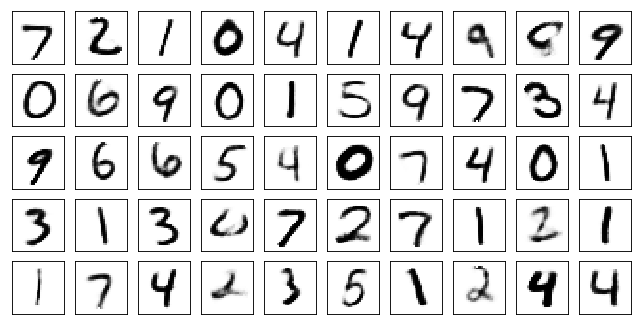

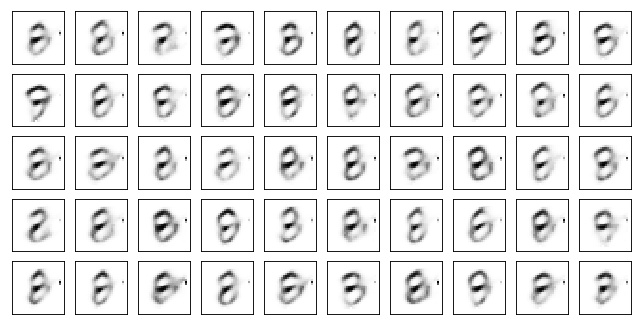

Test losses: AAE10: 0.1030
Train Epoch: 90 [0/50000 (0%)]	Losses AAE10: 0.1098
Train Epoch: 90 [10000/50000 (20%)]	Losses AAE10: 0.1161
Train Epoch: 90 [20000/50000 (40%)]	Losses AAE10: 0.1064
Train Epoch: 90 [30000/50000 (60%)]	Losses AAE10: 0.1127
Train Epoch: 90 [40000/50000 (80%)]	Losses AAE10: 0.1081
Train Epoch: 90 [50000/50000 (100%)]	Losses AAE10: 0.1107


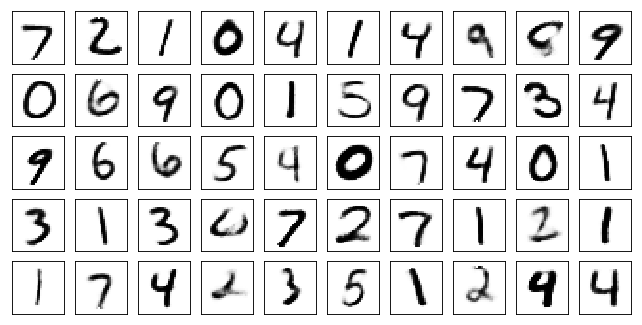

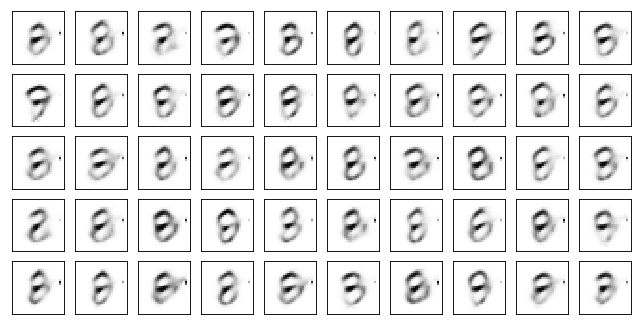

Test losses: AAE10: 0.1032
Train Epoch: 91 [0/50000 (0%)]	Losses AAE10: 0.1176
Train Epoch: 91 [10000/50000 (20%)]	Losses AAE10: 0.1109
Train Epoch: 91 [20000/50000 (40%)]	Losses AAE10: 0.1078
Train Epoch: 91 [30000/50000 (60%)]	Losses AAE10: 0.1226
Train Epoch: 91 [40000/50000 (80%)]	Losses AAE10: 0.1115
Train Epoch: 91 [50000/50000 (100%)]	Losses AAE10: 0.1110


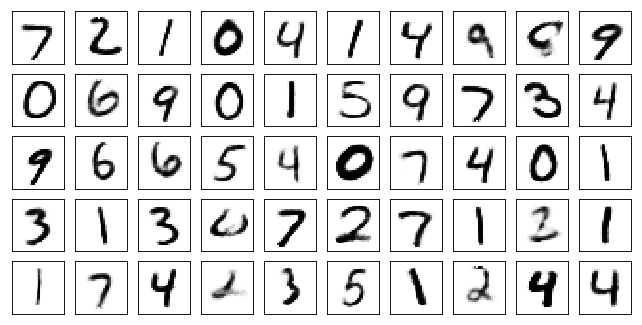

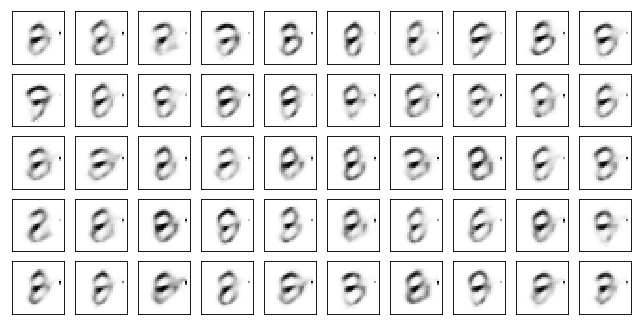

Test losses: AAE10: 0.1030
Train Epoch: 92 [0/50000 (0%)]	Losses AAE10: 0.1084
Train Epoch: 92 [10000/50000 (20%)]	Losses AAE10: 0.1175
Train Epoch: 92 [20000/50000 (40%)]	Losses AAE10: 0.1191
Train Epoch: 92 [30000/50000 (60%)]	Losses AAE10: 0.1152
Train Epoch: 92 [40000/50000 (80%)]	Losses AAE10: 0.1073
Train Epoch: 92 [50000/50000 (100%)]	Losses AAE10: 0.1187


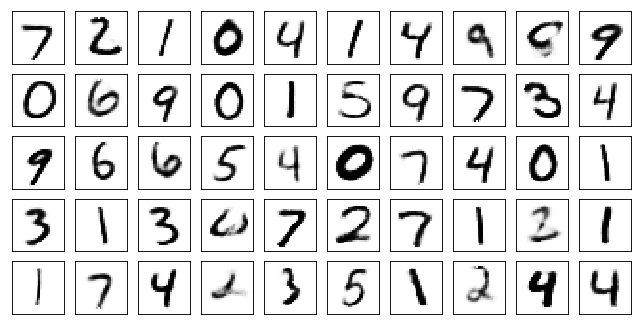

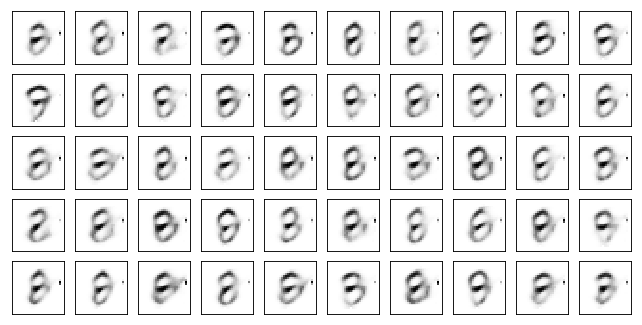

Test losses: AAE10: 0.1030
Train Epoch: 93 [0/50000 (0%)]	Losses AAE10: 0.1068
Train Epoch: 93 [10000/50000 (20%)]	Losses AAE10: 0.1128
Train Epoch: 93 [20000/50000 (40%)]	Losses AAE10: 0.1126
Train Epoch: 93 [30000/50000 (60%)]	Losses AAE10: 0.1063
Train Epoch: 93 [40000/50000 (80%)]	Losses AAE10: 0.1042
Train Epoch: 93 [50000/50000 (100%)]	Losses AAE10: 0.1202


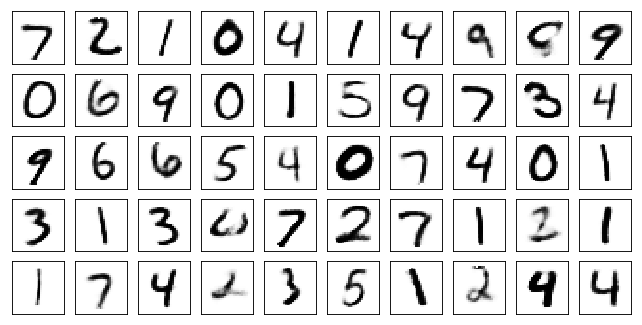

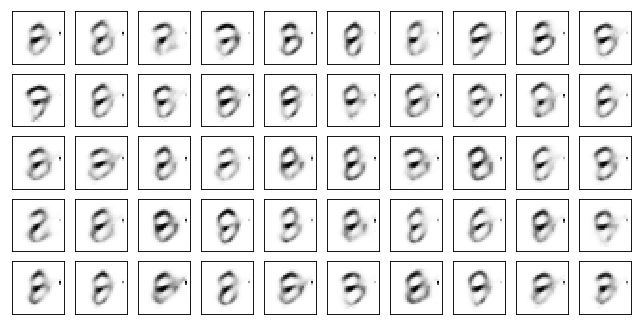

Test losses: AAE10: 0.1027
Train Epoch: 94 [0/50000 (0%)]	Losses AAE10: 0.1152
Train Epoch: 94 [10000/50000 (20%)]	Losses AAE10: 0.1070
Train Epoch: 94 [20000/50000 (40%)]	Losses AAE10: 0.1156
Train Epoch: 94 [30000/50000 (60%)]	Losses AAE10: 0.1061
Train Epoch: 94 [40000/50000 (80%)]	Losses AAE10: 0.1080
Train Epoch: 94 [50000/50000 (100%)]	Losses AAE10: 0.1149


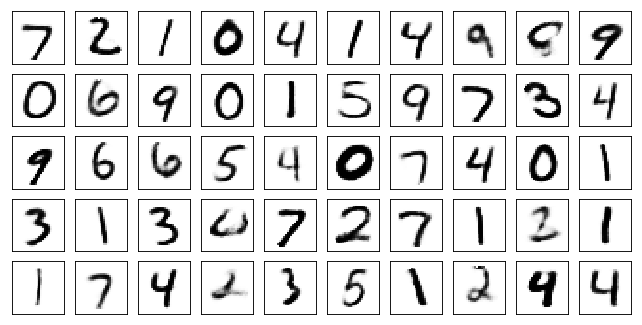

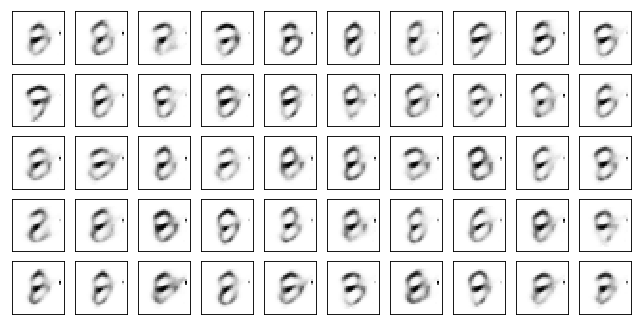

Test losses: AAE10: 0.1026
Train Epoch: 95 [0/50000 (0%)]	Losses AAE10: 0.1158
Train Epoch: 95 [10000/50000 (20%)]	Losses AAE10: 0.1163
Train Epoch: 95 [20000/50000 (40%)]	Losses AAE10: 0.1083
Train Epoch: 95 [30000/50000 (60%)]	Losses AAE10: 0.1134
Train Epoch: 95 [40000/50000 (80%)]	Losses AAE10: 0.1072
Train Epoch: 95 [50000/50000 (100%)]	Losses AAE10: 0.1108


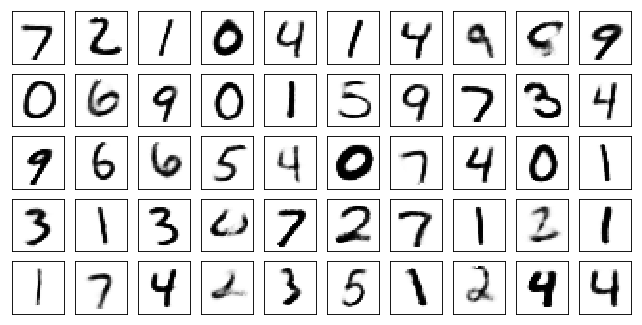

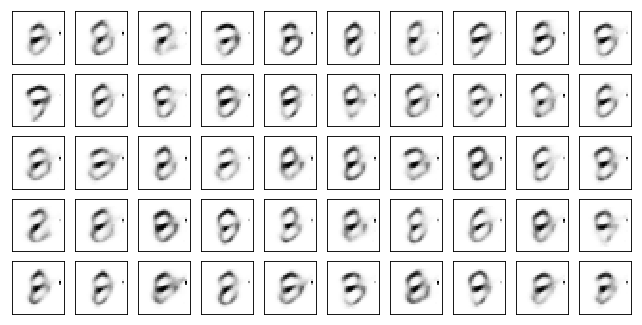

Test losses: AAE10: 0.1028
Train Epoch: 96 [0/50000 (0%)]	Losses AAE10: 0.1062
Train Epoch: 96 [10000/50000 (20%)]	Losses AAE10: 0.1123
Train Epoch: 96 [20000/50000 (40%)]	Losses AAE10: 0.1104
Train Epoch: 96 [30000/50000 (60%)]	Losses AAE10: 0.1127
Train Epoch: 96 [40000/50000 (80%)]	Losses AAE10: 0.1114
Train Epoch: 96 [50000/50000 (100%)]	Losses AAE10: 0.1200


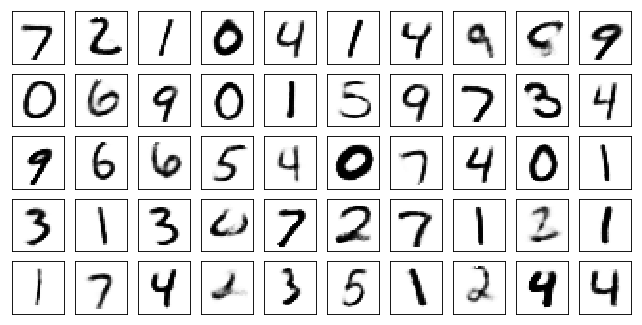

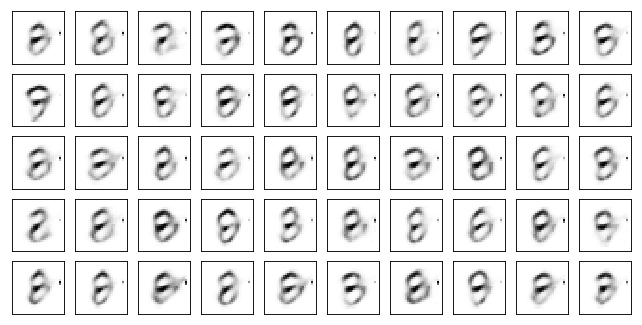

Test losses: AAE10: 0.1027
Train Epoch: 97 [0/50000 (0%)]	Losses AAE10: 0.1117
Train Epoch: 97 [10000/50000 (20%)]	Losses AAE10: 0.1145
Train Epoch: 97 [20000/50000 (40%)]	Losses AAE10: 0.1114
Train Epoch: 97 [30000/50000 (60%)]	Losses AAE10: 0.1045
Train Epoch: 97 [40000/50000 (80%)]	Losses AAE10: 0.1142
Train Epoch: 97 [50000/50000 (100%)]	Losses AAE10: 0.1160


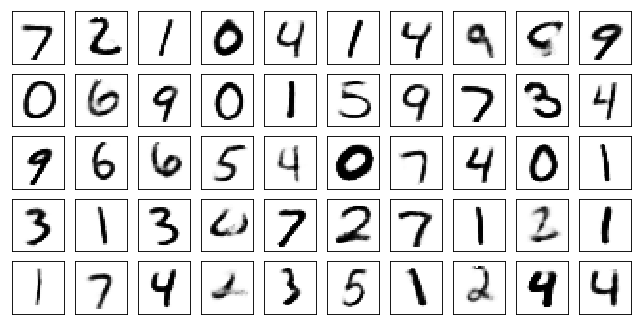

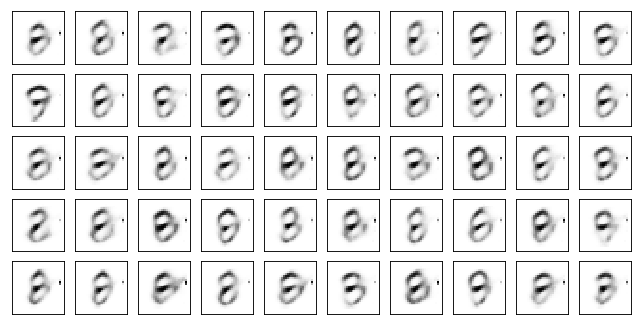

Test losses: AAE10: 0.1027
Train Epoch: 98 [0/50000 (0%)]	Losses AAE10: 0.1126
Train Epoch: 98 [10000/50000 (20%)]	Losses AAE10: 0.1193
Train Epoch: 98 [20000/50000 (40%)]	Losses AAE10: 0.1125
Train Epoch: 98 [30000/50000 (60%)]	Losses AAE10: 0.1123
Train Epoch: 98 [40000/50000 (80%)]	Losses AAE10: 0.1124
Train Epoch: 98 [50000/50000 (100%)]	Losses AAE10: 0.1110


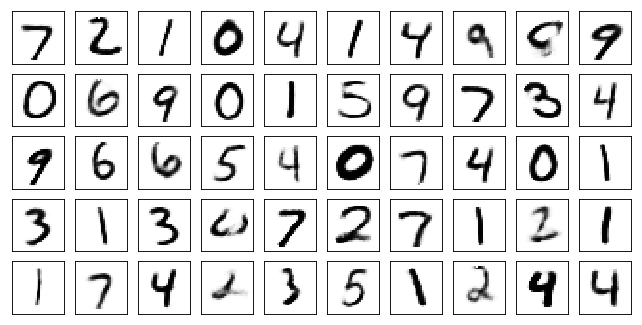

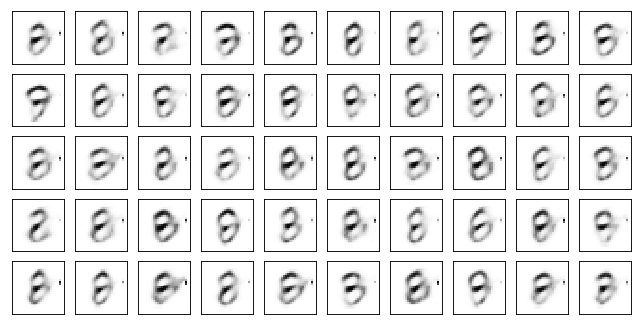

Test losses: AAE10: 0.1025
Train Epoch: 99 [0/50000 (0%)]	Losses AAE10: 0.1149
Train Epoch: 99 [10000/50000 (20%)]	Losses AAE10: 0.1123
Train Epoch: 99 [20000/50000 (40%)]	Losses AAE10: 0.1170
Train Epoch: 99 [30000/50000 (60%)]	Losses AAE10: 0.1141
Train Epoch: 99 [40000/50000 (80%)]	Losses AAE10: 0.1078
Train Epoch: 99 [50000/50000 (100%)]	Losses AAE10: 0.1014


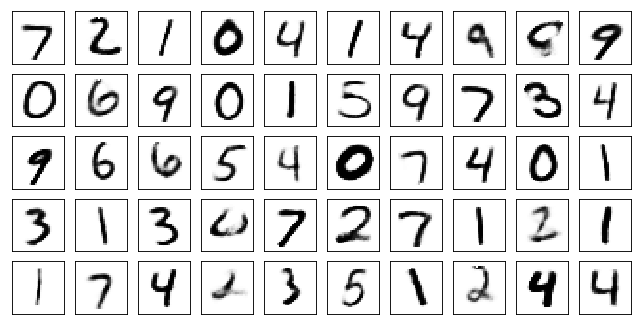

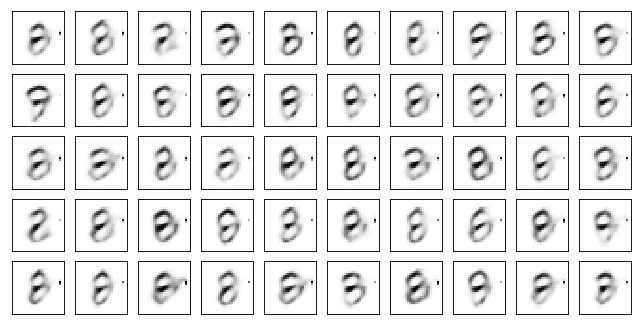

Test losses: AAE10: 0.1025
Train Epoch: 100 [0/50000 (0%)]	Losses AAE10: 0.1048
Train Epoch: 100 [10000/50000 (20%)]	Losses AAE10: 0.1079
Train Epoch: 100 [20000/50000 (40%)]	Losses AAE10: 0.1198
Train Epoch: 100 [30000/50000 (60%)]	Losses AAE10: 0.1108
Train Epoch: 100 [40000/50000 (80%)]	Losses AAE10: 0.1160
Train Epoch: 100 [50000/50000 (100%)]	Losses AAE10: 0.1042


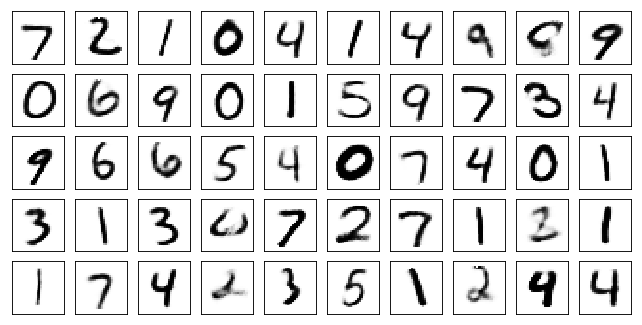

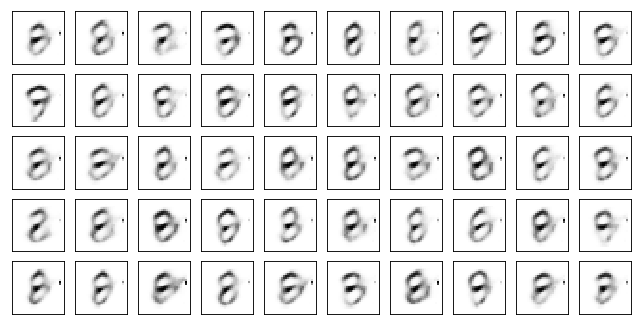

Test losses: AAE10: 0.1025
Train Epoch: 101 [0/50000 (0%)]	Losses AAE10: 0.1119
Train Epoch: 101 [10000/50000 (20%)]	Losses AAE10: 0.1168
Train Epoch: 101 [20000/50000 (40%)]	Losses AAE10: 0.1162
Train Epoch: 101 [30000/50000 (60%)]	Losses AAE10: 0.1067
Train Epoch: 101 [40000/50000 (80%)]	Losses AAE10: 0.1154
Train Epoch: 101 [50000/50000 (100%)]	Losses AAE10: 0.1127


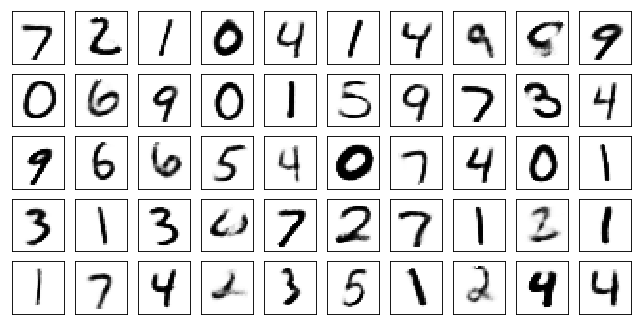

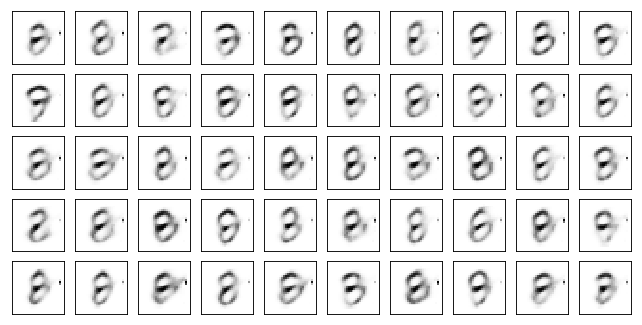

Test losses: AAE10: 0.1024
Train Epoch: 102 [0/50000 (0%)]	Losses AAE10: 0.1034
Train Epoch: 102 [10000/50000 (20%)]	Losses AAE10: 0.1060
Train Epoch: 102 [20000/50000 (40%)]	Losses AAE10: 0.1087
Train Epoch: 102 [30000/50000 (60%)]	Losses AAE10: 0.1158
Train Epoch: 102 [40000/50000 (80%)]	Losses AAE10: 0.1080
Train Epoch: 102 [50000/50000 (100%)]	Losses AAE10: 0.1238


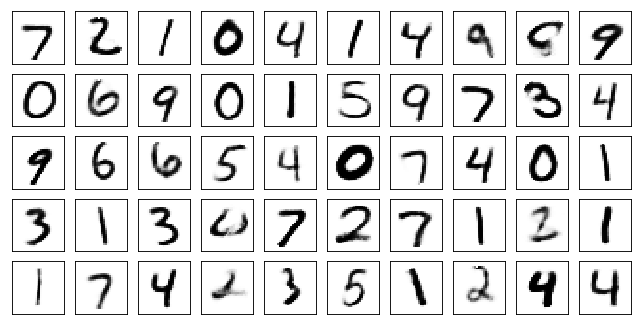

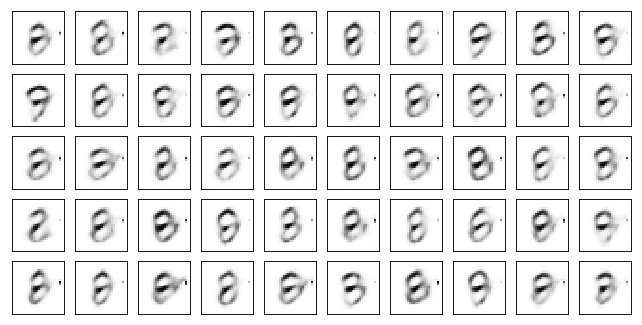

Test losses: AAE10: 0.1023
Train Epoch: 103 [0/50000 (0%)]	Losses AAE10: 0.1073
Train Epoch: 103 [10000/50000 (20%)]	Losses AAE10: 0.1171
Train Epoch: 103 [20000/50000 (40%)]	Losses AAE10: 0.1084
Train Epoch: 103 [30000/50000 (60%)]	Losses AAE10: 0.1131
Train Epoch: 103 [40000/50000 (80%)]	Losses AAE10: 0.1071
Train Epoch: 103 [50000/50000 (100%)]	Losses AAE10: 0.1080


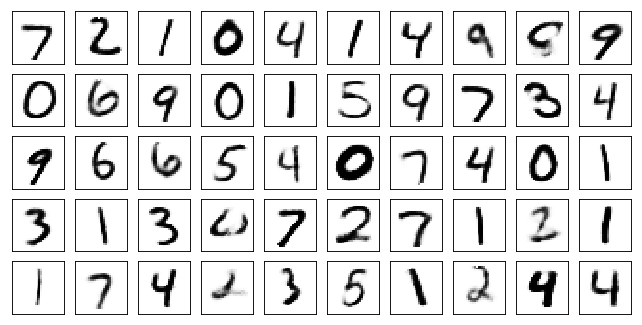

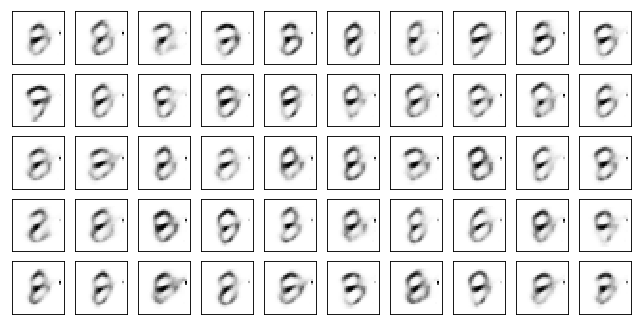

Test losses: AAE10: 0.1021
Train Epoch: 104 [0/50000 (0%)]	Losses AAE10: 0.1092
Train Epoch: 104 [10000/50000 (20%)]	Losses AAE10: 0.1101
Train Epoch: 104 [20000/50000 (40%)]	Losses AAE10: 0.1200
Train Epoch: 104 [30000/50000 (60%)]	Losses AAE10: 0.1184
Train Epoch: 104 [40000/50000 (80%)]	Losses AAE10: 0.1032
Train Epoch: 104 [50000/50000 (100%)]	Losses AAE10: 0.1089


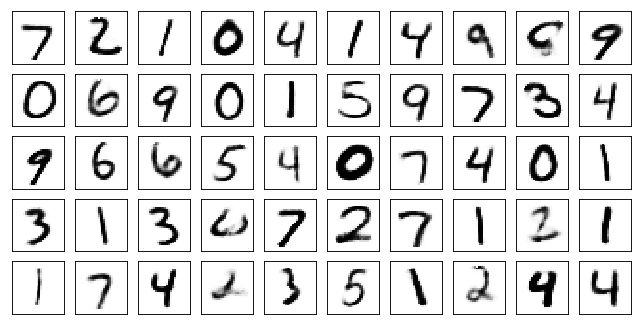

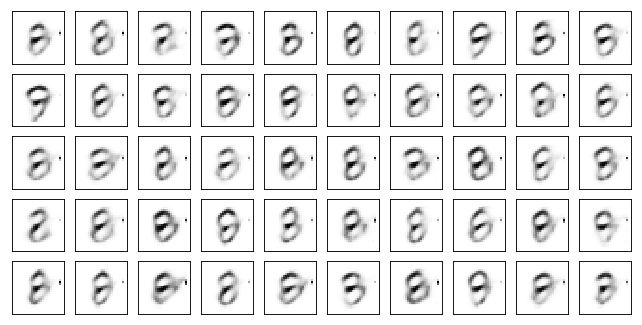

Test losses: AAE10: 0.1023
Train Epoch: 105 [0/50000 (0%)]	Losses AAE10: 0.1140
Train Epoch: 105 [10000/50000 (20%)]	Losses AAE10: 0.1164
Train Epoch: 105 [20000/50000 (40%)]	Losses AAE10: 0.1103
Train Epoch: 105 [30000/50000 (60%)]	Losses AAE10: 0.1043
Train Epoch: 105 [40000/50000 (80%)]	Losses AAE10: 0.1001
Train Epoch: 105 [50000/50000 (100%)]	Losses AAE10: 0.1103


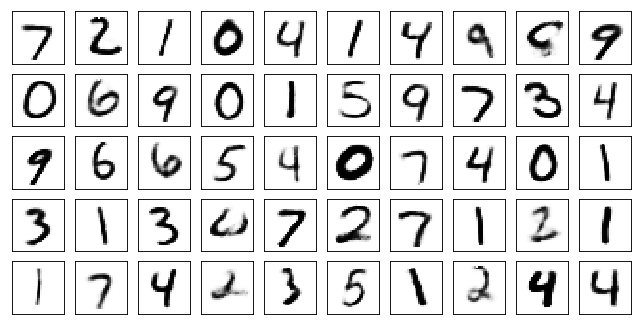

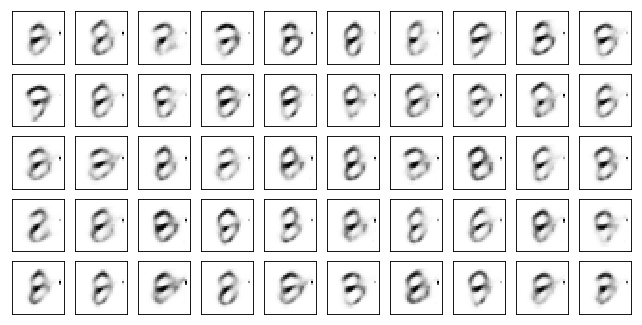

Test losses: AAE10: 0.1023
Train Epoch: 106 [0/50000 (0%)]	Losses AAE10: 0.1071
Train Epoch: 106 [10000/50000 (20%)]	Losses AAE10: 0.1142
Train Epoch: 106 [20000/50000 (40%)]	Losses AAE10: 0.1158
Train Epoch: 106 [30000/50000 (60%)]	Losses AAE10: 0.1169
Train Epoch: 106 [40000/50000 (80%)]	Losses AAE10: 0.1182
Train Epoch: 106 [50000/50000 (100%)]	Losses AAE10: 0.1246


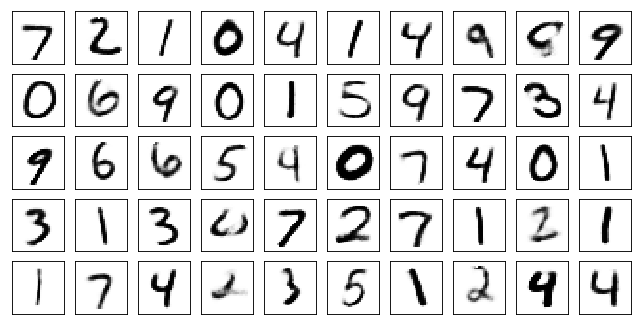

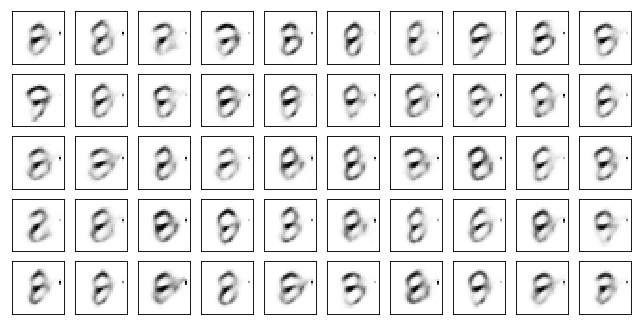

Test losses: AAE10: 0.1023
Train Epoch: 107 [0/50000 (0%)]	Losses AAE10: 0.1163
Train Epoch: 107 [10000/50000 (20%)]	Losses AAE10: 0.1063
Train Epoch: 107 [20000/50000 (40%)]	Losses AAE10: 0.1114
Train Epoch: 107 [30000/50000 (60%)]	Losses AAE10: 0.1187
Train Epoch: 107 [40000/50000 (80%)]	Losses AAE10: 0.1109
Train Epoch: 107 [50000/50000 (100%)]	Losses AAE10: 0.1104


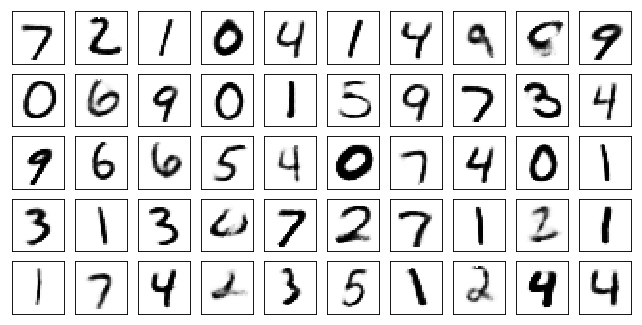

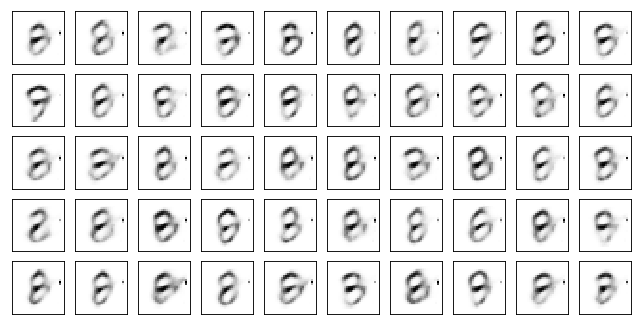

Test losses: AAE10: 0.1021
Train Epoch: 108 [0/50000 (0%)]	Losses AAE10: 0.1079
Train Epoch: 108 [10000/50000 (20%)]	Losses AAE10: 0.1183
Train Epoch: 108 [20000/50000 (40%)]	Losses AAE10: 0.1121
Train Epoch: 108 [30000/50000 (60%)]	Losses AAE10: 0.1169
Train Epoch: 108 [40000/50000 (80%)]	Losses AAE10: 0.1137
Train Epoch: 108 [50000/50000 (100%)]	Losses AAE10: 0.1165


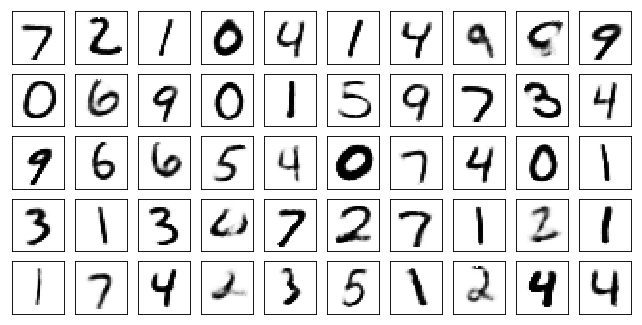

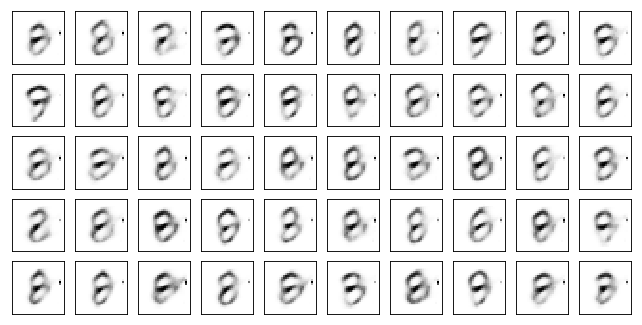

Test losses: AAE10: 0.1021
Train Epoch: 109 [0/50000 (0%)]	Losses AAE10: 0.1113
Train Epoch: 109 [10000/50000 (20%)]	Losses AAE10: 0.1046
Train Epoch: 109 [20000/50000 (40%)]	Losses AAE10: 0.1145
Train Epoch: 109 [30000/50000 (60%)]	Losses AAE10: 0.1114
Train Epoch: 109 [40000/50000 (80%)]	Losses AAE10: 0.1145
Train Epoch: 109 [50000/50000 (100%)]	Losses AAE10: 0.1104


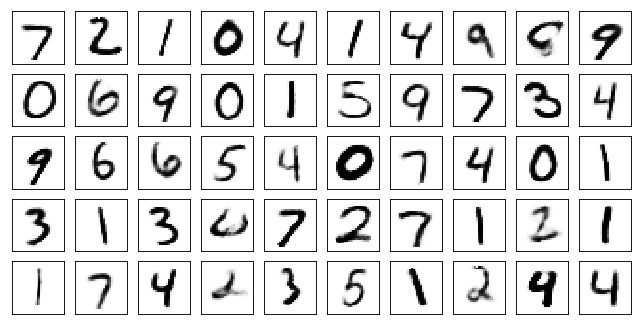

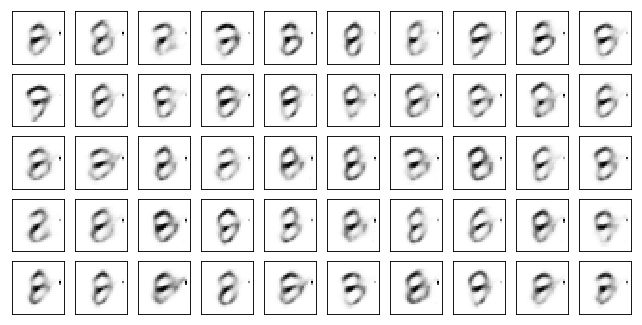

Test losses: AAE10: 0.1019
Train Epoch: 110 [0/50000 (0%)]	Losses AAE10: 0.1102
Train Epoch: 110 [10000/50000 (20%)]	Losses AAE10: 0.1078
Train Epoch: 110 [20000/50000 (40%)]	Losses AAE10: 0.1153
Train Epoch: 110 [30000/50000 (60%)]	Losses AAE10: 0.1133
Train Epoch: 110 [40000/50000 (80%)]	Losses AAE10: 0.1009
Train Epoch: 110 [50000/50000 (100%)]	Losses AAE10: 0.1142


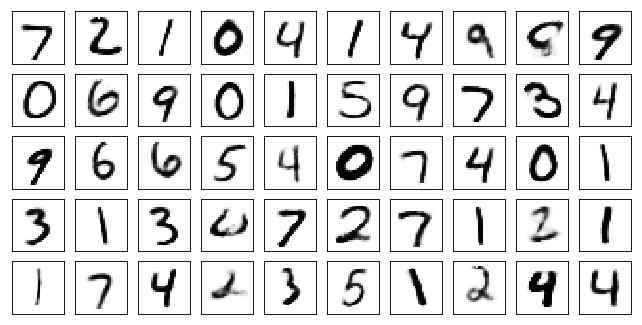

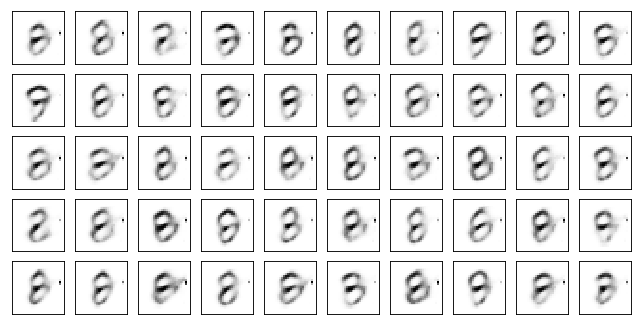

Test losses: AAE10: 0.1019
Train Epoch: 111 [0/50000 (0%)]	Losses AAE10: 0.1177
Train Epoch: 111 [10000/50000 (20%)]	Losses AAE10: 0.1180
Train Epoch: 111 [20000/50000 (40%)]	Losses AAE10: 0.1087
Train Epoch: 111 [30000/50000 (60%)]	Losses AAE10: 0.1135
Train Epoch: 111 [40000/50000 (80%)]	Losses AAE10: 0.1074
Train Epoch: 111 [50000/50000 (100%)]	Losses AAE10: 0.1124


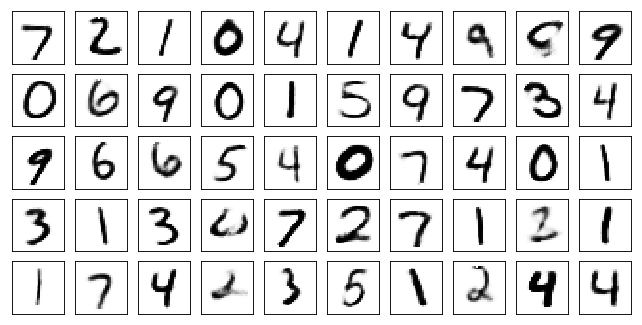

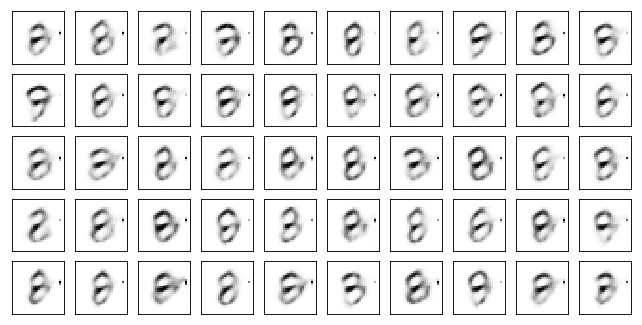

Test losses: AAE10: 0.1021
Train Epoch: 112 [0/50000 (0%)]	Losses AAE10: 0.1126
Train Epoch: 112 [10000/50000 (20%)]	Losses AAE10: 0.1069
Train Epoch: 112 [20000/50000 (40%)]	Losses AAE10: 0.1146
Train Epoch: 112 [30000/50000 (60%)]	Losses AAE10: 0.1088
Train Epoch: 112 [40000/50000 (80%)]	Losses AAE10: 0.1143
Train Epoch: 112 [50000/50000 (100%)]	Losses AAE10: 0.1213


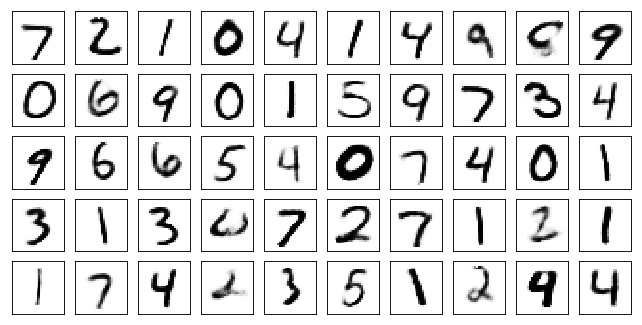

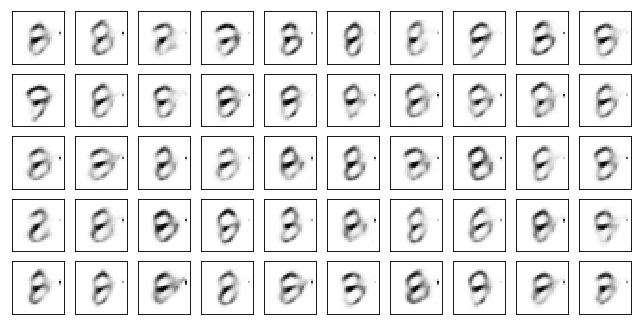

Test losses: AAE10: 0.1020
Train Epoch: 113 [0/50000 (0%)]	Losses AAE10: 0.1133
Train Epoch: 113 [10000/50000 (20%)]	Losses AAE10: 0.1182
Train Epoch: 113 [20000/50000 (40%)]	Losses AAE10: 0.1134
Train Epoch: 113 [30000/50000 (60%)]	Losses AAE10: 0.1112
Train Epoch: 113 [40000/50000 (80%)]	Losses AAE10: 0.1159
Train Epoch: 113 [50000/50000 (100%)]	Losses AAE10: 0.1100


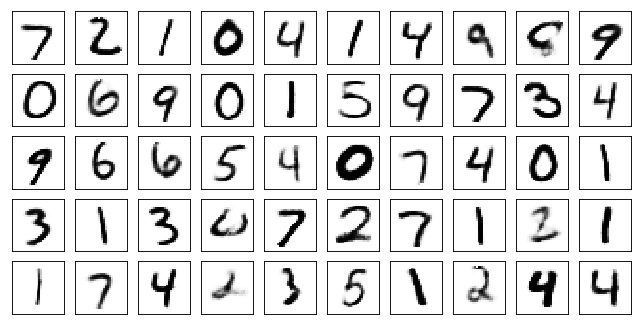

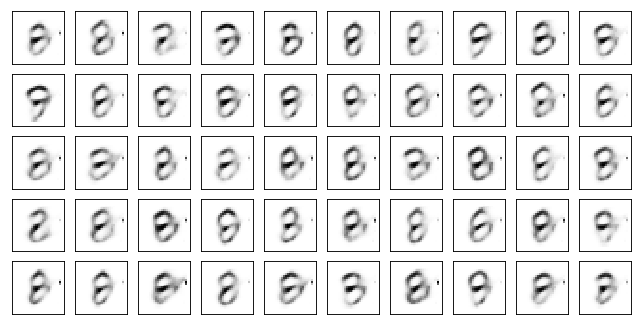

Test losses: AAE10: 0.1020
Train Epoch: 114 [0/50000 (0%)]	Losses AAE10: 0.1142
Train Epoch: 114 [10000/50000 (20%)]	Losses AAE10: 0.1130
Train Epoch: 114 [20000/50000 (40%)]	Losses AAE10: 0.1066
Train Epoch: 114 [30000/50000 (60%)]	Losses AAE10: 0.1093
Train Epoch: 114 [40000/50000 (80%)]	Losses AAE10: 0.1070
Train Epoch: 114 [50000/50000 (100%)]	Losses AAE10: 0.1139


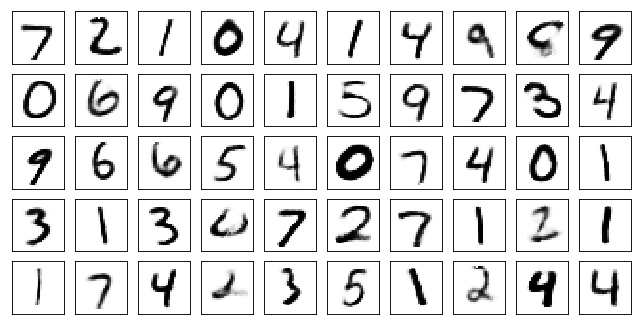

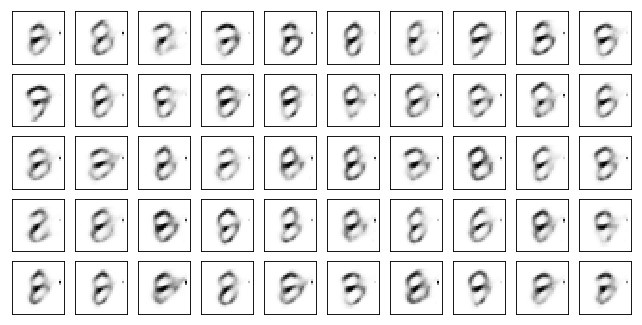

Test losses: AAE10: 0.1018
Train Epoch: 115 [0/50000 (0%)]	Losses AAE10: 0.1029
Train Epoch: 115 [10000/50000 (20%)]	Losses AAE10: 0.1089
Train Epoch: 115 [20000/50000 (40%)]	Losses AAE10: 0.1100
Train Epoch: 115 [30000/50000 (60%)]	Losses AAE10: 0.1099
Train Epoch: 115 [40000/50000 (80%)]	Losses AAE10: 0.1133
Train Epoch: 115 [50000/50000 (100%)]	Losses AAE10: 0.1117


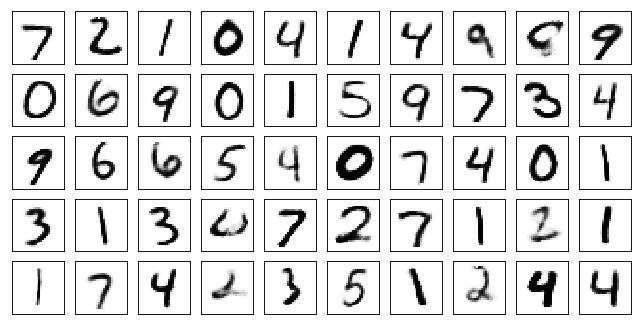

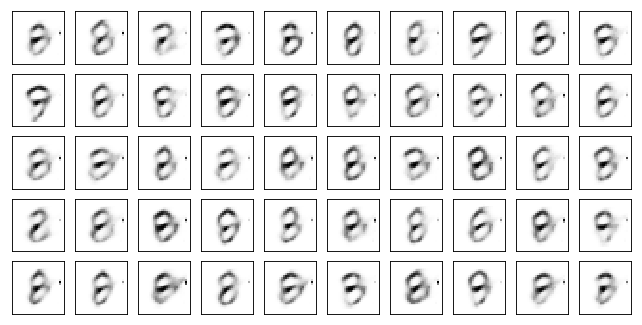

Test losses: AAE10: 0.1019
Train Epoch: 116 [0/50000 (0%)]	Losses AAE10: 0.1105
Train Epoch: 116 [10000/50000 (20%)]	Losses AAE10: 0.1203
Train Epoch: 116 [20000/50000 (40%)]	Losses AAE10: 0.1064
Train Epoch: 116 [30000/50000 (60%)]	Losses AAE10: 0.1053
Train Epoch: 116 [40000/50000 (80%)]	Losses AAE10: 0.1124
Train Epoch: 116 [50000/50000 (100%)]	Losses AAE10: 0.1083


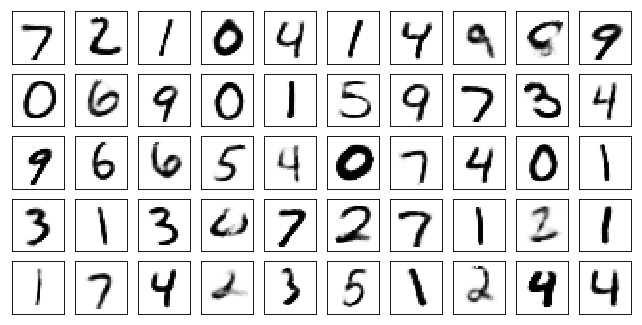

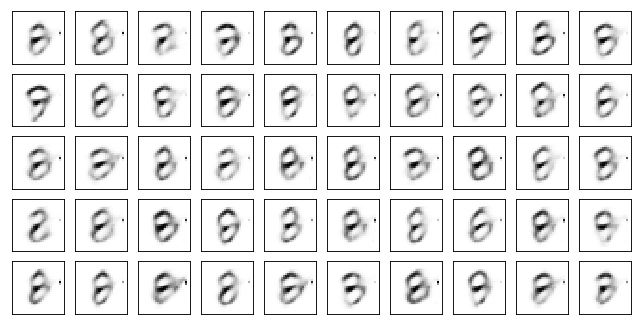

Test losses: AAE10: 0.1019
Train Epoch: 117 [0/50000 (0%)]	Losses AAE10: 0.1068
Train Epoch: 117 [10000/50000 (20%)]	Losses AAE10: 0.1138
Train Epoch: 117 [20000/50000 (40%)]	Losses AAE10: 0.1190
Train Epoch: 117 [30000/50000 (60%)]	Losses AAE10: 0.1152
Train Epoch: 117 [40000/50000 (80%)]	Losses AAE10: 0.1077
Train Epoch: 117 [50000/50000 (100%)]	Losses AAE10: 0.1111


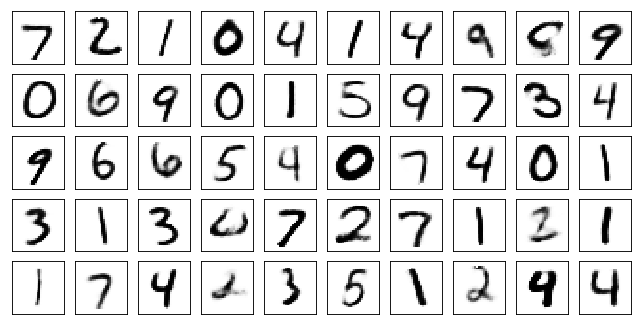

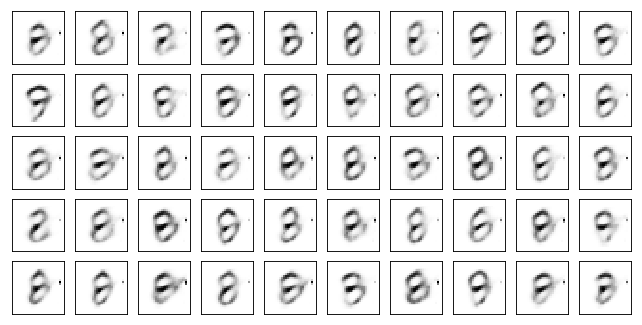

Test losses: AAE10: 0.1017
Train Epoch: 118 [0/50000 (0%)]	Losses AAE10: 0.1061
Train Epoch: 118 [10000/50000 (20%)]	Losses AAE10: 0.1100
Train Epoch: 118 [20000/50000 (40%)]	Losses AAE10: 0.1063
Train Epoch: 118 [30000/50000 (60%)]	Losses AAE10: 0.1151
Train Epoch: 118 [40000/50000 (80%)]	Losses AAE10: 0.1110
Train Epoch: 118 [50000/50000 (100%)]	Losses AAE10: 0.1118


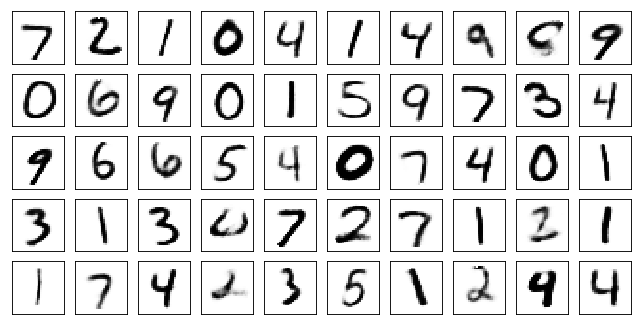

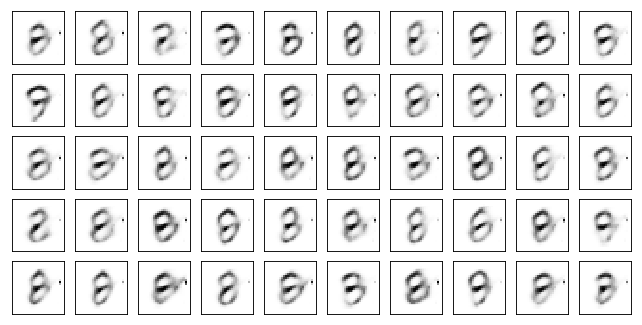

Test losses: AAE10: 0.1018
Train Epoch: 119 [0/50000 (0%)]	Losses AAE10: 0.1110
Train Epoch: 119 [10000/50000 (20%)]	Losses AAE10: 0.1146
Train Epoch: 119 [20000/50000 (40%)]	Losses AAE10: 0.1099
Train Epoch: 119 [30000/50000 (60%)]	Losses AAE10: 0.1142
Train Epoch: 119 [40000/50000 (80%)]	Losses AAE10: 0.1056
Train Epoch: 119 [50000/50000 (100%)]	Losses AAE10: 0.1106


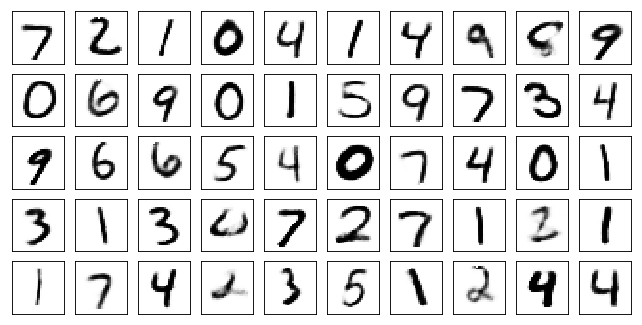

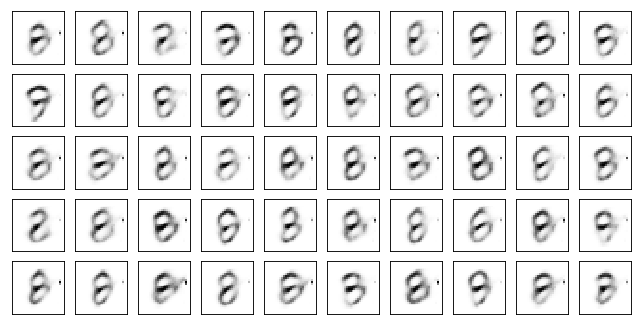

Test losses: AAE10: 0.1017
Train Epoch: 120 [0/50000 (0%)]	Losses AAE10: 0.1154
Train Epoch: 120 [10000/50000 (20%)]	Losses AAE10: 0.1192
Train Epoch: 120 [20000/50000 (40%)]	Losses AAE10: 0.1129
Train Epoch: 120 [30000/50000 (60%)]	Losses AAE10: 0.1117
Train Epoch: 120 [40000/50000 (80%)]	Losses AAE10: 0.1139
Train Epoch: 120 [50000/50000 (100%)]	Losses AAE10: 0.1083


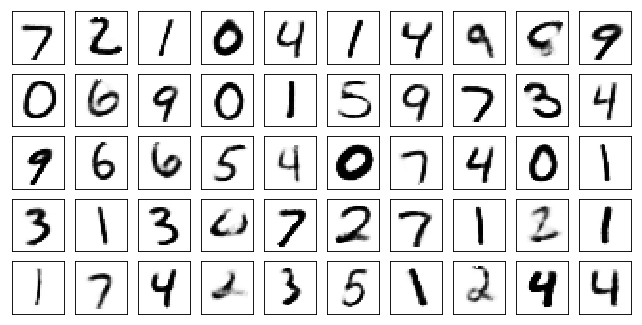

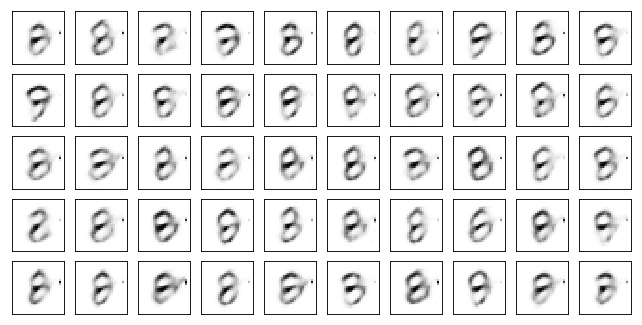

Test losses: AAE10: 0.1018
Train Epoch: 121 [0/50000 (0%)]	Losses AAE10: 0.1171
Train Epoch: 121 [10000/50000 (20%)]	Losses AAE10: 0.1130
Train Epoch: 121 [20000/50000 (40%)]	Losses AAE10: 0.1072
Train Epoch: 121 [30000/50000 (60%)]	Losses AAE10: 0.1102
Train Epoch: 121 [40000/50000 (80%)]	Losses AAE10: 0.1167
Train Epoch: 121 [50000/50000 (100%)]	Losses AAE10: 0.1072


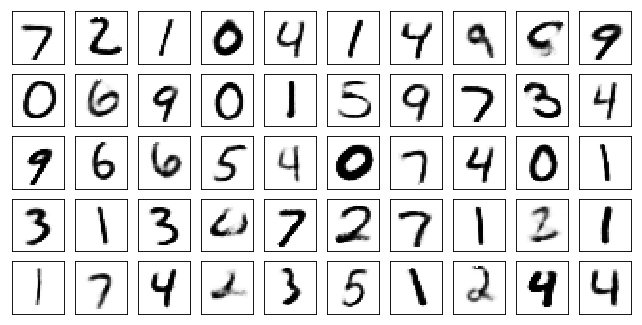

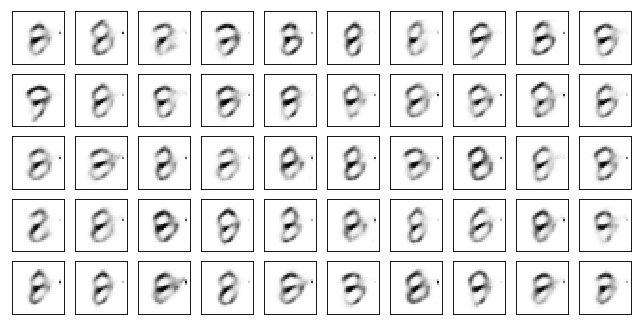

Test losses: AAE10: 0.1015
Train Epoch: 122 [0/50000 (0%)]	Losses AAE10: 0.1071
Train Epoch: 122 [10000/50000 (20%)]	Losses AAE10: 0.1109
Train Epoch: 122 [20000/50000 (40%)]	Losses AAE10: 0.1102
Train Epoch: 122 [30000/50000 (60%)]	Losses AAE10: 0.1083
Train Epoch: 122 [40000/50000 (80%)]	Losses AAE10: 0.1066
Train Epoch: 122 [50000/50000 (100%)]	Losses AAE10: 0.1115


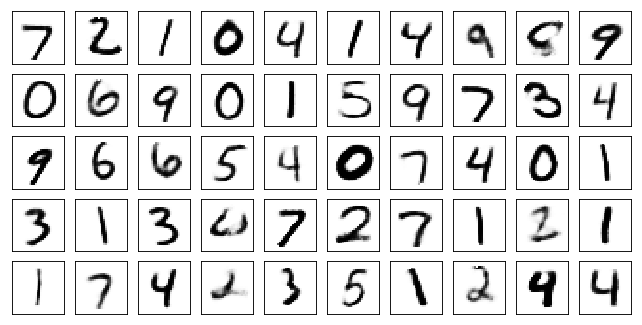

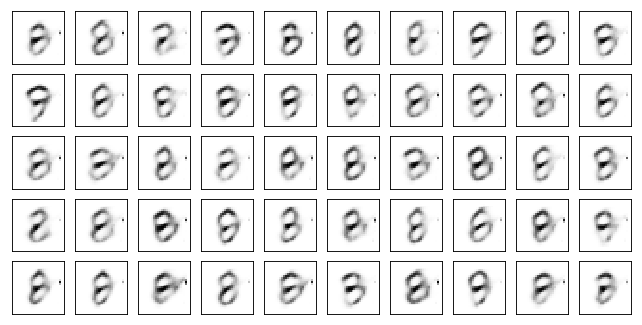

Test losses: AAE10: 0.1016
Train Epoch: 123 [0/50000 (0%)]	Losses AAE10: 0.1069
Train Epoch: 123 [10000/50000 (20%)]	Losses AAE10: 0.1137
Train Epoch: 123 [20000/50000 (40%)]	Losses AAE10: 0.1123
Train Epoch: 123 [30000/50000 (60%)]	Losses AAE10: 0.1118
Train Epoch: 123 [40000/50000 (80%)]	Losses AAE10: 0.1111
Train Epoch: 123 [50000/50000 (100%)]	Losses AAE10: 0.1133


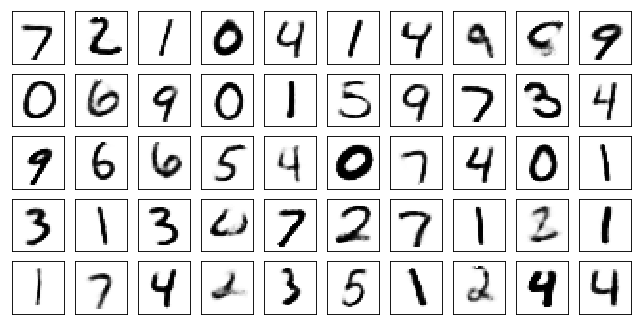

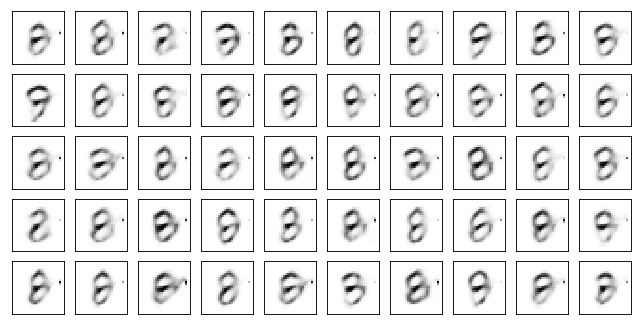

Test losses: AAE10: 0.1015
Train Epoch: 124 [0/50000 (0%)]	Losses AAE10: 0.1089
Train Epoch: 124 [10000/50000 (20%)]	Losses AAE10: 0.1105
Train Epoch: 124 [20000/50000 (40%)]	Losses AAE10: 0.1199
Train Epoch: 124 [30000/50000 (60%)]	Losses AAE10: 0.1133
Train Epoch: 124 [40000/50000 (80%)]	Losses AAE10: 0.1084
Train Epoch: 124 [50000/50000 (100%)]	Losses AAE10: 0.1085


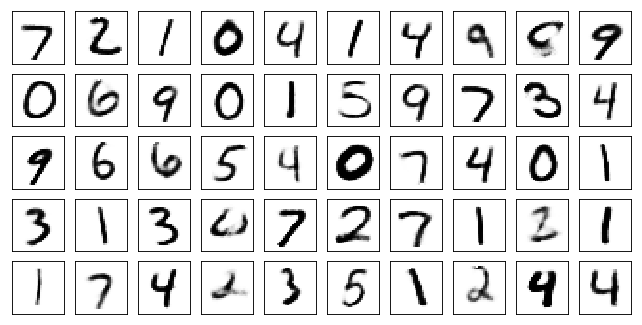

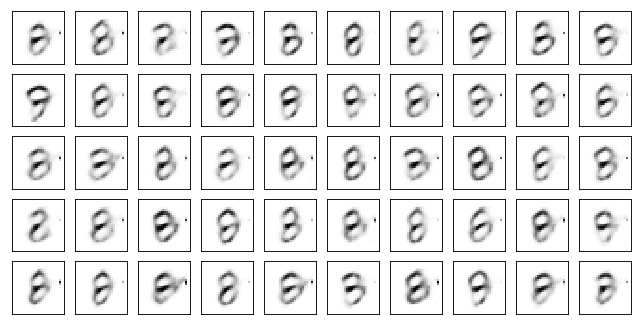

Test losses: AAE10: 0.1015
Train Epoch: 125 [0/50000 (0%)]	Losses AAE10: 0.1149
Train Epoch: 125 [10000/50000 (20%)]	Losses AAE10: 0.1130
Train Epoch: 125 [20000/50000 (40%)]	Losses AAE10: 0.1106
Train Epoch: 125 [30000/50000 (60%)]	Losses AAE10: 0.1158
Train Epoch: 125 [40000/50000 (80%)]	Losses AAE10: 0.1128
Train Epoch: 125 [50000/50000 (100%)]	Losses AAE10: 0.1091


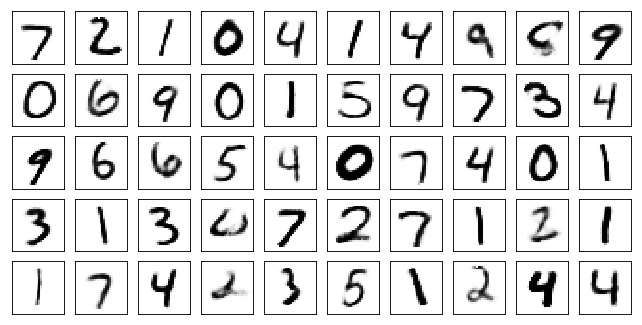

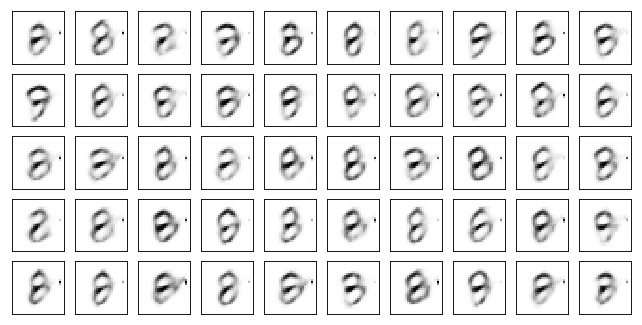

Test losses: AAE10: 0.1017
Train Epoch: 126 [0/50000 (0%)]	Losses AAE10: 0.1119
Train Epoch: 126 [10000/50000 (20%)]	Losses AAE10: 0.1109
Train Epoch: 126 [20000/50000 (40%)]	Losses AAE10: 0.1085
Train Epoch: 126 [30000/50000 (60%)]	Losses AAE10: 0.1102
Train Epoch: 126 [40000/50000 (80%)]	Losses AAE10: 0.1130
Train Epoch: 126 [50000/50000 (100%)]	Losses AAE10: 0.1021


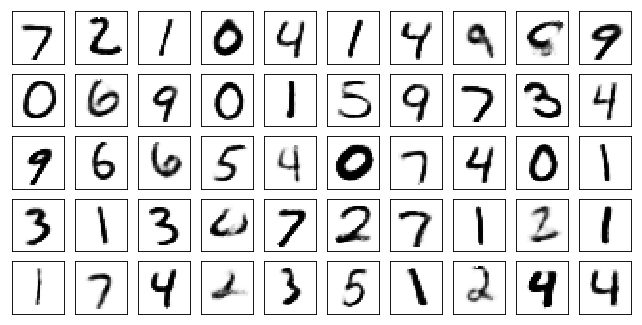

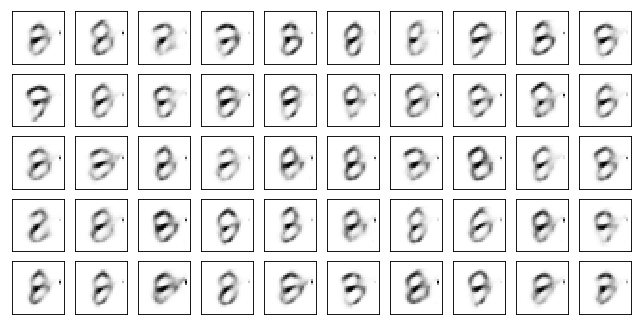

Test losses: AAE10: 0.1015
Train Epoch: 127 [0/50000 (0%)]	Losses AAE10: 0.1193
Train Epoch: 127 [10000/50000 (20%)]	Losses AAE10: 0.1148
Train Epoch: 127 [20000/50000 (40%)]	Losses AAE10: 0.1175
Train Epoch: 127 [30000/50000 (60%)]	Losses AAE10: 0.1081
Train Epoch: 127 [40000/50000 (80%)]	Losses AAE10: 0.1160
Train Epoch: 127 [50000/50000 (100%)]	Losses AAE10: 0.1240


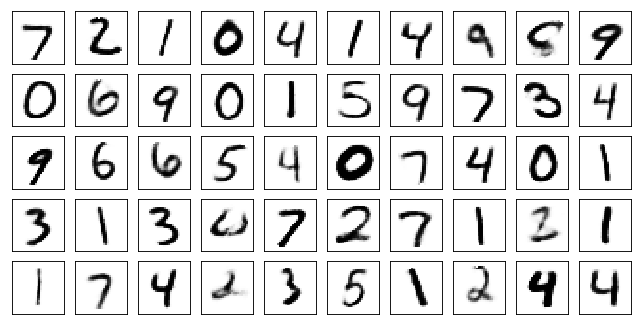

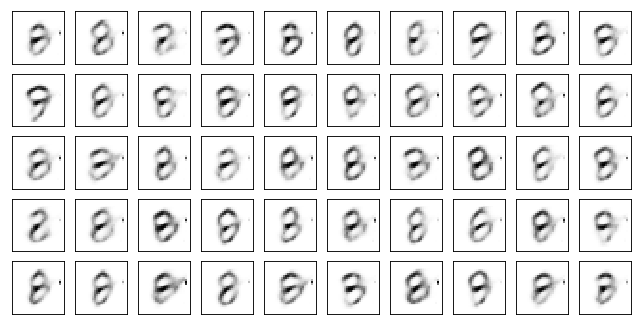

Test losses: AAE10: 0.1015
Train Epoch: 128 [0/50000 (0%)]	Losses AAE10: 0.1064
Train Epoch: 128 [10000/50000 (20%)]	Losses AAE10: 0.1098
Train Epoch: 128 [20000/50000 (40%)]	Losses AAE10: 0.1091
Train Epoch: 128 [30000/50000 (60%)]	Losses AAE10: 0.1054
Train Epoch: 128 [40000/50000 (80%)]	Losses AAE10: 0.1174
Train Epoch: 128 [50000/50000 (100%)]	Losses AAE10: 0.1114


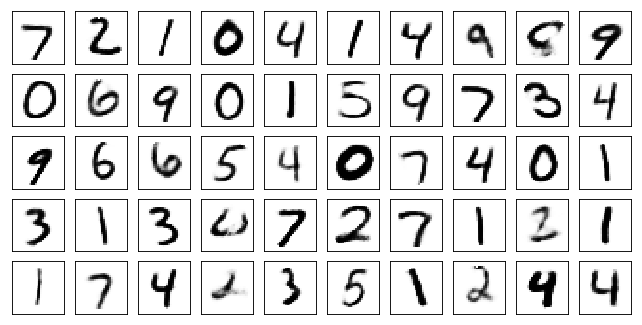

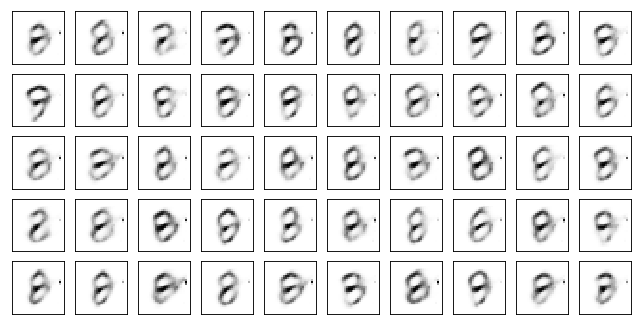

Test losses: AAE10: 0.1014
Train Epoch: 129 [0/50000 (0%)]	Losses AAE10: 0.1065
Train Epoch: 129 [10000/50000 (20%)]	Losses AAE10: 0.1154
Train Epoch: 129 [20000/50000 (40%)]	Losses AAE10: 0.1100
Train Epoch: 129 [30000/50000 (60%)]	Losses AAE10: 0.1074
Train Epoch: 129 [40000/50000 (80%)]	Losses AAE10: 0.1138
Train Epoch: 129 [50000/50000 (100%)]	Losses AAE10: 0.1164


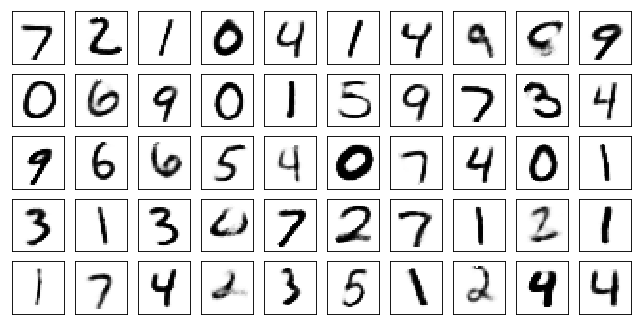

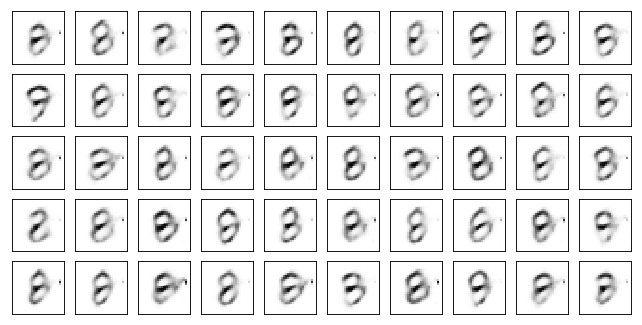

Test losses: AAE10: 0.1015
Train Epoch: 130 [0/50000 (0%)]	Losses AAE10: 0.1058
Train Epoch: 130 [10000/50000 (20%)]	Losses AAE10: 0.1144
Train Epoch: 130 [20000/50000 (40%)]	Losses AAE10: 0.1145
Train Epoch: 130 [30000/50000 (60%)]	Losses AAE10: 0.1101
Train Epoch: 130 [40000/50000 (80%)]	Losses AAE10: 0.1158
Train Epoch: 130 [50000/50000 (100%)]	Losses AAE10: 0.1233


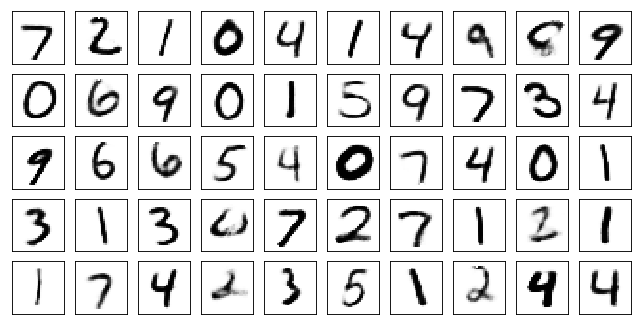

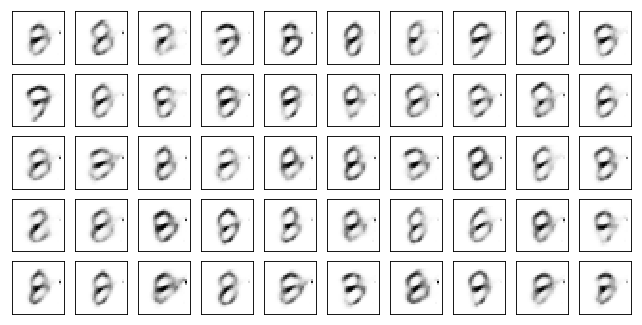

Test losses: AAE10: 0.1013
Train Epoch: 131 [0/50000 (0%)]	Losses AAE10: 0.1130
Train Epoch: 131 [10000/50000 (20%)]	Losses AAE10: 0.1075
Train Epoch: 131 [20000/50000 (40%)]	Losses AAE10: 0.1066
Train Epoch: 131 [30000/50000 (60%)]	Losses AAE10: 0.1102
Train Epoch: 131 [40000/50000 (80%)]	Losses AAE10: 0.1168
Train Epoch: 131 [50000/50000 (100%)]	Losses AAE10: 0.1055


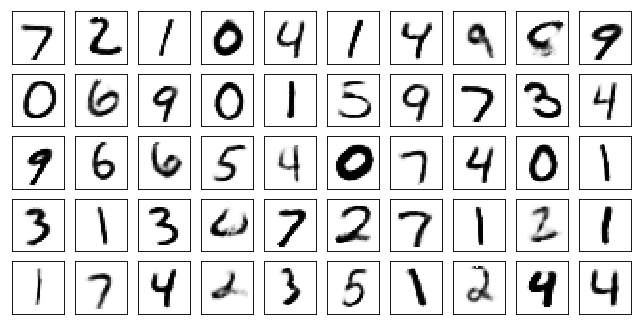

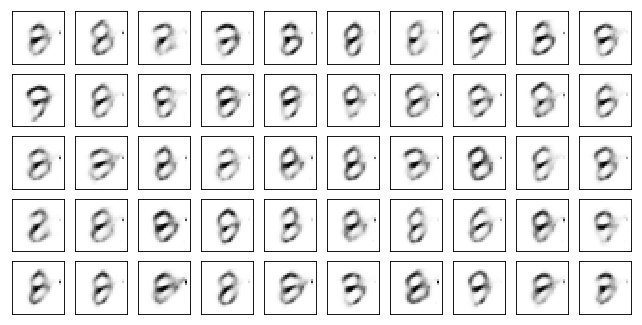

Test losses: AAE10: 0.1014
Train Epoch: 132 [0/50000 (0%)]	Losses AAE10: 0.1117
Train Epoch: 132 [10000/50000 (20%)]	Losses AAE10: 0.1159
Train Epoch: 132 [20000/50000 (40%)]	Losses AAE10: 0.1078
Train Epoch: 132 [30000/50000 (60%)]	Losses AAE10: 0.1159
Train Epoch: 132 [40000/50000 (80%)]	Losses AAE10: 0.1182
Train Epoch: 132 [50000/50000 (100%)]	Losses AAE10: 0.1127


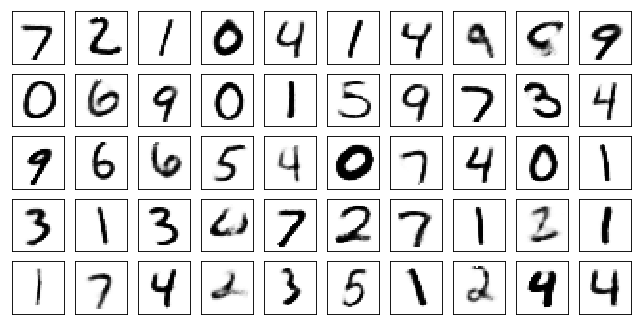

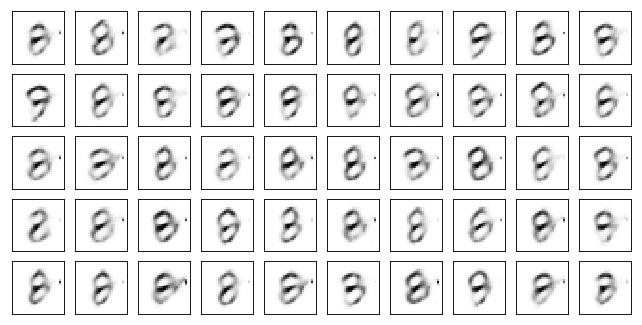

Test losses: AAE10: 0.1013
Train Epoch: 133 [0/50000 (0%)]	Losses AAE10: 0.1089
Train Epoch: 133 [10000/50000 (20%)]	Losses AAE10: 0.1091
Train Epoch: 133 [20000/50000 (40%)]	Losses AAE10: 0.1099
Train Epoch: 133 [30000/50000 (60%)]	Losses AAE10: 0.1158
Train Epoch: 133 [40000/50000 (80%)]	Losses AAE10: 0.1088
Train Epoch: 133 [50000/50000 (100%)]	Losses AAE10: 0.1072


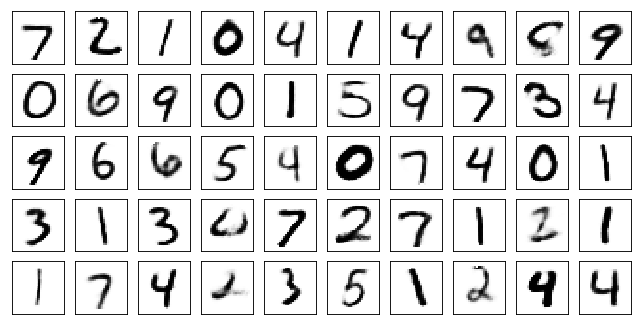

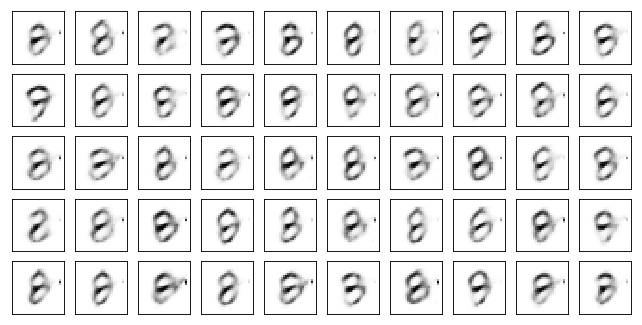

Test losses: AAE10: 0.1015
Train Epoch: 134 [0/50000 (0%)]	Losses AAE10: 0.1175
Train Epoch: 134 [10000/50000 (20%)]	Losses AAE10: 0.1126
Train Epoch: 134 [20000/50000 (40%)]	Losses AAE10: 0.1133
Train Epoch: 134 [30000/50000 (60%)]	Losses AAE10: 0.1104
Train Epoch: 134 [40000/50000 (80%)]	Losses AAE10: 0.1011
Train Epoch: 134 [50000/50000 (100%)]	Losses AAE10: 0.1128


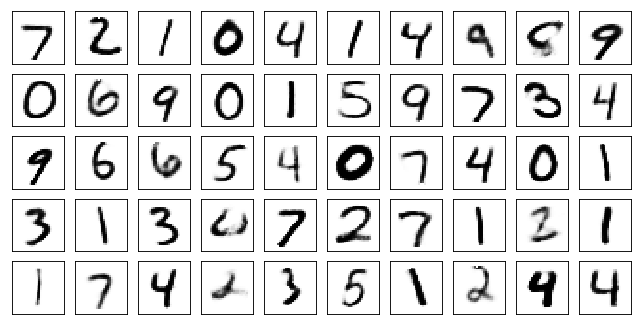

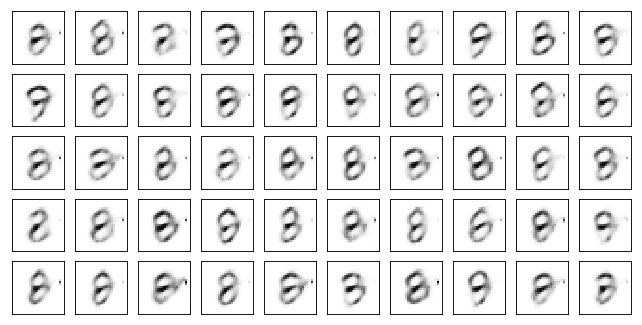

Test losses: AAE10: 0.1012
Train Epoch: 135 [0/50000 (0%)]	Losses AAE10: 0.1177
Train Epoch: 135 [10000/50000 (20%)]	Losses AAE10: 0.1141
Train Epoch: 135 [20000/50000 (40%)]	Losses AAE10: 0.1142
Train Epoch: 135 [30000/50000 (60%)]	Losses AAE10: 0.1141
Train Epoch: 135 [40000/50000 (80%)]	Losses AAE10: 0.1117
Train Epoch: 135 [50000/50000 (100%)]	Losses AAE10: 0.1087


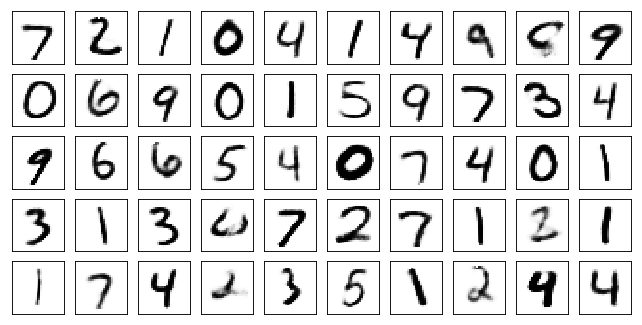

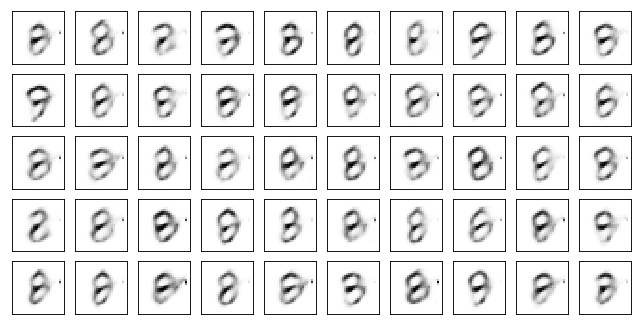

Test losses: AAE10: 0.1012
Train Epoch: 136 [0/50000 (0%)]	Losses AAE10: 0.1033
Train Epoch: 136 [10000/50000 (20%)]	Losses AAE10: 0.1119
Train Epoch: 136 [20000/50000 (40%)]	Losses AAE10: 0.1175
Train Epoch: 136 [30000/50000 (60%)]	Losses AAE10: 0.1136
Train Epoch: 136 [40000/50000 (80%)]	Losses AAE10: 0.1095
Train Epoch: 136 [50000/50000 (100%)]	Losses AAE10: 0.1030


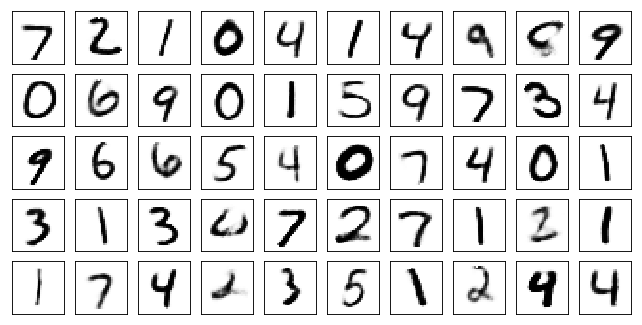

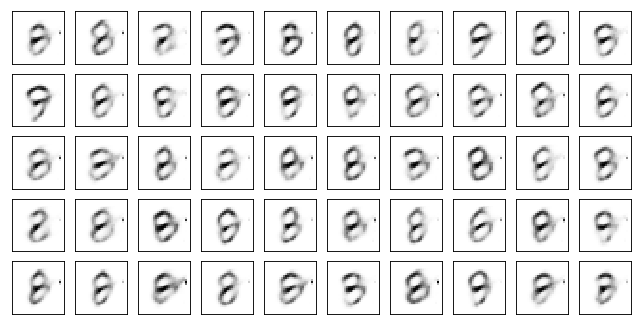

Test losses: AAE10: 0.1013
Train Epoch: 137 [0/50000 (0%)]	Losses AAE10: 0.1081
Train Epoch: 137 [10000/50000 (20%)]	Losses AAE10: 0.1050
Train Epoch: 137 [20000/50000 (40%)]	Losses AAE10: 0.1148
Train Epoch: 137 [30000/50000 (60%)]	Losses AAE10: 0.1103
Train Epoch: 137 [40000/50000 (80%)]	Losses AAE10: 0.1146
Train Epoch: 137 [50000/50000 (100%)]	Losses AAE10: 0.1074


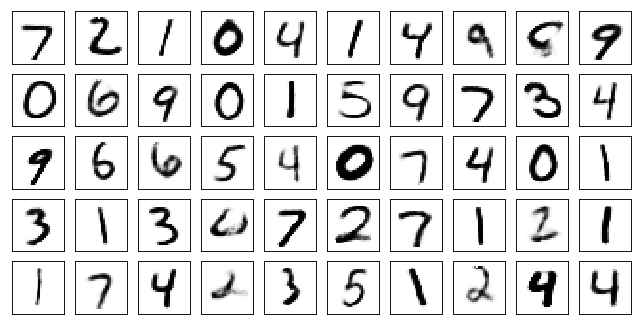

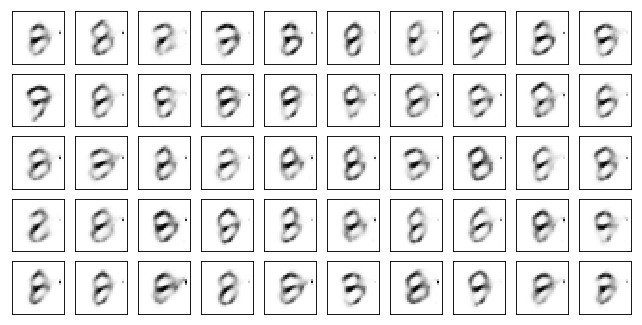

Test losses: AAE10: 0.1013
Train Epoch: 138 [0/50000 (0%)]	Losses AAE10: 0.1043
Train Epoch: 138 [10000/50000 (20%)]	Losses AAE10: 0.1106
Train Epoch: 138 [20000/50000 (40%)]	Losses AAE10: 0.1036
Train Epoch: 138 [30000/50000 (60%)]	Losses AAE10: 0.1103
Train Epoch: 138 [40000/50000 (80%)]	Losses AAE10: 0.1082
Train Epoch: 138 [50000/50000 (100%)]	Losses AAE10: 0.1084


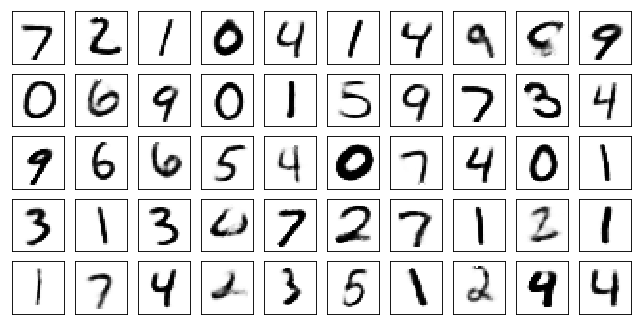

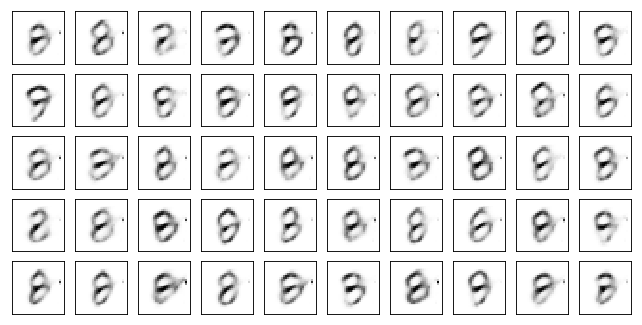

Test losses: AAE10: 0.1013
Train Epoch: 139 [0/50000 (0%)]	Losses AAE10: 0.1129
Train Epoch: 139 [10000/50000 (20%)]	Losses AAE10: 0.1095
Train Epoch: 139 [20000/50000 (40%)]	Losses AAE10: 0.1080
Train Epoch: 139 [30000/50000 (60%)]	Losses AAE10: 0.1046
Train Epoch: 139 [40000/50000 (80%)]	Losses AAE10: 0.1169
Train Epoch: 139 [50000/50000 (100%)]	Losses AAE10: 0.1098


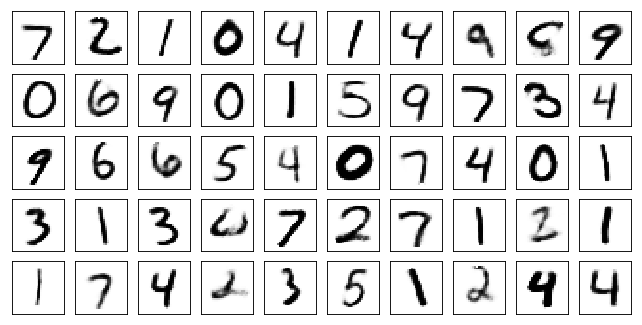

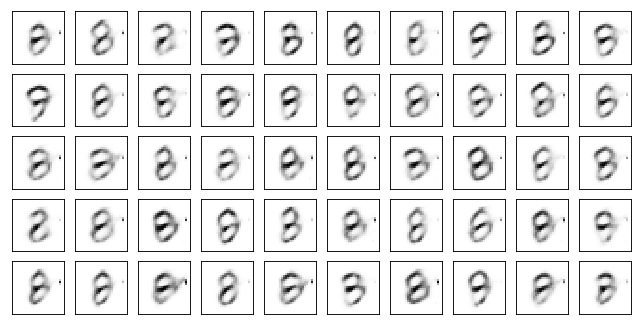

Test losses: AAE10: 0.1012
Train Epoch: 140 [0/50000 (0%)]	Losses AAE10: 0.1082
Train Epoch: 140 [10000/50000 (20%)]	Losses AAE10: 0.1094
Train Epoch: 140 [20000/50000 (40%)]	Losses AAE10: 0.1096
Train Epoch: 140 [30000/50000 (60%)]	Losses AAE10: 0.1206
Train Epoch: 140 [40000/50000 (80%)]	Losses AAE10: 0.1063
Train Epoch: 140 [50000/50000 (100%)]	Losses AAE10: 0.1121


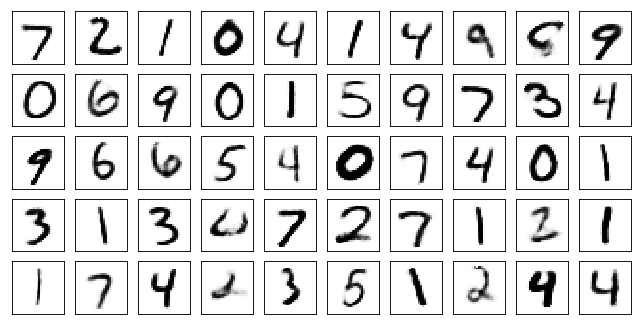

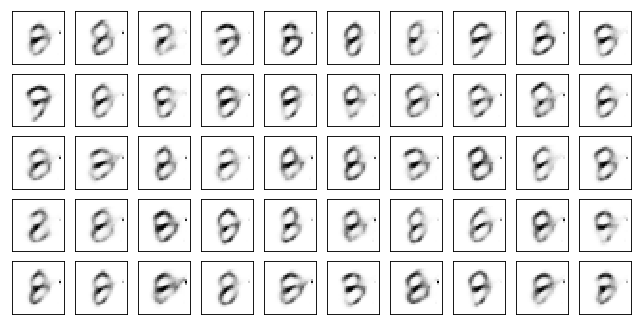

Test losses: AAE10: 0.1011
Train Epoch: 141 [0/50000 (0%)]	Losses AAE10: 0.1115
Train Epoch: 141 [10000/50000 (20%)]	Losses AAE10: 0.1147
Train Epoch: 141 [20000/50000 (40%)]	Losses AAE10: 0.1100
Train Epoch: 141 [30000/50000 (60%)]	Losses AAE10: 0.1163
Train Epoch: 141 [40000/50000 (80%)]	Losses AAE10: 0.1048
Train Epoch: 141 [50000/50000 (100%)]	Losses AAE10: 0.1120


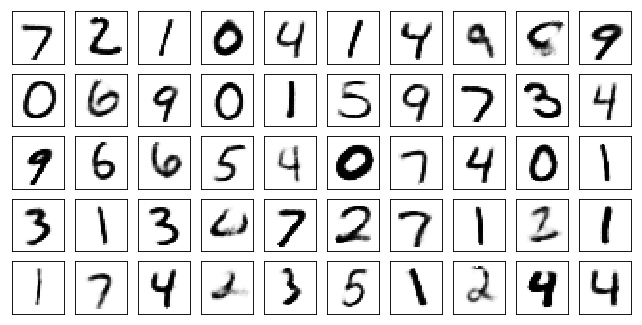

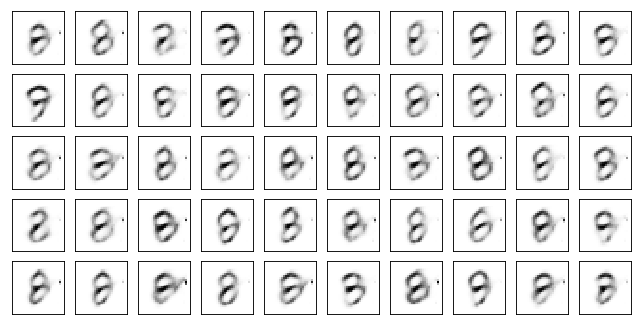

Test losses: AAE10: 0.1012
Train Epoch: 142 [0/50000 (0%)]	Losses AAE10: 0.1098
Train Epoch: 142 [10000/50000 (20%)]	Losses AAE10: 0.1120
Train Epoch: 142 [20000/50000 (40%)]	Losses AAE10: 0.1061
Train Epoch: 142 [30000/50000 (60%)]	Losses AAE10: 0.1088
Train Epoch: 142 [40000/50000 (80%)]	Losses AAE10: 0.1091
Train Epoch: 142 [50000/50000 (100%)]	Losses AAE10: 0.1188


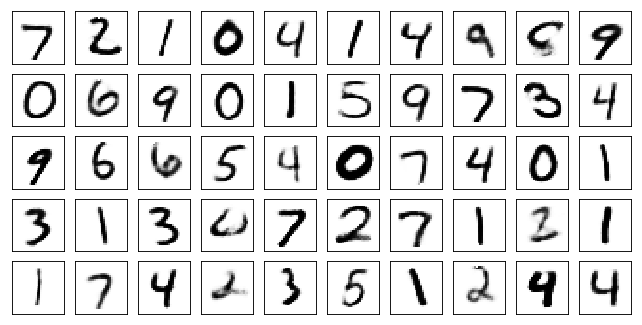

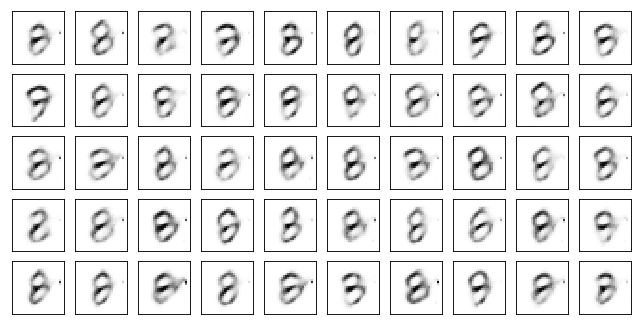

Test losses: AAE10: 0.1012
Train Epoch: 143 [0/50000 (0%)]	Losses AAE10: 0.1152
Train Epoch: 143 [10000/50000 (20%)]	Losses AAE10: 0.1116
Train Epoch: 143 [20000/50000 (40%)]	Losses AAE10: 0.1171
Train Epoch: 143 [30000/50000 (60%)]	Losses AAE10: 0.1118
Train Epoch: 143 [40000/50000 (80%)]	Losses AAE10: 0.1126
Train Epoch: 143 [50000/50000 (100%)]	Losses AAE10: 0.1090


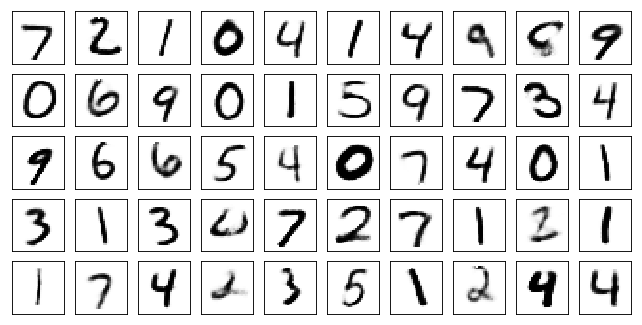

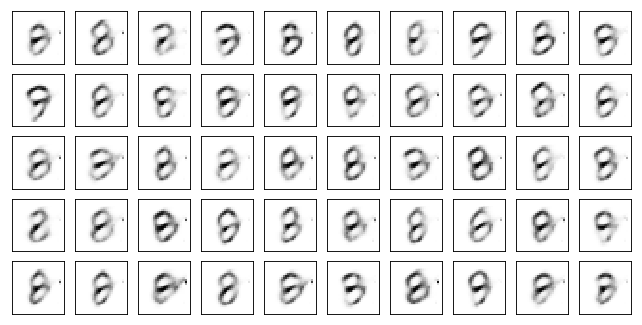

Test losses: AAE10: 0.1010
Train Epoch: 144 [0/50000 (0%)]	Losses AAE10: 0.1074
Train Epoch: 144 [10000/50000 (20%)]	Losses AAE10: 0.1086
Train Epoch: 144 [20000/50000 (40%)]	Losses AAE10: 0.1082
Train Epoch: 144 [30000/50000 (60%)]	Losses AAE10: 0.1133
Train Epoch: 144 [40000/50000 (80%)]	Losses AAE10: 0.1103
Train Epoch: 144 [50000/50000 (100%)]	Losses AAE10: 0.1119


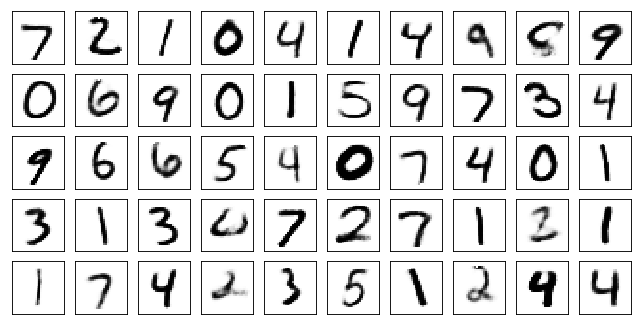

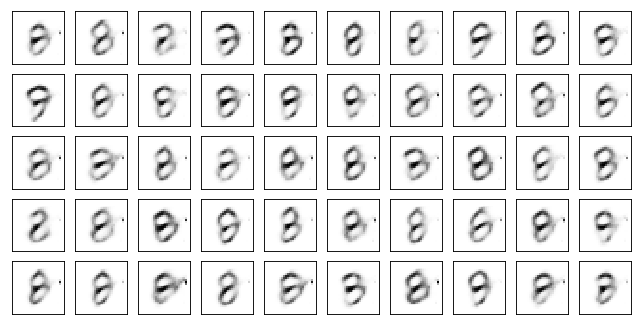

Test losses: AAE10: 0.1010
Train Epoch: 145 [0/50000 (0%)]	Losses AAE10: 0.1140
Train Epoch: 145 [10000/50000 (20%)]	Losses AAE10: 0.1086
Train Epoch: 145 [20000/50000 (40%)]	Losses AAE10: 0.1124
Train Epoch: 145 [30000/50000 (60%)]	Losses AAE10: 0.1100
Train Epoch: 145 [40000/50000 (80%)]	Losses AAE10: 0.1079
Train Epoch: 145 [50000/50000 (100%)]	Losses AAE10: 0.1054


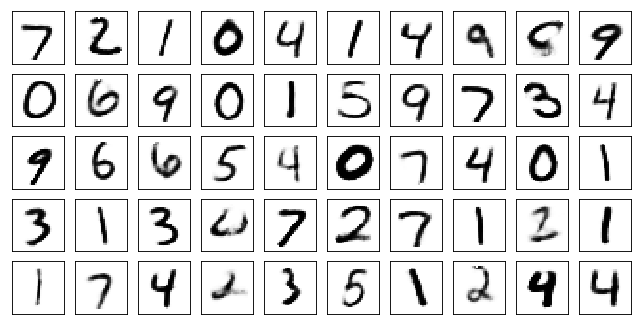

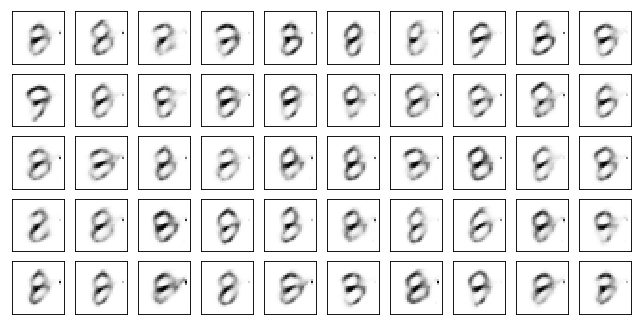

Test losses: AAE10: 0.1010
Train Epoch: 146 [0/50000 (0%)]	Losses AAE10: 0.1098
Train Epoch: 146 [10000/50000 (20%)]	Losses AAE10: 0.0992
Train Epoch: 146 [20000/50000 (40%)]	Losses AAE10: 0.1093
Train Epoch: 146 [30000/50000 (60%)]	Losses AAE10: 0.1113
Train Epoch: 146 [40000/50000 (80%)]	Losses AAE10: 0.1145
Train Epoch: 146 [50000/50000 (100%)]	Losses AAE10: 0.1167


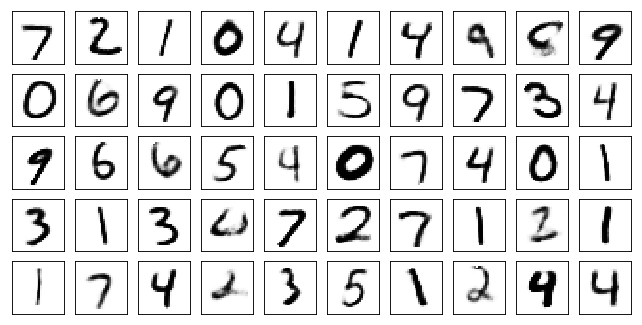

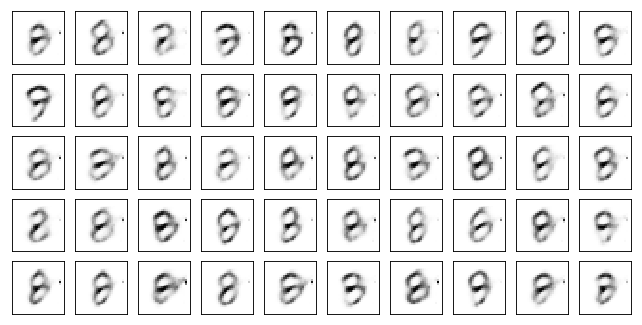

Test losses: AAE10: 0.1011
Train Epoch: 147 [0/50000 (0%)]	Losses AAE10: 0.1028
Train Epoch: 147 [10000/50000 (20%)]	Losses AAE10: 0.1099
Train Epoch: 147 [20000/50000 (40%)]	Losses AAE10: 0.1085
Train Epoch: 147 [30000/50000 (60%)]	Losses AAE10: 0.1193
Train Epoch: 147 [40000/50000 (80%)]	Losses AAE10: 0.1146
Train Epoch: 147 [50000/50000 (100%)]	Losses AAE10: 0.1131


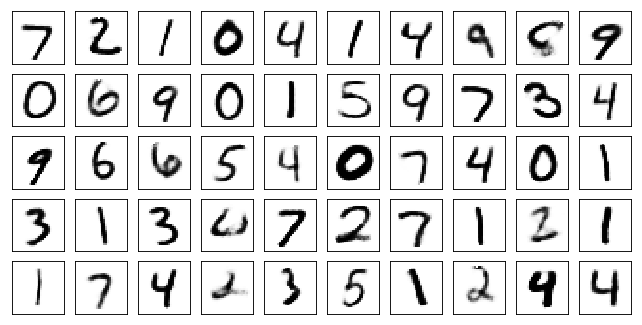

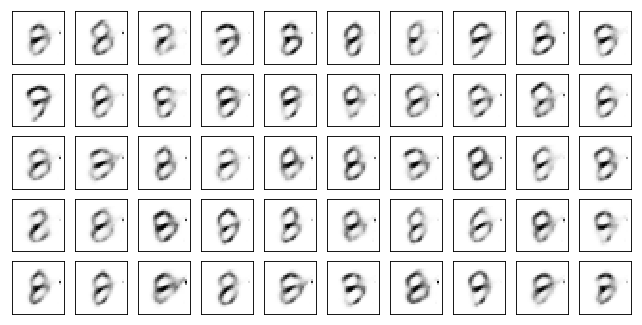

Test losses: AAE10: 0.1010
Train Epoch: 148 [0/50000 (0%)]	Losses AAE10: 0.1142
Train Epoch: 148 [10000/50000 (20%)]	Losses AAE10: 0.1109
Train Epoch: 148 [20000/50000 (40%)]	Losses AAE10: 0.1071
Train Epoch: 148 [30000/50000 (60%)]	Losses AAE10: 0.1166
Train Epoch: 148 [40000/50000 (80%)]	Losses AAE10: 0.1072
Train Epoch: 148 [50000/50000 (100%)]	Losses AAE10: 0.1096


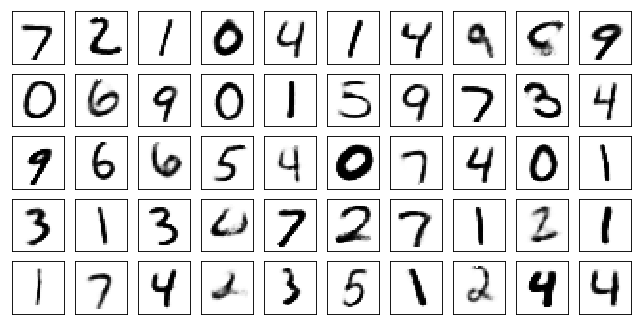

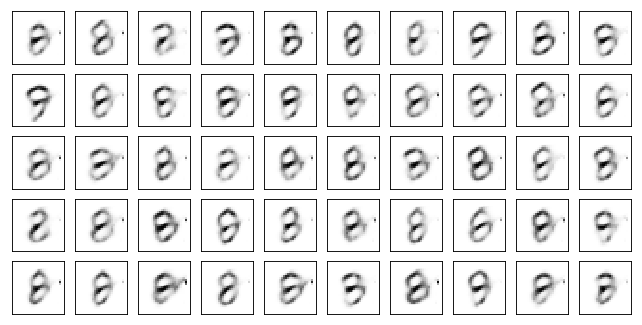

Test losses: AAE10: 0.1010
Train Epoch: 149 [0/50000 (0%)]	Losses AAE10: 0.1173
Train Epoch: 149 [10000/50000 (20%)]	Losses AAE10: 0.1105
Train Epoch: 149 [20000/50000 (40%)]	Losses AAE10: 0.1142
Train Epoch: 149 [30000/50000 (60%)]	Losses AAE10: 0.1167
Train Epoch: 149 [40000/50000 (80%)]	Losses AAE10: 0.1142
Train Epoch: 149 [50000/50000 (100%)]	Losses AAE10: 0.1092


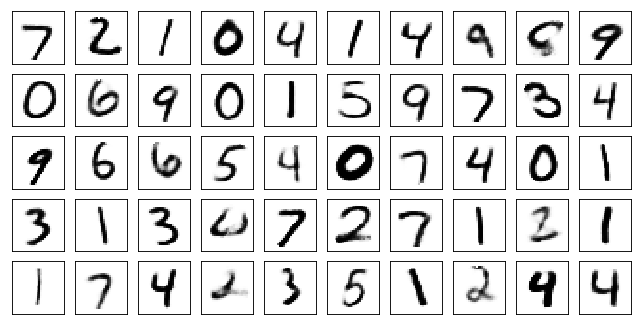

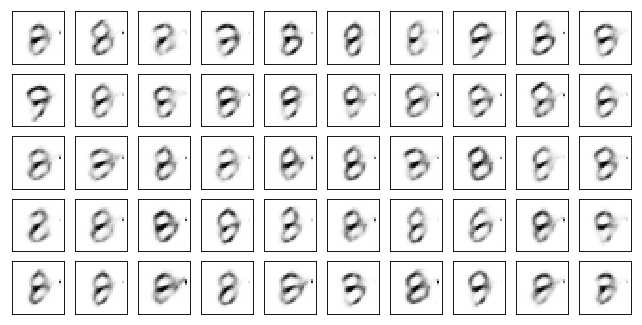

Test losses: AAE10: 0.1011
Train Epoch: 150 [0/50000 (0%)]	Losses AAE10: 0.1125
Train Epoch: 150 [10000/50000 (20%)]	Losses AAE10: 0.1047
Train Epoch: 150 [20000/50000 (40%)]	Losses AAE10: 0.1064
Train Epoch: 150 [30000/50000 (60%)]	Losses AAE10: 0.1030
Train Epoch: 150 [40000/50000 (80%)]	Losses AAE10: 0.1154
Train Epoch: 150 [50000/50000 (100%)]	Losses AAE10: 0.1145


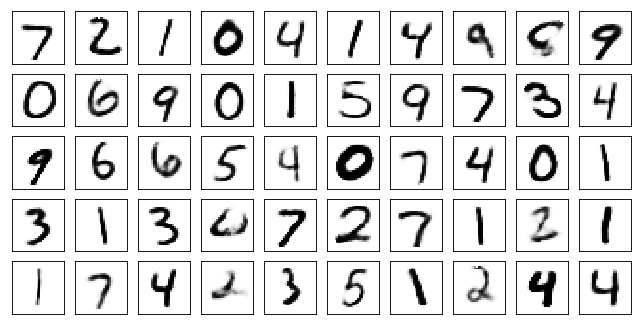

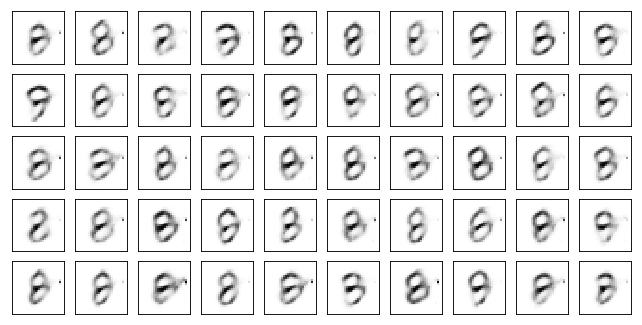

Test losses: AAE10: 0.1009
Train Epoch: 151 [0/50000 (0%)]	Losses AAE10: 0.1141
Train Epoch: 151 [10000/50000 (20%)]	Losses AAE10: 0.1036
Train Epoch: 151 [20000/50000 (40%)]	Losses AAE10: 0.1124
Train Epoch: 151 [30000/50000 (60%)]	Losses AAE10: 0.1037
Train Epoch: 151 [40000/50000 (80%)]	Losses AAE10: 0.1163
Train Epoch: 151 [50000/50000 (100%)]	Losses AAE10: 0.1151


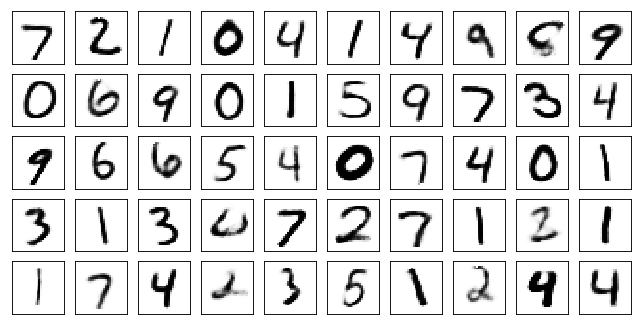

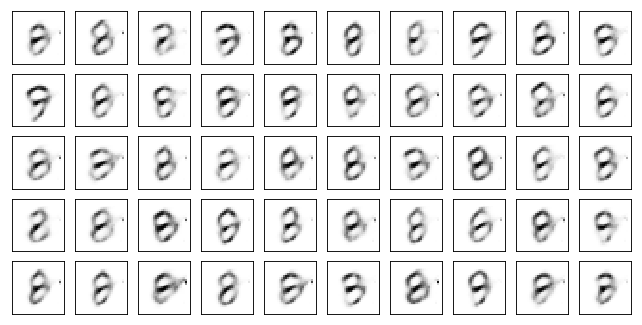

Test losses: AAE10: 0.1008
Train Epoch: 152 [0/50000 (0%)]	Losses AAE10: 0.1057
Train Epoch: 152 [10000/50000 (20%)]	Losses AAE10: 0.1180
Train Epoch: 152 [20000/50000 (40%)]	Losses AAE10: 0.1015
Train Epoch: 152 [30000/50000 (60%)]	Losses AAE10: 0.1051
Train Epoch: 152 [40000/50000 (80%)]	Losses AAE10: 0.1165
Train Epoch: 152 [50000/50000 (100%)]	Losses AAE10: 0.1104


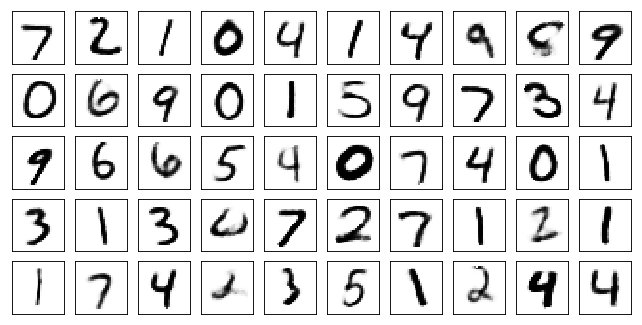

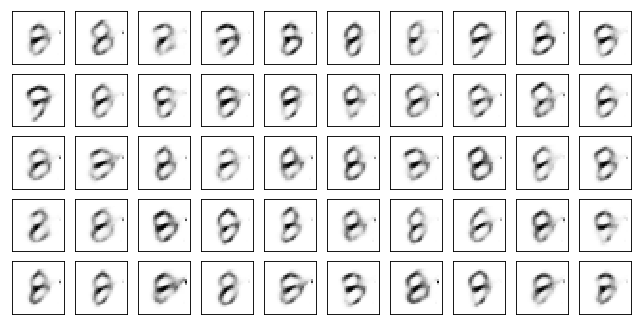

Test losses: AAE10: 0.1011
Train Epoch: 153 [0/50000 (0%)]	Losses AAE10: 0.1080
Train Epoch: 153 [10000/50000 (20%)]	Losses AAE10: 0.1146
Train Epoch: 153 [20000/50000 (40%)]	Losses AAE10: 0.1075
Train Epoch: 153 [30000/50000 (60%)]	Losses AAE10: 0.1110
Train Epoch: 153 [40000/50000 (80%)]	Losses AAE10: 0.1130
Train Epoch: 153 [50000/50000 (100%)]	Losses AAE10: 0.1133


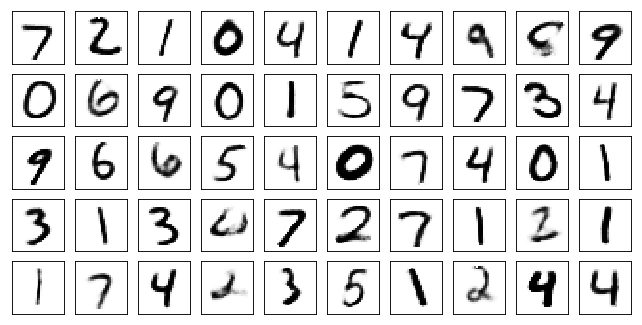

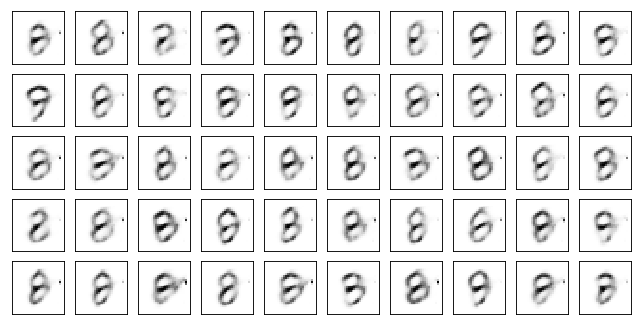

Test losses: AAE10: 0.1008
Train Epoch: 154 [0/50000 (0%)]	Losses AAE10: 0.1088
Train Epoch: 154 [10000/50000 (20%)]	Losses AAE10: 0.1101
Train Epoch: 154 [20000/50000 (40%)]	Losses AAE10: 0.1021
Train Epoch: 154 [30000/50000 (60%)]	Losses AAE10: 0.1134
Train Epoch: 154 [40000/50000 (80%)]	Losses AAE10: 0.1158
Train Epoch: 154 [50000/50000 (100%)]	Losses AAE10: 0.1082


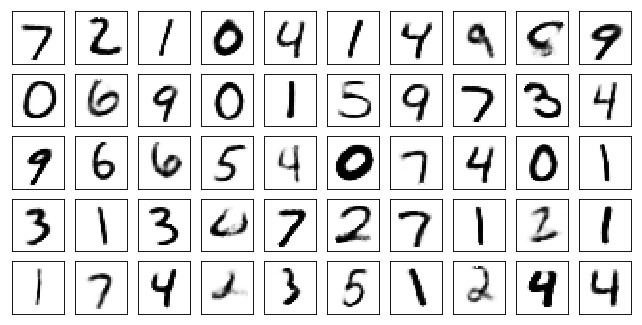

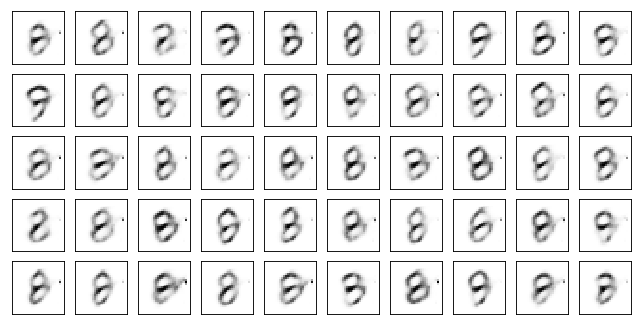

Test losses: AAE10: 0.1007
Train Epoch: 155 [0/50000 (0%)]	Losses AAE10: 0.1059
Train Epoch: 155 [10000/50000 (20%)]	Losses AAE10: 0.1048
Train Epoch: 155 [20000/50000 (40%)]	Losses AAE10: 0.1143
Train Epoch: 155 [30000/50000 (60%)]	Losses AAE10: 0.1162
Train Epoch: 155 [40000/50000 (80%)]	Losses AAE10: 0.1043
Train Epoch: 155 [50000/50000 (100%)]	Losses AAE10: 0.1106


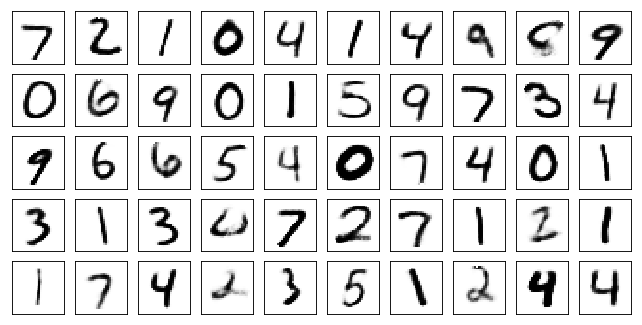

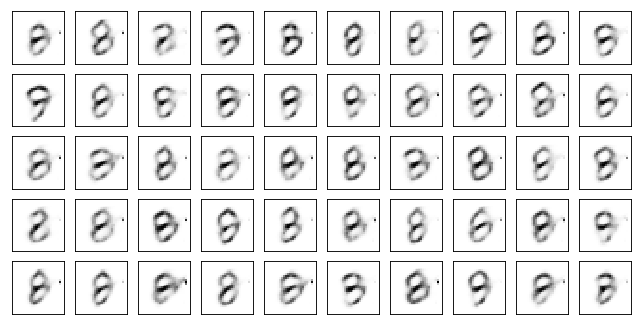

Test losses: AAE10: 0.1007
Train Epoch: 156 [0/50000 (0%)]	Losses AAE10: 0.1068
Train Epoch: 156 [10000/50000 (20%)]	Losses AAE10: 0.1147
Train Epoch: 156 [20000/50000 (40%)]	Losses AAE10: 0.1192
Train Epoch: 156 [30000/50000 (60%)]	Losses AAE10: 0.1129
Train Epoch: 156 [40000/50000 (80%)]	Losses AAE10: 0.1150
Train Epoch: 156 [50000/50000 (100%)]	Losses AAE10: 0.1074


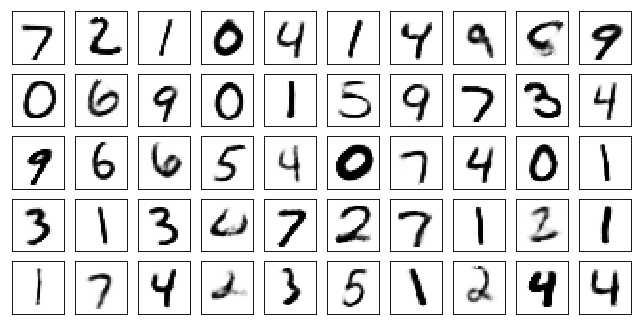

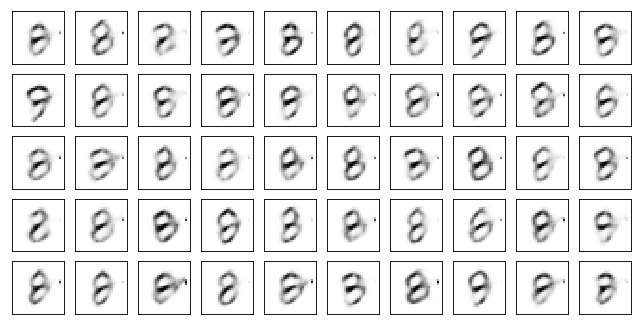

Test losses: AAE10: 0.1007
Train Epoch: 157 [0/50000 (0%)]	Losses AAE10: 0.1091
Train Epoch: 157 [10000/50000 (20%)]	Losses AAE10: 0.1187
Train Epoch: 157 [20000/50000 (40%)]	Losses AAE10: 0.1108
Train Epoch: 157 [30000/50000 (60%)]	Losses AAE10: 0.1086
Train Epoch: 157 [40000/50000 (80%)]	Losses AAE10: 0.1077
Train Epoch: 157 [50000/50000 (100%)]	Losses AAE10: 0.1109


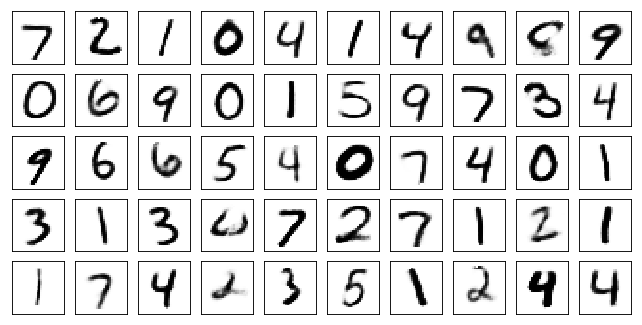

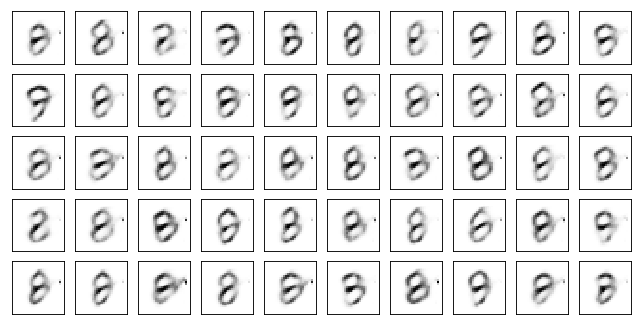

Test losses: AAE10: 0.1007
Train Epoch: 158 [0/50000 (0%)]	Losses AAE10: 0.1038
Train Epoch: 158 [10000/50000 (20%)]	Losses AAE10: 0.1090
Train Epoch: 158 [20000/50000 (40%)]	Losses AAE10: 0.1158
Train Epoch: 158 [30000/50000 (60%)]	Losses AAE10: 0.1159
Train Epoch: 158 [40000/50000 (80%)]	Losses AAE10: 0.1079
Train Epoch: 158 [50000/50000 (100%)]	Losses AAE10: 0.1190


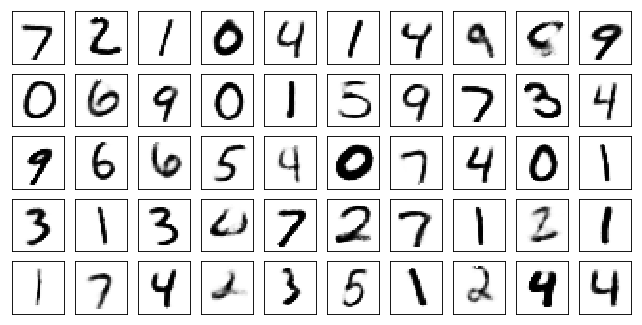

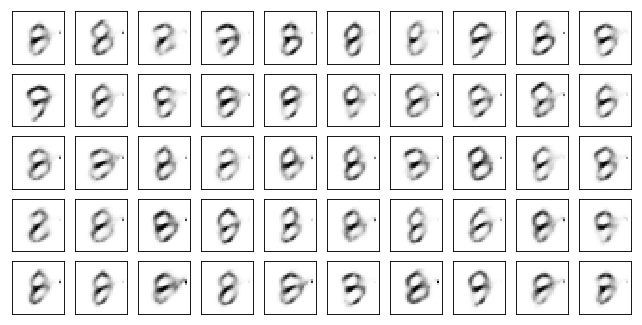

Test losses: AAE10: 0.1005
Train Epoch: 159 [0/50000 (0%)]	Losses AAE10: 0.1097
Train Epoch: 159 [10000/50000 (20%)]	Losses AAE10: 0.1078
Train Epoch: 159 [20000/50000 (40%)]	Losses AAE10: 0.1053
Train Epoch: 159 [30000/50000 (60%)]	Losses AAE10: 0.1073
Train Epoch: 159 [40000/50000 (80%)]	Losses AAE10: 0.1061
Train Epoch: 159 [50000/50000 (100%)]	Losses AAE10: 0.1072


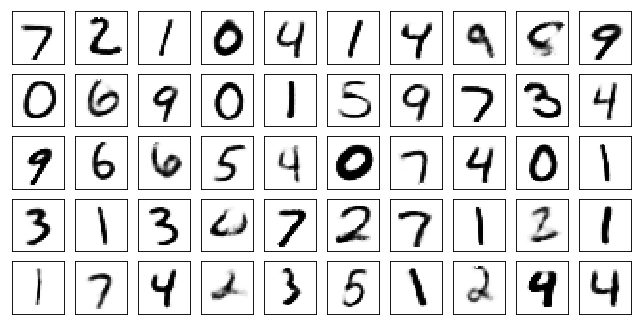

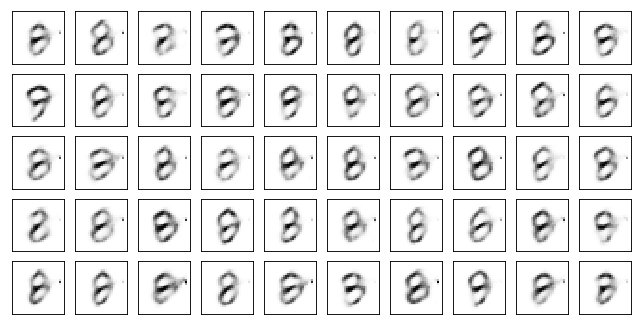

Test losses: AAE10: 0.1007
Train Epoch: 160 [0/50000 (0%)]	Losses AAE10: 0.1033
Train Epoch: 160 [10000/50000 (20%)]	Losses AAE10: 0.1179
Train Epoch: 160 [20000/50000 (40%)]	Losses AAE10: 0.1078
Train Epoch: 160 [30000/50000 (60%)]	Losses AAE10: 0.1063
Train Epoch: 160 [40000/50000 (80%)]	Losses AAE10: 0.1110
Train Epoch: 160 [50000/50000 (100%)]	Losses AAE10: 0.1136


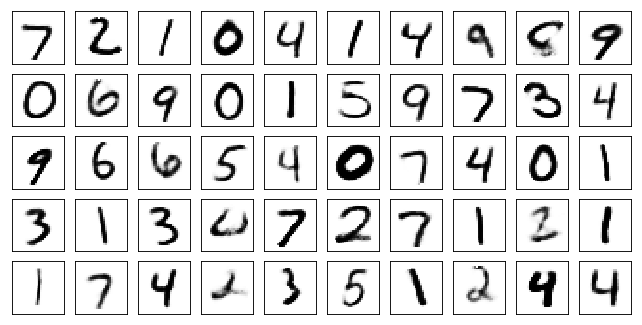

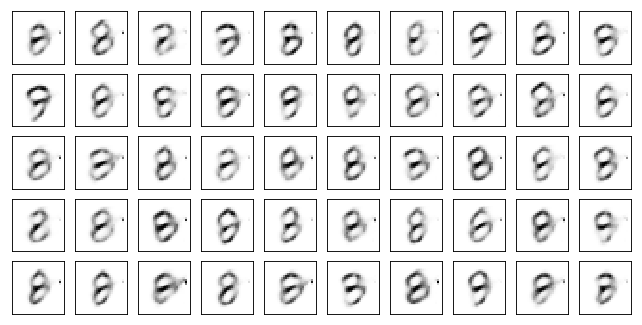

Test losses: AAE10: 0.1006
Train Epoch: 161 [0/50000 (0%)]	Losses AAE10: 0.1148
Train Epoch: 161 [10000/50000 (20%)]	Losses AAE10: 0.1110
Train Epoch: 161 [20000/50000 (40%)]	Losses AAE10: 0.1077
Train Epoch: 161 [30000/50000 (60%)]	Losses AAE10: 0.1140
Train Epoch: 161 [40000/50000 (80%)]	Losses AAE10: 0.1164
Train Epoch: 161 [50000/50000 (100%)]	Losses AAE10: 0.1108


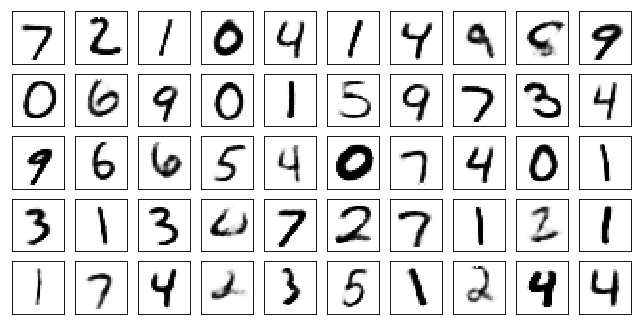

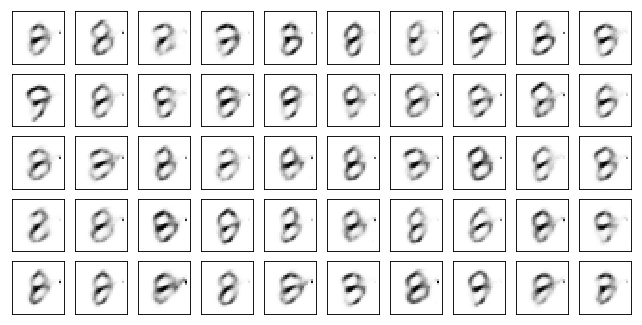

Test losses: AAE10: 0.1006
Train Epoch: 162 [0/50000 (0%)]	Losses AAE10: 0.1072
Train Epoch: 162 [10000/50000 (20%)]	Losses AAE10: 0.1076
Train Epoch: 162 [20000/50000 (40%)]	Losses AAE10: 0.1084
Train Epoch: 162 [30000/50000 (60%)]	Losses AAE10: 0.1127
Train Epoch: 162 [40000/50000 (80%)]	Losses AAE10: 0.1170
Train Epoch: 162 [50000/50000 (100%)]	Losses AAE10: 0.1115


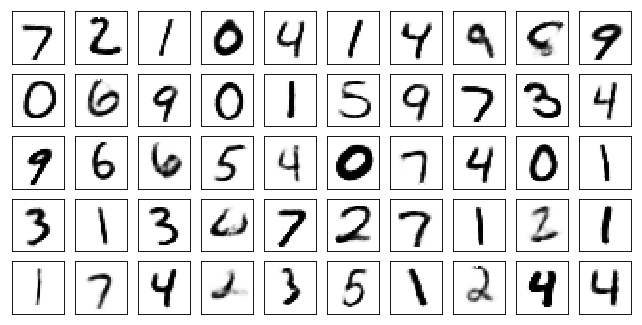

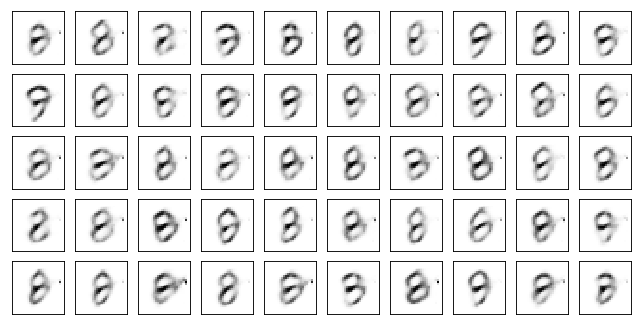

Test losses: AAE10: 0.1006
Train Epoch: 163 [0/50000 (0%)]	Losses AAE10: 0.1104
Train Epoch: 163 [10000/50000 (20%)]	Losses AAE10: 0.1111
Train Epoch: 163 [20000/50000 (40%)]	Losses AAE10: 0.1088
Train Epoch: 163 [30000/50000 (60%)]	Losses AAE10: 0.1069
Train Epoch: 163 [40000/50000 (80%)]	Losses AAE10: 0.1066
Train Epoch: 163 [50000/50000 (100%)]	Losses AAE10: 0.1099


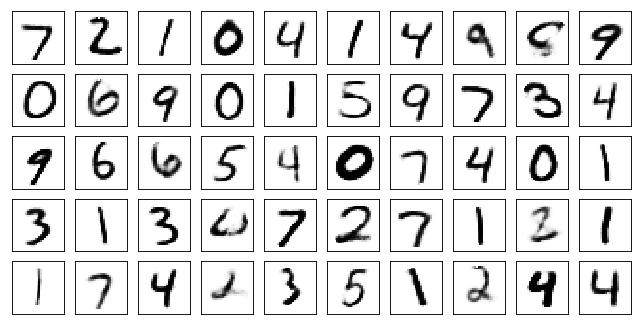

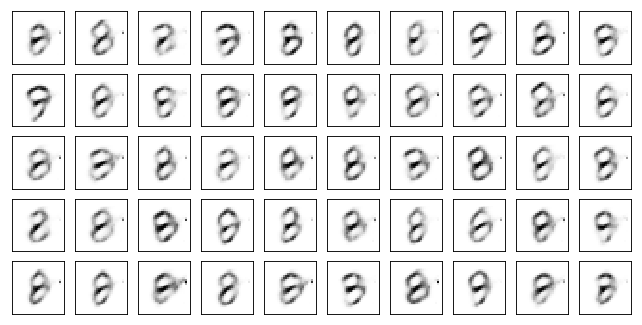

Test losses: AAE10: 0.1006
Train Epoch: 164 [0/50000 (0%)]	Losses AAE10: 0.1069
Train Epoch: 164 [10000/50000 (20%)]	Losses AAE10: 0.1030
Train Epoch: 164 [20000/50000 (40%)]	Losses AAE10: 0.1111
Train Epoch: 164 [30000/50000 (60%)]	Losses AAE10: 0.1126
Train Epoch: 164 [40000/50000 (80%)]	Losses AAE10: 0.1119
Train Epoch: 164 [50000/50000 (100%)]	Losses AAE10: 0.1121


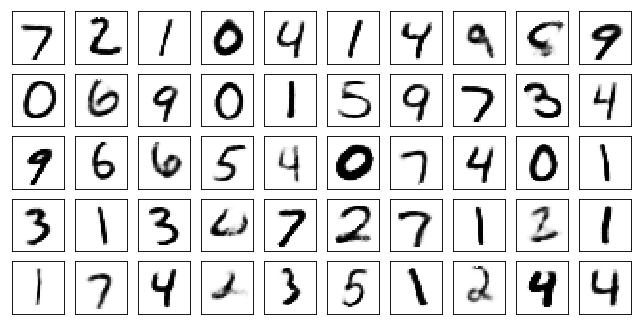

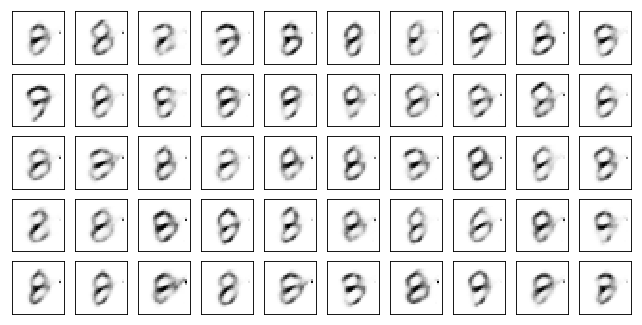

Test losses: AAE10: 0.1007
Train Epoch: 165 [0/50000 (0%)]	Losses AAE10: 0.1103
Train Epoch: 165 [10000/50000 (20%)]	Losses AAE10: 0.1151
Train Epoch: 165 [20000/50000 (40%)]	Losses AAE10: 0.1146
Train Epoch: 165 [30000/50000 (60%)]	Losses AAE10: 0.1018
Train Epoch: 165 [40000/50000 (80%)]	Losses AAE10: 0.1173
Train Epoch: 165 [50000/50000 (100%)]	Losses AAE10: 0.1106


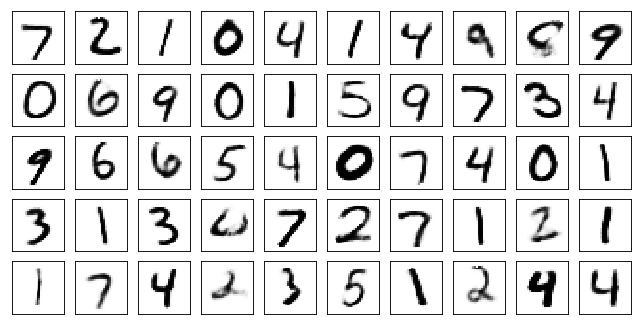

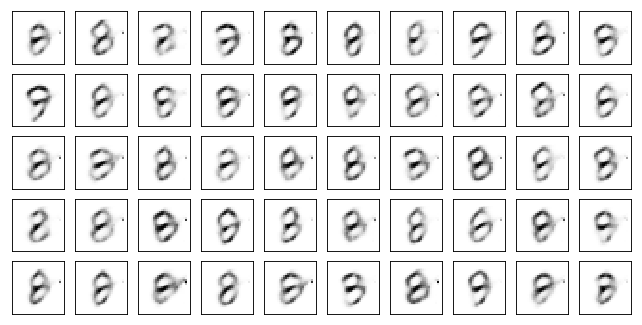

Test losses: AAE10: 0.1007
Train Epoch: 166 [0/50000 (0%)]	Losses AAE10: 0.1130
Train Epoch: 166 [10000/50000 (20%)]	Losses AAE10: 0.1090
Train Epoch: 166 [20000/50000 (40%)]	Losses AAE10: 0.1084
Train Epoch: 166 [30000/50000 (60%)]	Losses AAE10: 0.1074
Train Epoch: 166 [40000/50000 (80%)]	Losses AAE10: 0.1164
Train Epoch: 166 [50000/50000 (100%)]	Losses AAE10: 0.1092


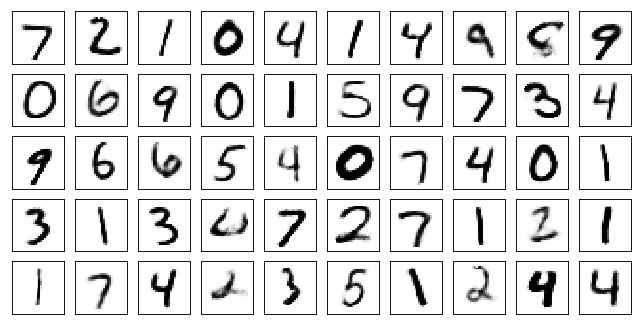

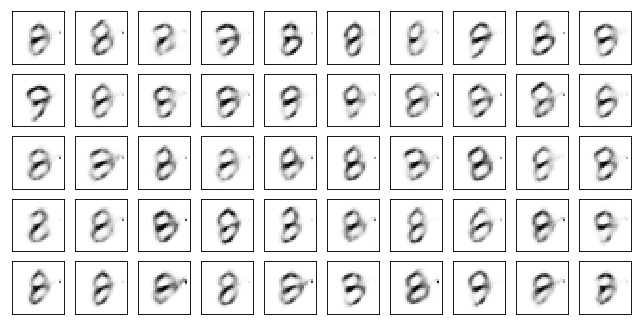

Test losses: AAE10: 0.1005
Train Epoch: 167 [0/50000 (0%)]	Losses AAE10: 0.1047
Train Epoch: 167 [10000/50000 (20%)]	Losses AAE10: 0.1092
Train Epoch: 167 [20000/50000 (40%)]	Losses AAE10: 0.1117
Train Epoch: 167 [30000/50000 (60%)]	Losses AAE10: 0.1164
Train Epoch: 167 [40000/50000 (80%)]	Losses AAE10: 0.1084
Train Epoch: 167 [50000/50000 (100%)]	Losses AAE10: 0.1186


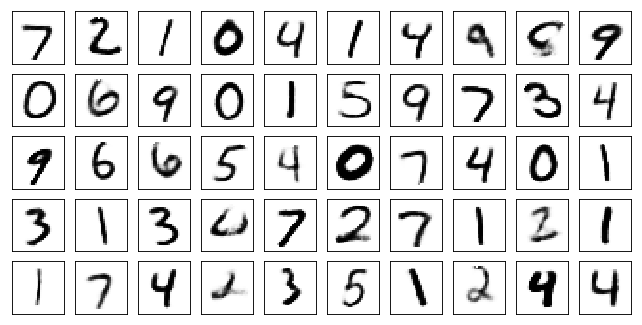

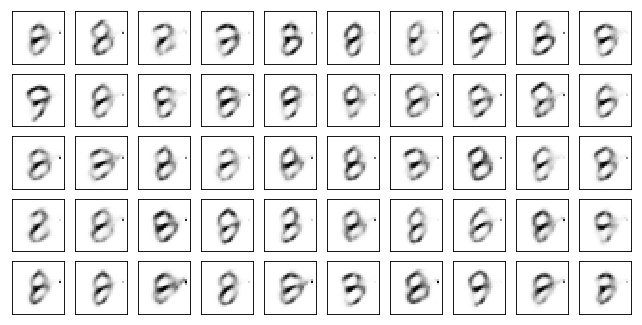

Test losses: AAE10: 0.1005
Train Epoch: 168 [0/50000 (0%)]	Losses AAE10: 0.1083
Train Epoch: 168 [10000/50000 (20%)]	Losses AAE10: 0.1104
Train Epoch: 168 [20000/50000 (40%)]	Losses AAE10: 0.1070
Train Epoch: 168 [30000/50000 (60%)]	Losses AAE10: 0.1140
Train Epoch: 168 [40000/50000 (80%)]	Losses AAE10: 0.1048
Train Epoch: 168 [50000/50000 (100%)]	Losses AAE10: 0.1058


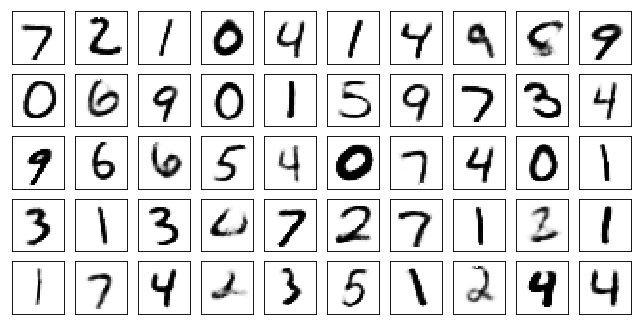

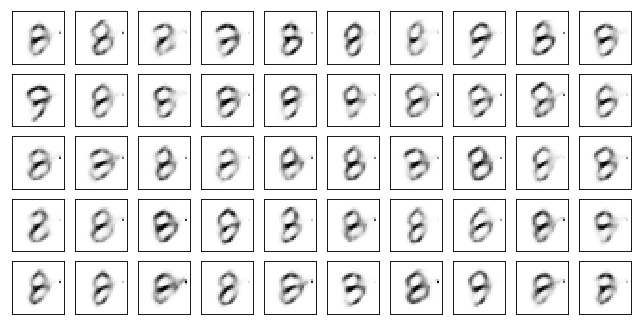

Test losses: AAE10: 0.1005
Train Epoch: 169 [0/50000 (0%)]	Losses AAE10: 0.1072
Train Epoch: 169 [10000/50000 (20%)]	Losses AAE10: 0.1068
Train Epoch: 169 [20000/50000 (40%)]	Losses AAE10: 0.1070
Train Epoch: 169 [30000/50000 (60%)]	Losses AAE10: 0.1184
Train Epoch: 169 [40000/50000 (80%)]	Losses AAE10: 0.1068
Train Epoch: 169 [50000/50000 (100%)]	Losses AAE10: 0.1133


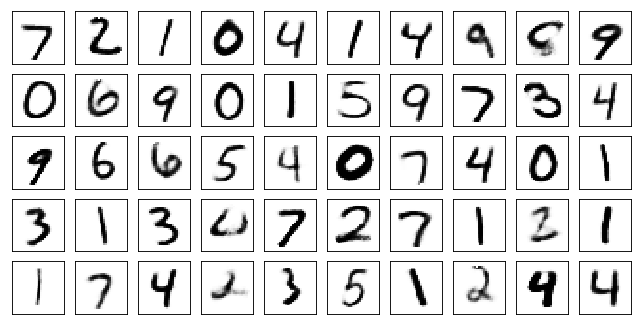

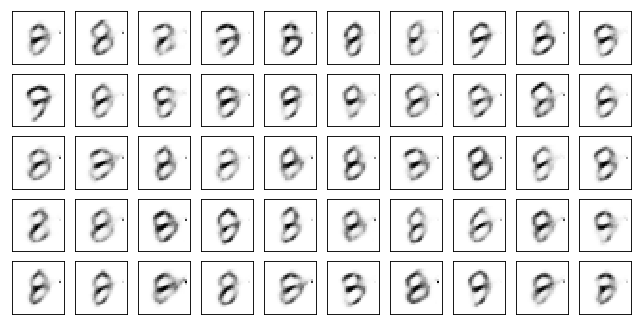

Test losses: AAE10: 0.1004
Train Epoch: 170 [0/50000 (0%)]	Losses AAE10: 0.1036
Train Epoch: 170 [10000/50000 (20%)]	Losses AAE10: 0.1228
Train Epoch: 170 [20000/50000 (40%)]	Losses AAE10: 0.1116
Train Epoch: 170 [30000/50000 (60%)]	Losses AAE10: 0.1087
Train Epoch: 170 [40000/50000 (80%)]	Losses AAE10: 0.1024
Train Epoch: 170 [50000/50000 (100%)]	Losses AAE10: 0.1090


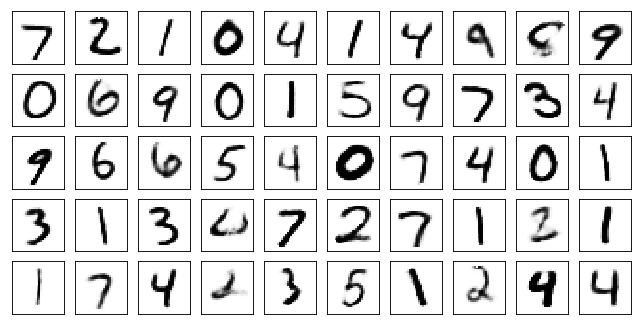

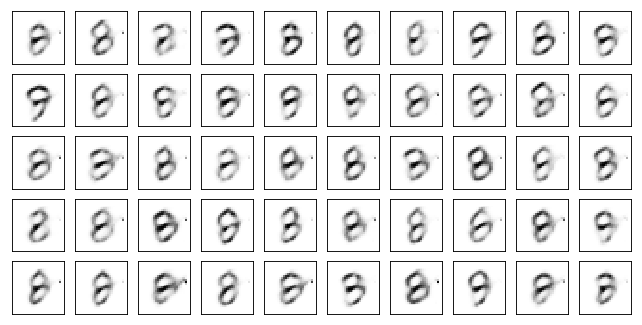

Test losses: AAE10: 0.1006
Train Epoch: 171 [0/50000 (0%)]	Losses AAE10: 0.1071
Train Epoch: 171 [10000/50000 (20%)]	Losses AAE10: 0.1033
Train Epoch: 171 [20000/50000 (40%)]	Losses AAE10: 0.1059
Train Epoch: 171 [30000/50000 (60%)]	Losses AAE10: 0.1051
Train Epoch: 171 [40000/50000 (80%)]	Losses AAE10: 0.1129
Train Epoch: 171 [50000/50000 (100%)]	Losses AAE10: 0.1091


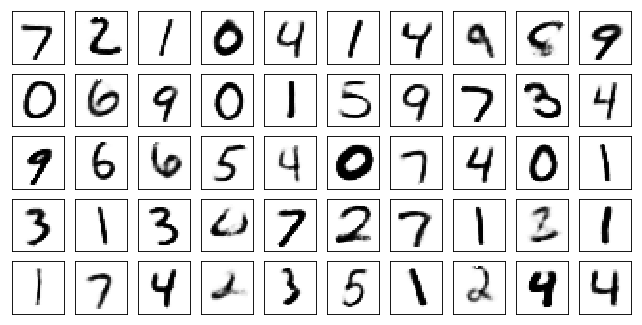

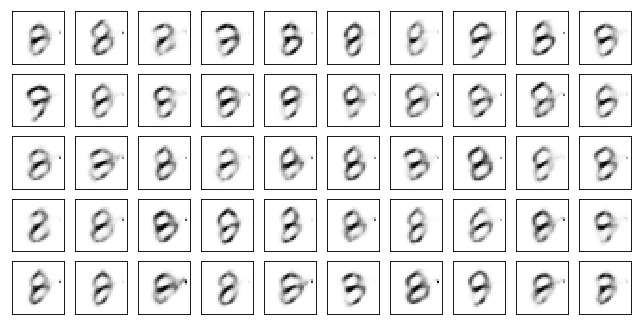

Test losses: AAE10: 0.1004
Train Epoch: 172 [0/50000 (0%)]	Losses AAE10: 0.1092
Train Epoch: 172 [10000/50000 (20%)]	Losses AAE10: 0.1115
Train Epoch: 172 [20000/50000 (40%)]	Losses AAE10: 0.1065
Train Epoch: 172 [30000/50000 (60%)]	Losses AAE10: 0.1047
Train Epoch: 172 [40000/50000 (80%)]	Losses AAE10: 0.1033
Train Epoch: 172 [50000/50000 (100%)]	Losses AAE10: 0.1118


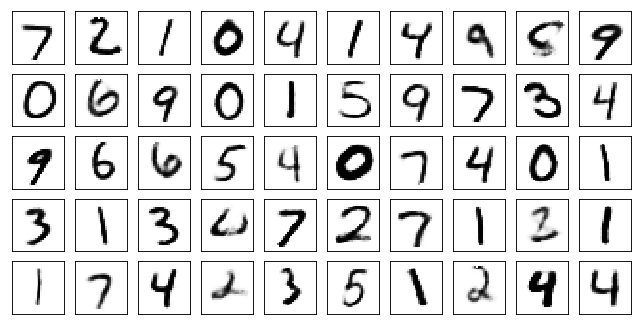

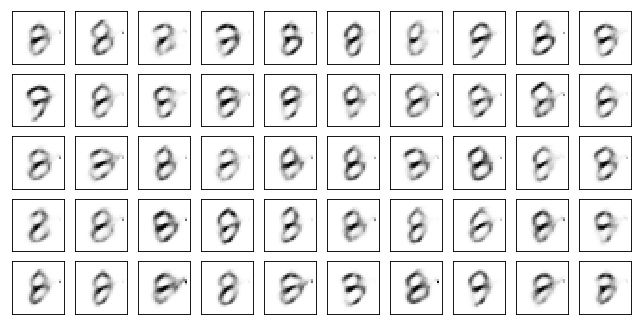

Test losses: AAE10: 0.1004
Train Epoch: 173 [0/50000 (0%)]	Losses AAE10: 0.1070
Train Epoch: 173 [10000/50000 (20%)]	Losses AAE10: 0.1077
Train Epoch: 173 [20000/50000 (40%)]	Losses AAE10: 0.1050
Train Epoch: 173 [30000/50000 (60%)]	Losses AAE10: 0.1083
Train Epoch: 173 [40000/50000 (80%)]	Losses AAE10: 0.1148
Train Epoch: 173 [50000/50000 (100%)]	Losses AAE10: 0.1034


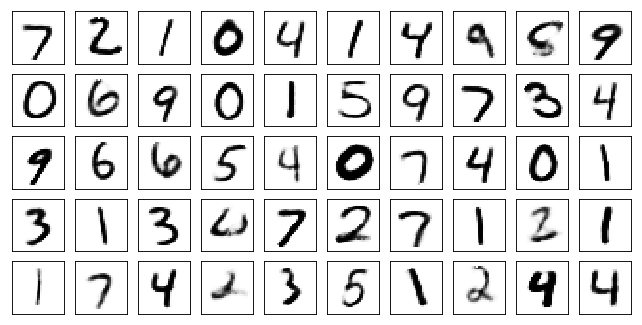

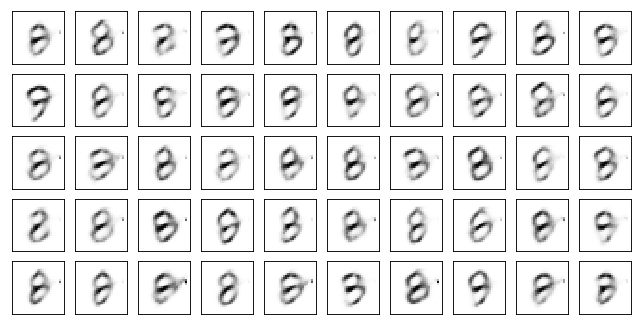

Test losses: AAE10: 0.1006
Train Epoch: 174 [0/50000 (0%)]	Losses AAE10: 0.1043
Train Epoch: 174 [10000/50000 (20%)]	Losses AAE10: 0.1156
Train Epoch: 174 [20000/50000 (40%)]	Losses AAE10: 0.1125
Train Epoch: 174 [30000/50000 (60%)]	Losses AAE10: 0.1049
Train Epoch: 174 [40000/50000 (80%)]	Losses AAE10: 0.1090
Train Epoch: 174 [50000/50000 (100%)]	Losses AAE10: 0.1035


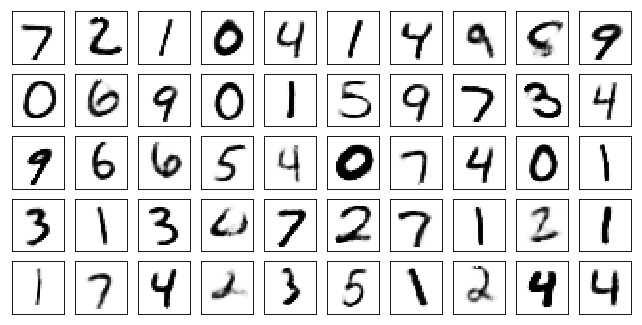

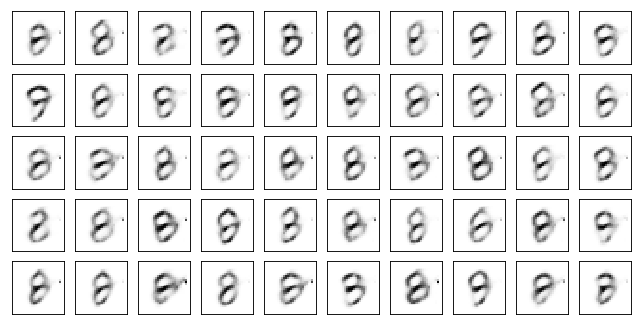

Test losses: AAE10: 0.1005
Train Epoch: 175 [0/50000 (0%)]	Losses AAE10: 0.1084
Train Epoch: 175 [10000/50000 (20%)]	Losses AAE10: 0.1131
Train Epoch: 175 [20000/50000 (40%)]	Losses AAE10: 0.1156
Train Epoch: 175 [30000/50000 (60%)]	Losses AAE10: 0.1107
Train Epoch: 175 [40000/50000 (80%)]	Losses AAE10: 0.1112
Train Epoch: 175 [50000/50000 (100%)]	Losses AAE10: 0.1120


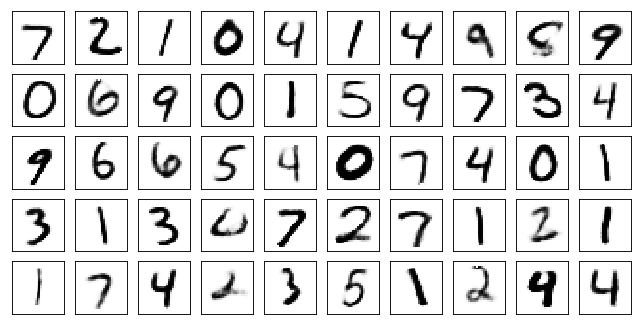

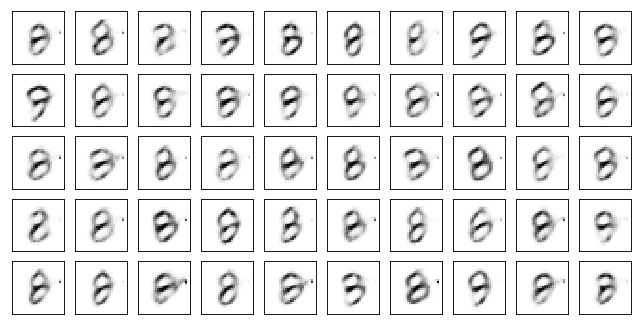

Test losses: AAE10: 0.1005
Train Epoch: 176 [0/50000 (0%)]	Losses AAE10: 0.1091
Train Epoch: 176 [10000/50000 (20%)]	Losses AAE10: 0.1207
Train Epoch: 176 [20000/50000 (40%)]	Losses AAE10: 0.1110
Train Epoch: 176 [30000/50000 (60%)]	Losses AAE10: 0.1164
Train Epoch: 176 [40000/50000 (80%)]	Losses AAE10: 0.1122
Train Epoch: 176 [50000/50000 (100%)]	Losses AAE10: 0.1090


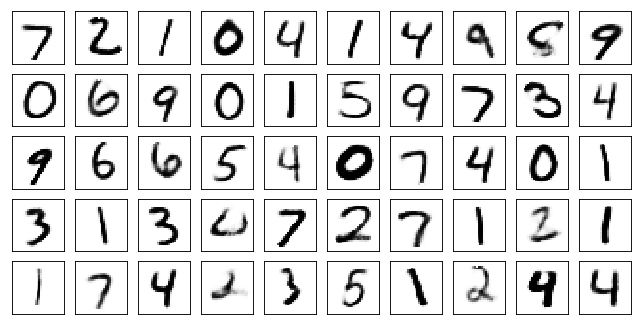

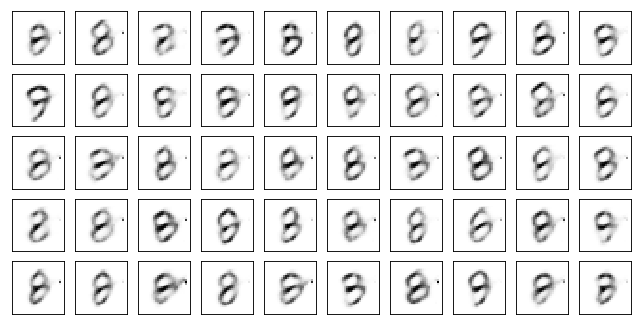

Test losses: AAE10: 0.1003
Train Epoch: 177 [0/50000 (0%)]	Losses AAE10: 0.1077
Train Epoch: 177 [10000/50000 (20%)]	Losses AAE10: 0.1136
Train Epoch: 177 [20000/50000 (40%)]	Losses AAE10: 0.1093
Train Epoch: 177 [30000/50000 (60%)]	Losses AAE10: 0.1144
Train Epoch: 177 [40000/50000 (80%)]	Losses AAE10: 0.1103
Train Epoch: 177 [50000/50000 (100%)]	Losses AAE10: 0.1094


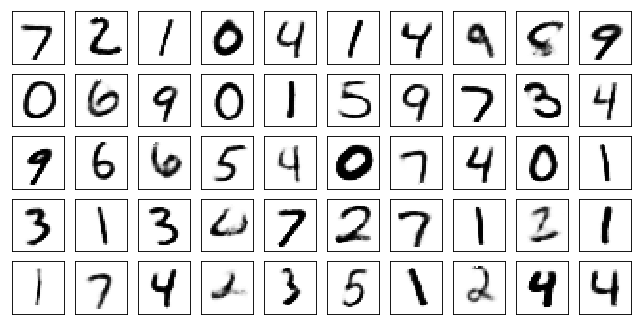

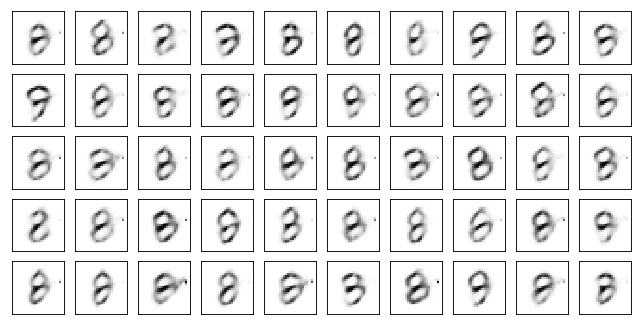

Test losses: AAE10: 0.1004
Train Epoch: 178 [0/50000 (0%)]	Losses AAE10: 0.1035
Train Epoch: 178 [10000/50000 (20%)]	Losses AAE10: 0.1078
Train Epoch: 178 [20000/50000 (40%)]	Losses AAE10: 0.1079
Train Epoch: 178 [30000/50000 (60%)]	Losses AAE10: 0.1057
Train Epoch: 178 [40000/50000 (80%)]	Losses AAE10: 0.1155
Train Epoch: 178 [50000/50000 (100%)]	Losses AAE10: 0.1164


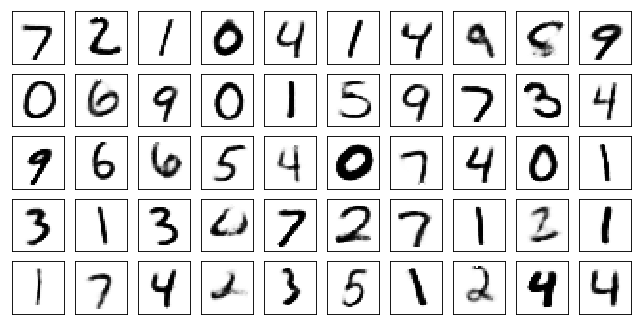

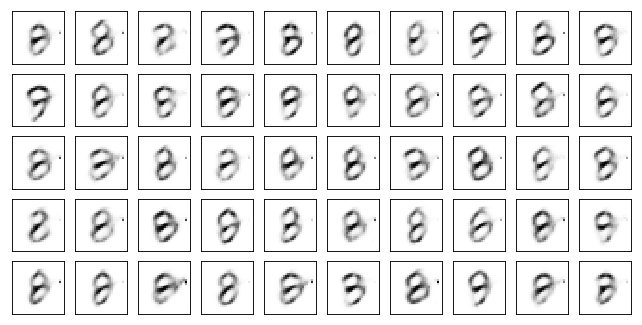

Test losses: AAE10: 0.1003
Train Epoch: 179 [0/50000 (0%)]	Losses AAE10: 0.1071
Train Epoch: 179 [10000/50000 (20%)]	Losses AAE10: 0.1032
Train Epoch: 179 [20000/50000 (40%)]	Losses AAE10: 0.1152
Train Epoch: 179 [30000/50000 (60%)]	Losses AAE10: 0.1149
Train Epoch: 179 [40000/50000 (80%)]	Losses AAE10: 0.1071
Train Epoch: 179 [50000/50000 (100%)]	Losses AAE10: 0.1111


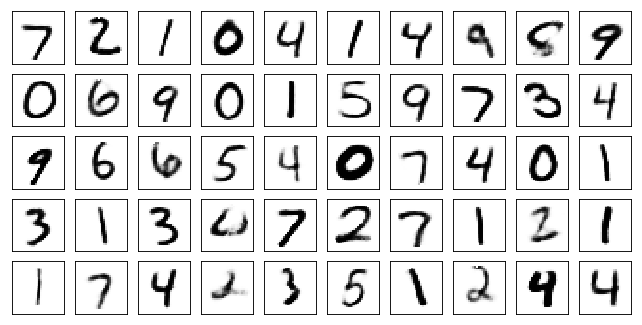

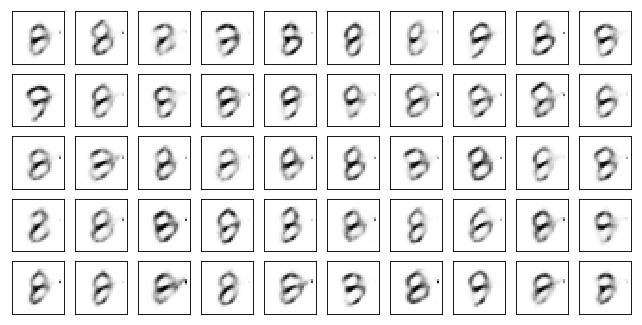

Test losses: AAE10: 0.1003
Train Epoch: 180 [0/50000 (0%)]	Losses AAE10: 0.1097
Train Epoch: 180 [10000/50000 (20%)]	Losses AAE10: 0.1039
Train Epoch: 180 [20000/50000 (40%)]	Losses AAE10: 0.1045
Train Epoch: 180 [30000/50000 (60%)]	Losses AAE10: 0.1076
Train Epoch: 180 [40000/50000 (80%)]	Losses AAE10: 0.1089
Train Epoch: 180 [50000/50000 (100%)]	Losses AAE10: 0.1062


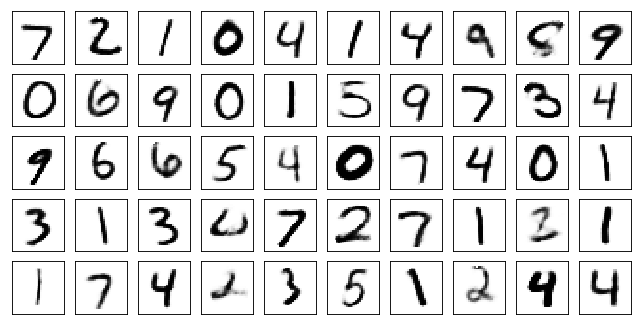

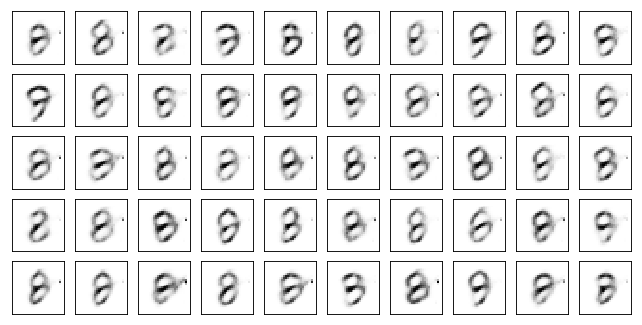

Test losses: AAE10: 0.1005
Train Epoch: 181 [0/50000 (0%)]	Losses AAE10: 0.1020
Train Epoch: 181 [10000/50000 (20%)]	Losses AAE10: 0.1124
Train Epoch: 181 [20000/50000 (40%)]	Losses AAE10: 0.1134
Train Epoch: 181 [30000/50000 (60%)]	Losses AAE10: 0.1115
Train Epoch: 181 [40000/50000 (80%)]	Losses AAE10: 0.1090
Train Epoch: 181 [50000/50000 (100%)]	Losses AAE10: 0.1021


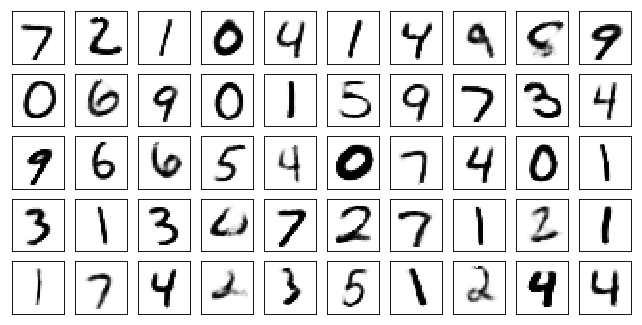

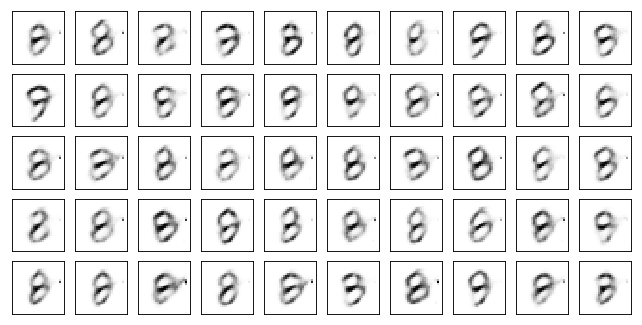

Test losses: AAE10: 0.1003
Train Epoch: 182 [0/50000 (0%)]	Losses AAE10: 0.1049
Train Epoch: 182 [10000/50000 (20%)]	Losses AAE10: 0.1110
Train Epoch: 182 [20000/50000 (40%)]	Losses AAE10: 0.1108
Train Epoch: 182 [30000/50000 (60%)]	Losses AAE10: 0.1045
Train Epoch: 182 [40000/50000 (80%)]	Losses AAE10: 0.1100
Train Epoch: 182 [50000/50000 (100%)]	Losses AAE10: 0.1087


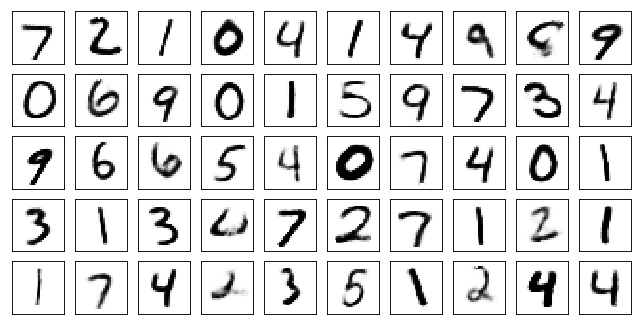

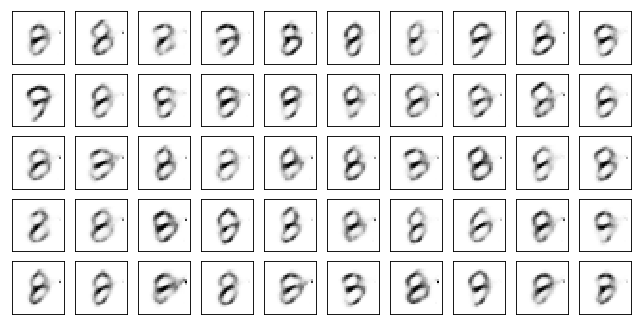

Test losses: AAE10: 0.1003
Train Epoch: 183 [0/50000 (0%)]	Losses AAE10: 0.1042
Train Epoch: 183 [10000/50000 (20%)]	Losses AAE10: 0.1085
Train Epoch: 183 [20000/50000 (40%)]	Losses AAE10: 0.1048
Train Epoch: 183 [30000/50000 (60%)]	Losses AAE10: 0.1208
Train Epoch: 183 [40000/50000 (80%)]	Losses AAE10: 0.1094
Train Epoch: 183 [50000/50000 (100%)]	Losses AAE10: 0.1100


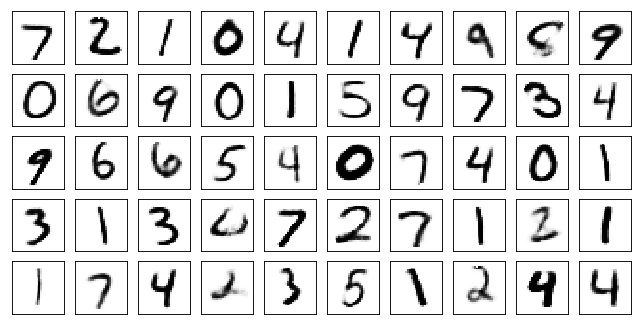

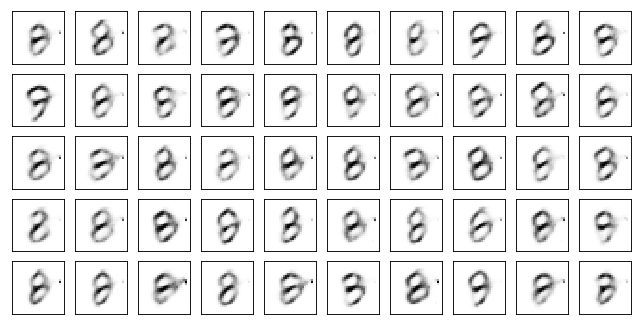

Test losses: AAE10: 0.1003
Train Epoch: 184 [0/50000 (0%)]	Losses AAE10: 0.1046
Train Epoch: 184 [10000/50000 (20%)]	Losses AAE10: 0.1103
Train Epoch: 184 [20000/50000 (40%)]	Losses AAE10: 0.1099
Train Epoch: 184 [30000/50000 (60%)]	Losses AAE10: 0.1125
Train Epoch: 184 [40000/50000 (80%)]	Losses AAE10: 0.1074
Train Epoch: 184 [50000/50000 (100%)]	Losses AAE10: 0.1114


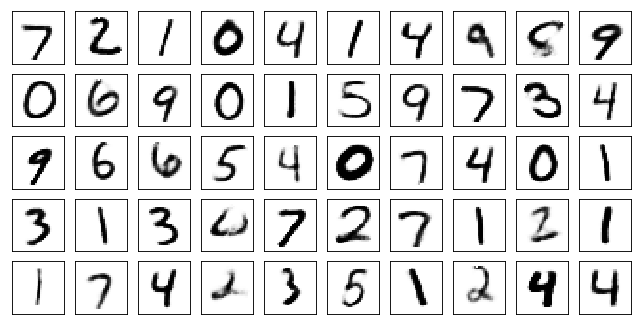

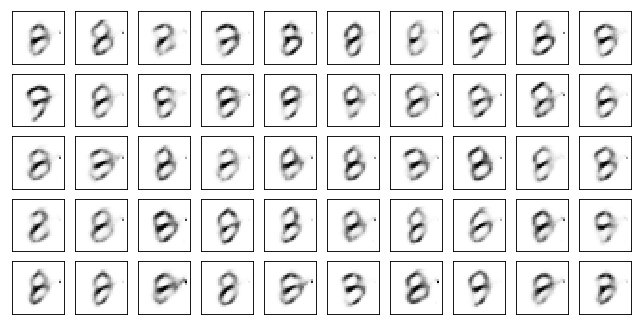

Test losses: AAE10: 0.1001
Train Epoch: 185 [0/50000 (0%)]	Losses AAE10: 0.1140
Train Epoch: 185 [10000/50000 (20%)]	Losses AAE10: 0.1140
Train Epoch: 185 [20000/50000 (40%)]	Losses AAE10: 0.1157
Train Epoch: 185 [30000/50000 (60%)]	Losses AAE10: 0.1057
Train Epoch: 185 [40000/50000 (80%)]	Losses AAE10: 0.1106
Train Epoch: 185 [50000/50000 (100%)]	Losses AAE10: 0.1054


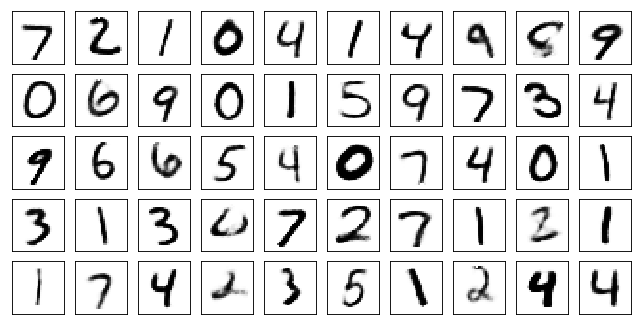

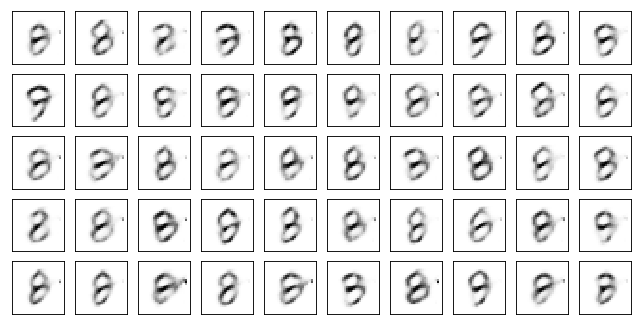

Test losses: AAE10: 0.1002
Train Epoch: 186 [0/50000 (0%)]	Losses AAE10: 0.1107
Train Epoch: 186 [10000/50000 (20%)]	Losses AAE10: 0.1089
Train Epoch: 186 [20000/50000 (40%)]	Losses AAE10: 0.1057
Train Epoch: 186 [30000/50000 (60%)]	Losses AAE10: 0.1154
Train Epoch: 186 [40000/50000 (80%)]	Losses AAE10: 0.1116
Train Epoch: 186 [50000/50000 (100%)]	Losses AAE10: 0.1115


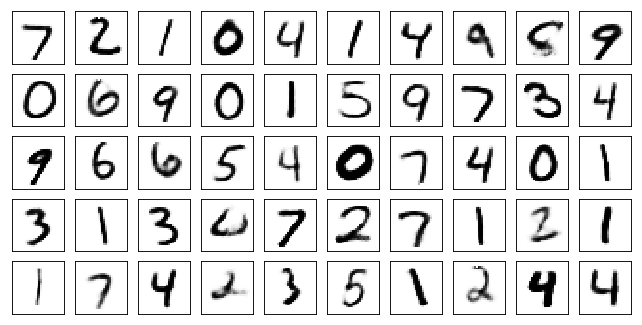

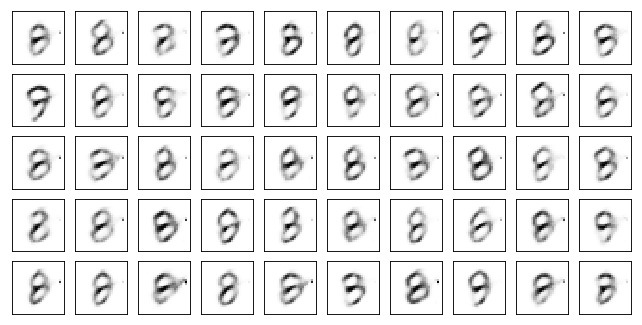

Test losses: AAE10: 0.1003
Train Epoch: 187 [0/50000 (0%)]	Losses AAE10: 0.1075
Train Epoch: 187 [10000/50000 (20%)]	Losses AAE10: 0.1065
Train Epoch: 187 [20000/50000 (40%)]	Losses AAE10: 0.1077
Train Epoch: 187 [30000/50000 (60%)]	Losses AAE10: 0.1093
Train Epoch: 187 [40000/50000 (80%)]	Losses AAE10: 0.1110
Train Epoch: 187 [50000/50000 (100%)]	Losses AAE10: 0.1185


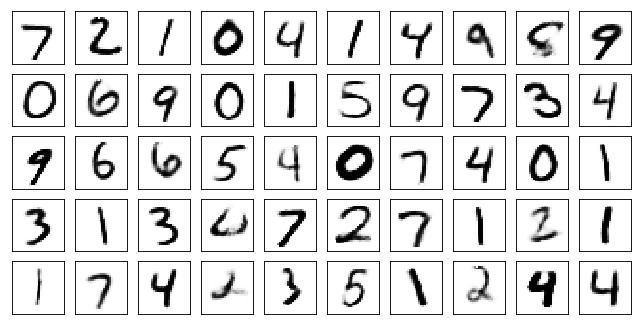

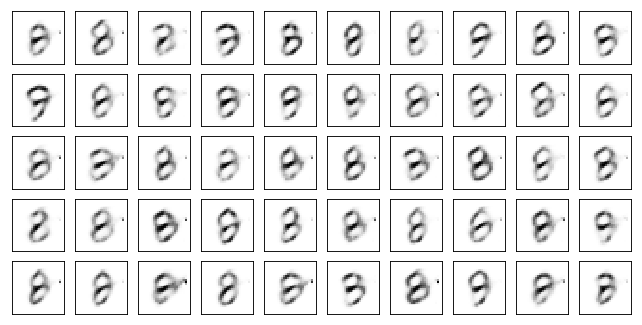

Test losses: AAE10: 0.1002
Train Epoch: 188 [0/50000 (0%)]	Losses AAE10: 0.1063
Train Epoch: 188 [10000/50000 (20%)]	Losses AAE10: 0.1050
Train Epoch: 188 [20000/50000 (40%)]	Losses AAE10: 0.1130
Train Epoch: 188 [30000/50000 (60%)]	Losses AAE10: 0.1046
Train Epoch: 188 [40000/50000 (80%)]	Losses AAE10: 0.1092
Train Epoch: 188 [50000/50000 (100%)]	Losses AAE10: 0.1138


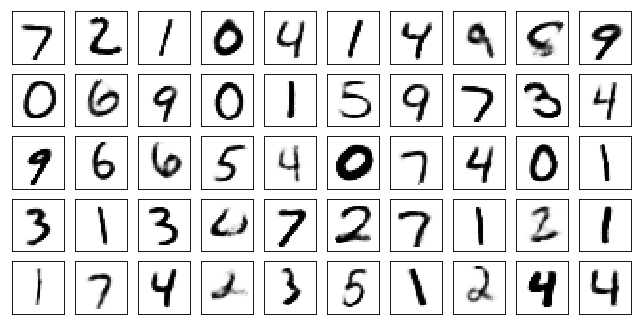

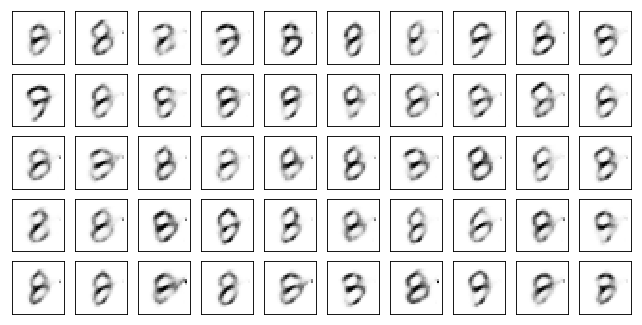

Test losses: AAE10: 0.1002
Train Epoch: 189 [0/50000 (0%)]	Losses AAE10: 0.1061
Train Epoch: 189 [10000/50000 (20%)]	Losses AAE10: 0.1048
Train Epoch: 189 [20000/50000 (40%)]	Losses AAE10: 0.1135
Train Epoch: 189 [30000/50000 (60%)]	Losses AAE10: 0.1164
Train Epoch: 189 [40000/50000 (80%)]	Losses AAE10: 0.1088
Train Epoch: 189 [50000/50000 (100%)]	Losses AAE10: 0.1118


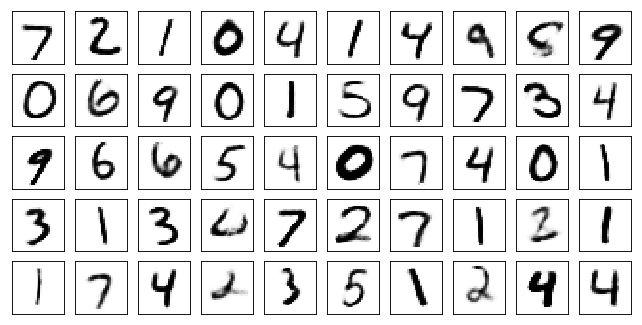

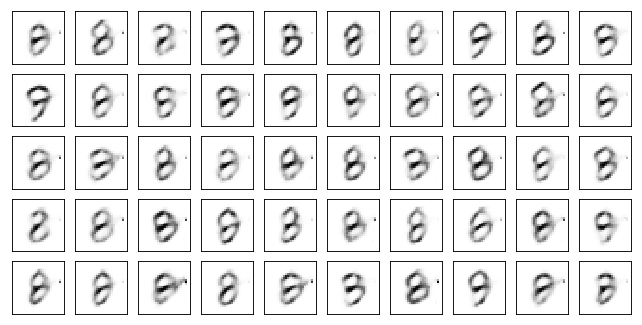

Test losses: AAE10: 0.1000
Train Epoch: 190 [0/50000 (0%)]	Losses AAE10: 0.1088
Train Epoch: 190 [10000/50000 (20%)]	Losses AAE10: 0.1045
Train Epoch: 190 [20000/50000 (40%)]	Losses AAE10: 0.1055
Train Epoch: 190 [30000/50000 (60%)]	Losses AAE10: 0.1119
Train Epoch: 190 [40000/50000 (80%)]	Losses AAE10: 0.1045
Train Epoch: 190 [50000/50000 (100%)]	Losses AAE10: 0.1097


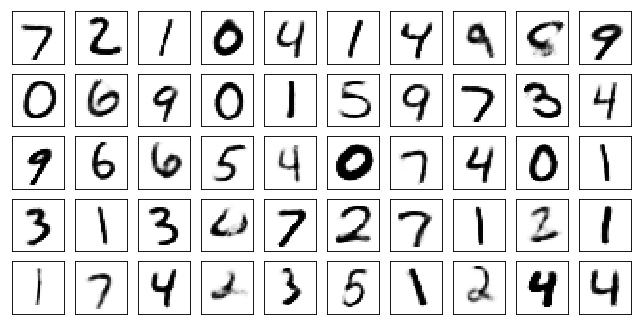

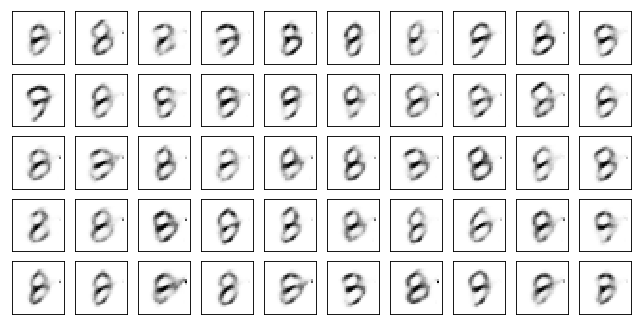

Test losses: AAE10: 0.1001
Train Epoch: 191 [0/50000 (0%)]	Losses AAE10: 0.1078
Train Epoch: 191 [10000/50000 (20%)]	Losses AAE10: 0.1079
Train Epoch: 191 [20000/50000 (40%)]	Losses AAE10: 0.1098
Train Epoch: 191 [30000/50000 (60%)]	Losses AAE10: 0.1080
Train Epoch: 191 [40000/50000 (80%)]	Losses AAE10: 0.1114
Train Epoch: 191 [50000/50000 (100%)]	Losses AAE10: 0.1098


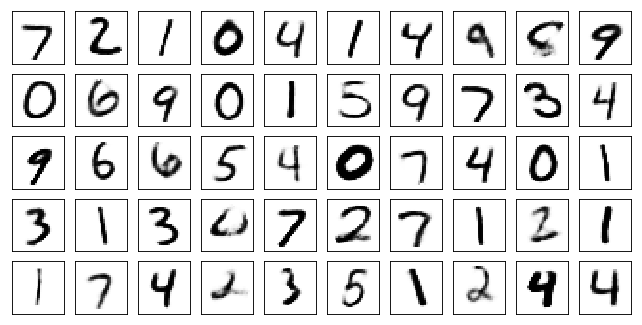

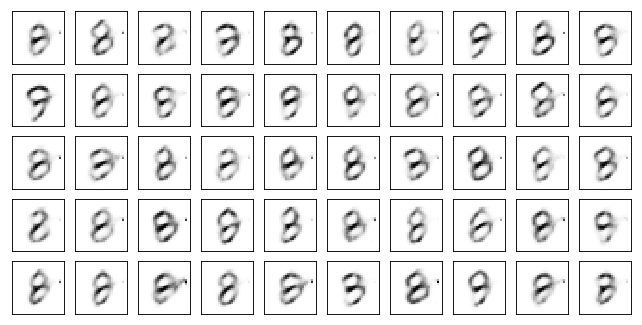

Test losses: AAE10: 0.1000
Train Epoch: 192 [0/50000 (0%)]	Losses AAE10: 0.1079
Train Epoch: 192 [10000/50000 (20%)]	Losses AAE10: 0.1124
Train Epoch: 192 [20000/50000 (40%)]	Losses AAE10: 0.1133
Train Epoch: 192 [30000/50000 (60%)]	Losses AAE10: 0.1095
Train Epoch: 192 [40000/50000 (80%)]	Losses AAE10: 0.1095
Train Epoch: 192 [50000/50000 (100%)]	Losses AAE10: 0.1161


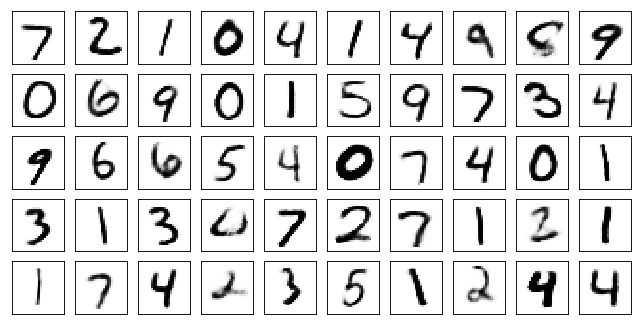

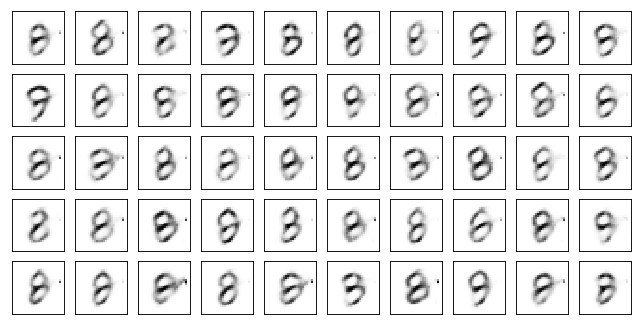

Test losses: AAE10: 0.1002
Train Epoch: 193 [0/50000 (0%)]	Losses AAE10: 0.1154
Train Epoch: 193 [10000/50000 (20%)]	Losses AAE10: 0.1083
Train Epoch: 193 [20000/50000 (40%)]	Losses AAE10: 0.1060
Train Epoch: 193 [30000/50000 (60%)]	Losses AAE10: 0.1141
Train Epoch: 193 [40000/50000 (80%)]	Losses AAE10: 0.1084
Train Epoch: 193 [50000/50000 (100%)]	Losses AAE10: 0.1106


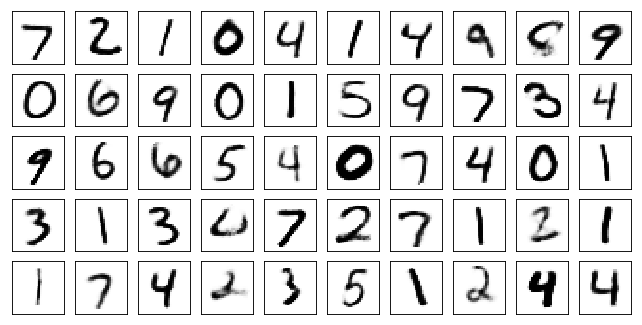

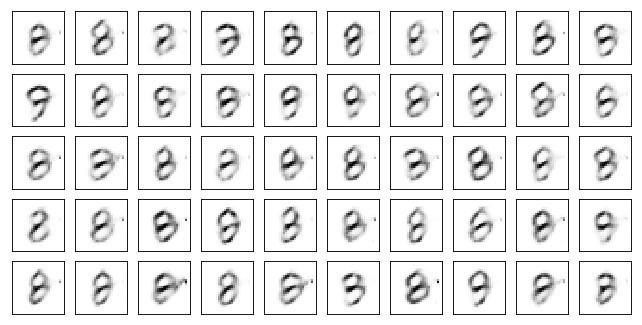

Test losses: AAE10: 0.1001
Train Epoch: 194 [0/50000 (0%)]	Losses AAE10: 0.1063
Train Epoch: 194 [10000/50000 (20%)]	Losses AAE10: 0.1114
Train Epoch: 194 [20000/50000 (40%)]	Losses AAE10: 0.1050
Train Epoch: 194 [30000/50000 (60%)]	Losses AAE10: 0.1087
Train Epoch: 194 [40000/50000 (80%)]	Losses AAE10: 0.1061
Train Epoch: 194 [50000/50000 (100%)]	Losses AAE10: 0.1131


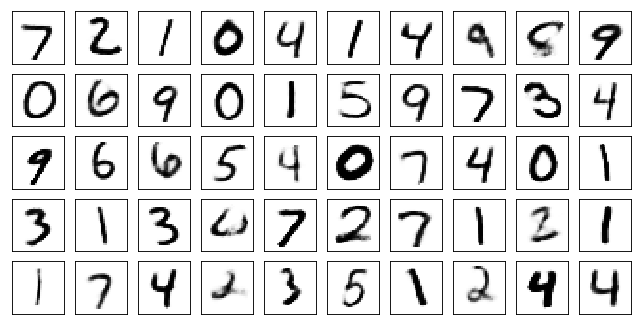

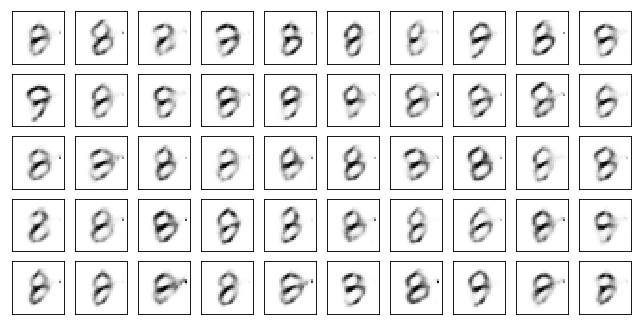

Test losses: AAE10: 0.1002
Train Epoch: 195 [0/50000 (0%)]	Losses AAE10: 0.1019
Train Epoch: 195 [10000/50000 (20%)]	Losses AAE10: 0.1000
Train Epoch: 195 [20000/50000 (40%)]	Losses AAE10: 0.1061
Train Epoch: 195 [30000/50000 (60%)]	Losses AAE10: 0.1135
Train Epoch: 195 [40000/50000 (80%)]	Losses AAE10: 0.1114
Train Epoch: 195 [50000/50000 (100%)]	Losses AAE10: 0.1098


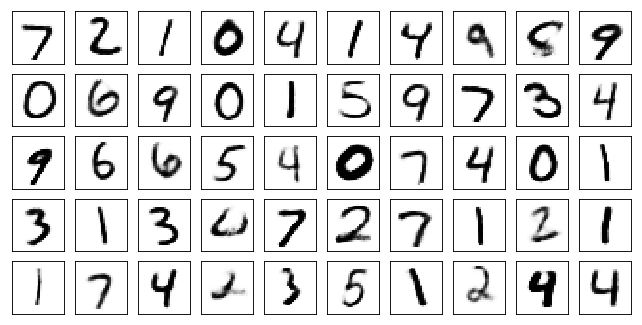

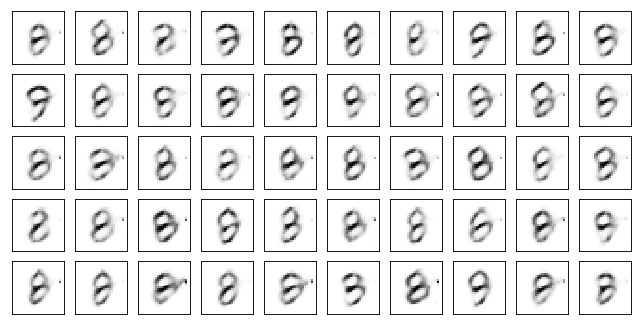

Test losses: AAE10: 0.1001
Train Epoch: 196 [0/50000 (0%)]	Losses AAE10: 0.1077
Train Epoch: 196 [10000/50000 (20%)]	Losses AAE10: 0.1077
Train Epoch: 196 [20000/50000 (40%)]	Losses AAE10: 0.1104
Train Epoch: 196 [30000/50000 (60%)]	Losses AAE10: 0.1064
Train Epoch: 196 [40000/50000 (80%)]	Losses AAE10: 0.1094
Train Epoch: 196 [50000/50000 (100%)]	Losses AAE10: 0.1085


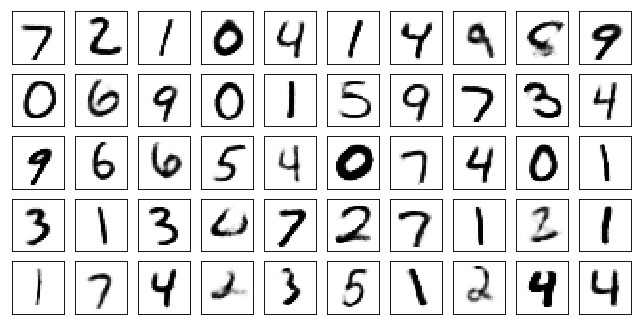

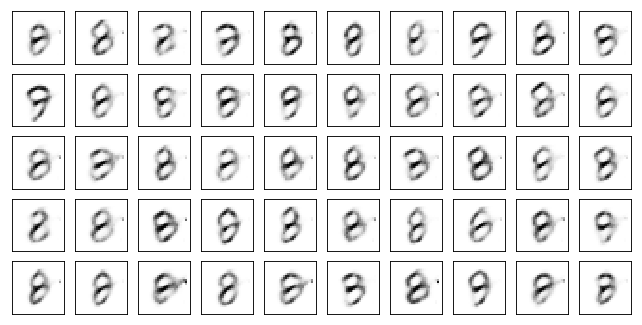

Test losses: AAE10: 0.0999
Train Epoch: 197 [0/50000 (0%)]	Losses AAE10: 0.1122
Train Epoch: 197 [10000/50000 (20%)]	Losses AAE10: 0.1186
Train Epoch: 197 [20000/50000 (40%)]	Losses AAE10: 0.1132
Train Epoch: 197 [30000/50000 (60%)]	Losses AAE10: 0.1039
Train Epoch: 197 [40000/50000 (80%)]	Losses AAE10: 0.1085
Train Epoch: 197 [50000/50000 (100%)]	Losses AAE10: 0.1153


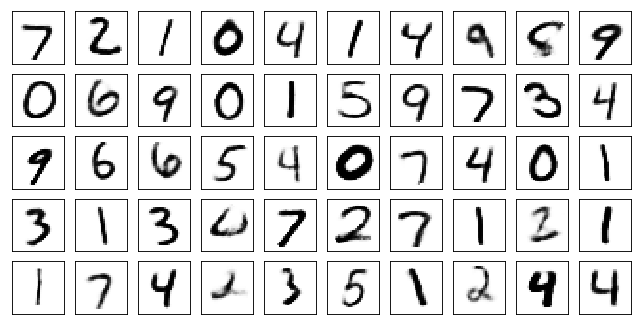

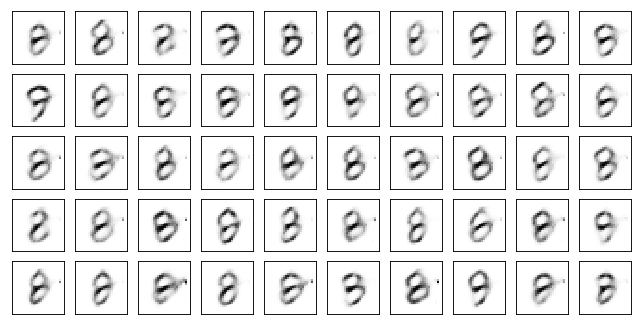

Test losses: AAE10: 0.1000
Train Epoch: 198 [0/50000 (0%)]	Losses AAE10: 0.1061
Train Epoch: 198 [10000/50000 (20%)]	Losses AAE10: 0.1037
Train Epoch: 198 [20000/50000 (40%)]	Losses AAE10: 0.1021
Train Epoch: 198 [30000/50000 (60%)]	Losses AAE10: 0.1076
Train Epoch: 198 [40000/50000 (80%)]	Losses AAE10: 0.1080
Train Epoch: 198 [50000/50000 (100%)]	Losses AAE10: 0.1190


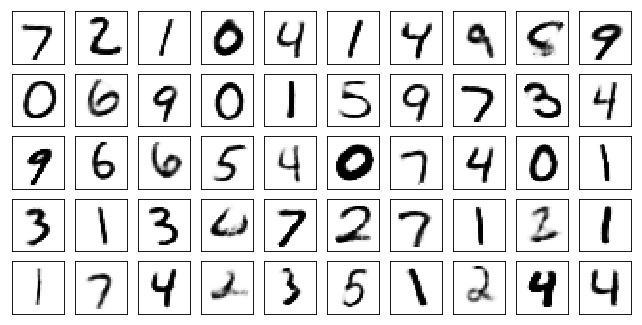

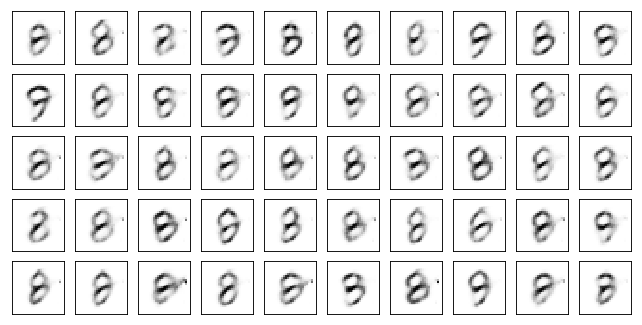

Test losses: AAE10: 0.1000
Train Epoch: 199 [0/50000 (0%)]	Losses AAE10: 0.1147
Train Epoch: 199 [10000/50000 (20%)]	Losses AAE10: 0.1105
Train Epoch: 199 [20000/50000 (40%)]	Losses AAE10: 0.1125
Train Epoch: 199 [30000/50000 (60%)]	Losses AAE10: 0.1208
Train Epoch: 199 [40000/50000 (80%)]	Losses AAE10: 0.1098
Train Epoch: 199 [50000/50000 (100%)]	Losses AAE10: 0.1170


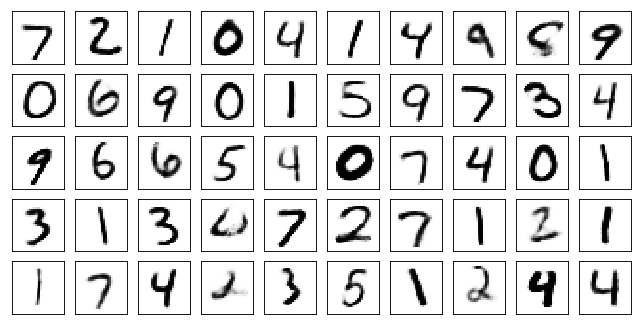

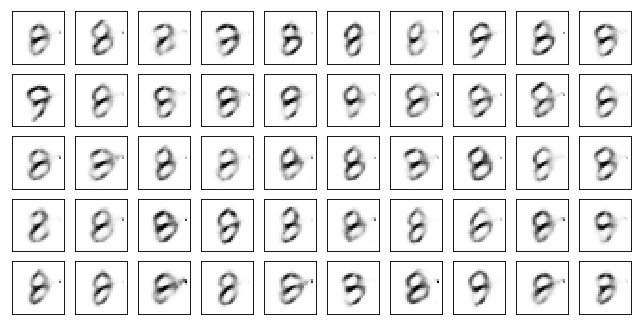

Test losses: AAE10: 0.0999


In [18]:
for epoch in range(1, 200):
    for model in models.values():
        model.train()
    train(epoch, models, train_log)
    for model in models.values():
        model.eval()
    test(models, valid_loader, epoch, test_log)

In [19]:
ner = models["AAE10"]

In [20]:
fixed_z = torch.randn((50, 10))


tensor([[-1.2616,  0.5626, -0.5605,  0.4047,  0.7196, -0.2627,  1.3012,  2.0239,
         -1.3836, -1.3815],
        [-0.5196,  0.0553, -0.0687, -1.6489,  1.3261,  0.1145,  0.5180, -0.3106,
          0.0238,  2.0050],
        [-1.4046, -0.2675, -0.2595, -0.2272, -1.5730, -1.2434, -1.4447,  2.0865,
          2.0322,  0.1860],
        [-0.4688, -0.9305, -1.1600, -0.6821, -0.7148, -1.5844,  0.3425,  1.4791,
         -1.0282, -1.1410],
        [-1.4610,  0.4491, -0.1651,  0.3470,  0.8207,  1.4002, -1.1605,  0.5023,
          0.5992,  0.1795],
        [ 1.2419,  0.2461,  0.2985,  0.3550,  0.3325, -1.8340, -1.1267, -2.3275,
         -2.4393,  0.9288],
        [-1.5854,  0.6470,  1.8928, -0.9993,  0.9952,  0.5296,  1.4986,  1.3202,
          0.3694,  0.5073],
        [ 1.2705, -0.5770,  0.1398,  1.3319,  0.9905, -0.1931,  0.2006,  0.1664,
         -1.0264,  0.9426],
        [-0.5413,  0.7620, -0.1115,  0.1928,  0.0560,  0.3930,  0.6675,  0.6668,
          1.5850, -0.1823],
        [ 0.1643, -

In [27]:
fixed_gen = ner.decode(fixed_z.to(device)).data.cpu().numpy()

In [23]:
device

device(type='cuda')

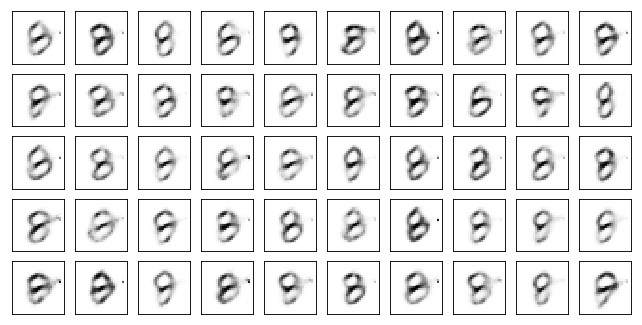

In [28]:
plot_mnist(fixed_gen, (5, 10))